<a href="https://colab.research.google.com/github/rajeshkpandey/AWESOME-FER/blob/master/Epidemics_ABM_Viral_low.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

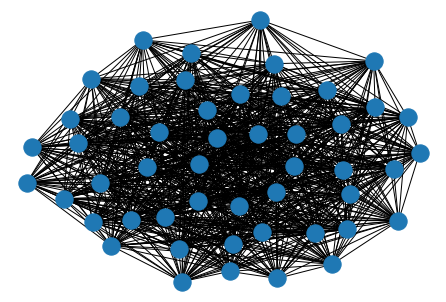

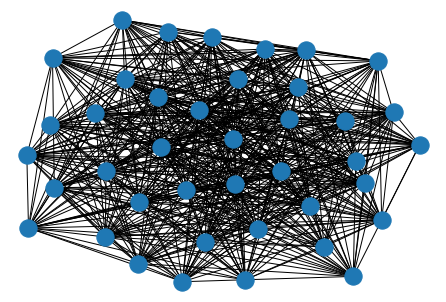

In [1]:
#Erdos-Renyi Graph in Networkx
import random
import copy
from networkx import nx
import matplotlib.pyplot as plt

N = 50  # 50 Indian Cities
K = 10000  # 10000 Agents(people under observation on SIR modeling)
#M = 30  # 30 Edges
NN = 40 # 50 nodes contact network of Cities


#Graph = nx.gnm_random_graph(N, M)

P = .7 #Probabibilty for Node Connection in random graph
PP = .7
Graph = nx.erdos_renyi_graph(N,P) # Use Networkx to generate a random graph of N nodes being connected with probability P.
GraphN = nx.erdos_renyi_graph(NN,PP)


# some network properties
#print("the adjacency list")
#for line in nx.generate_adjlist(Graph):
#    print(line)

nx.draw(Graph)
plt.show()
nx.draw(GraphN)
plt.show()

In [2]:
#!jupyter notebook --generate-config

In [3]:
#%%writefile /root/.jupyter/jupyter_notebook_config.py
#NotebookApp.iopub_data_rate_limit =
#NotebookApp.rate_limit_window =

In [4]:
#%pycat /root/.jupyter/jupyter_notebook_config.py

In [5]:
A = nx.adjacency_matrix(Graph)
Adjacency_matrix = A.todense()
AN = nx.adjacency_matrix(GraphN)
Adjacency_matrixN = AN.todense()
print(Adjacency_matrix)
print(Adjacency_matrixN)

[[0 1 0 ... 1 1 1]
 [1 0 0 ... 0 1 1]
 [0 0 0 ... 0 1 0]
 ...
 [1 0 0 ... 0 0 1]
 [1 1 1 ... 0 0 0]
 [1 1 0 ... 1 0 0]]
[[0 1 0 ... 0 0 0]
 [1 0 1 ... 1 1 1]
 [0 1 0 ... 0 0 1]
 ...
 [0 1 0 ... 0 0 1]
 [0 1 0 ... 0 0 1]
 [0 1 1 ... 1 1 0]]


In [6]:
#Empty Node Dictionary [ A Dictionary consisting list of agent states on Graph Nodes]
Node = {}
print(Node)
for i in range(N):
  for j in range(NN):
    Node[i*NN+j] = list()
#print(Node)
print(len(Node))


{}
2000


In [7]:
#Adding Viral_Index Randomly
for i in range(N):
  for j in range(NN):
    Viral_load=0
    Node[i*NN+j].append({'Viral_load' : Viral_load})
    Node[i*NN+j].append({'S' : 0})
    Node[i*NN+j].append({'I' : 0})
    Node[i*NN+j].append({'R' : 0})
#print(Node)
print(len(Node))


2000


In [8]:
#Initailizing randomly infection state [0 shows Susceptible, 1 shows Infected, and 2 shows Recovered]
Agent = {}
for k in range(K):
  Agent[k] = list() 
for k in range(K):
  Rand_node=random.randint(0,N-1)
  Neighbors = list(Graph.neighbors(Rand_node))
  Rand_nodeN=random.randint(0,NN-1)
  First_nodeN = random.randint(0,NN-1)
  Second_nodeN = random.randint(0,NN-1)
  Rand_state=random.choices([0,1],weights=(98,2),k=1)[0]
  Rand_neighbors = list(GraphN.neighbors(Rand_nodeN))
  Rand_neighbors1 = list(GraphN.neighbors(First_nodeN))
  Rand_neighbors2 = list(GraphN.neighbors(Second_nodeN))
  if len(Rand_neighbors) > 0:
    Rand_nodeN1=random.choice(Rand_neighbors)
    Rand_neighbors.remove(Rand_nodeN1)
  else:
    Rand_nodeN1=Rand_nodeN
  
  if len(Rand_neighbors) > 0:
    Rand_nodeN2=random.choice(Rand_neighbors)
    Rand_neighbors.remove(Rand_nodeN2)
    if Rand_nodeN2 not in list(GraphN.neighbors(Rand_nodeN1)):
      Rand_nodeN2=Rand_nodeN1
  else:
    Rand_nodeN2=Rand_nodeN1
  
  if Rand_state == 0:
    Node[Rand_node*NN+Rand_nodeN][1]['S']+=1
    Node[Rand_node*NN+Rand_nodeN].append({k : Rand_state})
    Agent[k].append({'State' : Rand_state})
  elif Rand_state == 1:
    Node[Rand_node*NN+Rand_nodeN][2]['I']+=1
    Node[Rand_node*NN+Rand_nodeN].append({k : Rand_state, 'V_l' : 1})
    Agent[k].append({'State' : Rand_state, 'V_l' : 1 })
  else:
    Node[Rand_node*NN+Rand_nodeN][3]['R']+=1
    Node[Rand_node*NN+Rand_nodeN].append({k : Rand_state})
    Agent[k].append({'State' : Rand_state})

  #Node[Rand_node*NN+Rand_nodeN].append({k : Rand_state})
  #Agent[k].append({'State' : Rand_state})
  Agent[k].append({'Home_node' : Rand_node})
  Agent[k].append({'Home_nodeN' : [Rand_nodeN, Rand_nodeN1, Rand_nodeN2]})
  
  if len(Neighbors) > 0:
    First_node = random.choice(Neighbors)
    Neighbors.remove(First_node)
  else:
    First_node = Rand_node
  if len(Neighbors) > 0:
    Second_node = random.choice(Neighbors)
  else:
    Second_node = Rand_node

  if len(Rand_neighbors1) > 0:
    First_nodeN1=random.choice(Rand_neighbors1)
    Rand_neighbors1.remove(First_nodeN1)
  else:
    First_nodeN1=First_nodeN
  
  if len(Rand_neighbors1) > 0:
    First_nodeN2=random.choice(Rand_neighbors1)
    Rand_neighbors1.remove(First_nodeN2)
    if First_nodeN2 not in list(GraphN.neighbors(First_nodeN1)):
      First_nodeN2=First_nodeN1
  else:
    First_nodeN2=First_nodeN1

  if len(Rand_neighbors2) > 0:
    Second_nodeN1=random.choice(Rand_neighbors2)
    Rand_neighbors2.remove(Second_nodeN1)
  else:
    Second_nodeN1=Second_nodeN
  
  if len(Rand_neighbors2) > 0:
    Second_nodeN2=random.choice(Rand_neighbors2)
    Rand_neighbors2.remove(Second_nodeN2)
    if Second_nodeN2 not in list(GraphN.neighbors(Second_nodeN1)):
      Second_nodeN2=Second_nodeN1
  else:
    Second_nodeN2=Second_nodeN1

  Agent[k].append({'First_node' : First_node})
  Agent[k].append({'First_nodeN' : [First_nodeN, First_nodeN1, First_nodeN2]})
  Agent[k].append({'Second_node' : Second_node})
  Agent[k].append({'Second_nodeN' : [Second_nodeN, Second_nodeN1, Second_nodeN2]})
  Agent[k].append({'Current_node' : Rand_node})
  Agent[k].append({'Current_nodeN' : [Rand_nodeN, Rand_nodeN1, Rand_nodeN2]})
#print(Node)
#print(Agent)

In [9]:
print(len(Graph.nodes))
print(len(GraphN.nodes))

50
40


In [10]:
#Random Walk Implementation
def random_walk(Graph=Graph, GraphN=GraphN, Node=Node, Agent=Agent, num_walks=1, num_steps=1):
    walks = list()
    Node_next = {}
    Agent_next = {}
    for i in range(len(Graph.nodes)):
      for j in range(len(GraphN.nodes)):
        Node_next[i*len(GraphN.nodes)+j] = list() 
    for i in range(len(Graph.nodes)):
      for j in range(len(GraphN.nodes)):
        Node_next[i*len(GraphN.nodes)+j].append({'Viral_load' : copy.deepcopy(Node[i*len(GraphN.nodes)+j][0]['Viral_load'])/2})
        Node_next[i*len(GraphN.nodes)+j].append({'S' : 0})
        Node_next[i*len(GraphN.nodes)+j].append({'I' : 0})
        Node_next[i*len(GraphN.nodes)+j].append({'R' : 0})
    for i in range(len(Agent)):
      Agent_next[i] = list()
    Agent_next = copy.deepcopy(Agent)
    count_nomove=0
    count_move_first=0
    count_move_second=0
    count_stay_home=0
    for i in range(len(Graph.nodes)):
      for j in range(len(GraphN.nodes)):
        for agent in list(range(4,len(Node[i*len(GraphN.nodes)+j]))):
          a_id = list(Node[i*len(GraphN.nodes)+j][agent].keys())[0]
          #print(a_id)
          #print(Agent[a_id])
          for walk in range(num_walks):
              curr_walk = [i*len(GraphN.nodes)+j]
              cur = i*len(GraphN.nodes)+j
              for step in range(num_steps):
                  neighbors = []
                  #if Agent_next[a_id][1]['Home_node'] in Graph.neighbors(Agent_next[a_id][7]['Current_node']):
                  neighbors.append(Agent_next[a_id][1]['Home_node'])
                  #if Agent_next[a_id][3]['First_node'] in Graph.neighbors(Agent_next[a_id][7]['Current_node']):
                  neighbors.append(Agent[a_id][3]['First_node'])
                  #if Agent_next[a_id][5]['Second_node'] in Graph.neighbors(Agent_next[a_id][7]['Current_node']) :
                  neighbors.append(Agent_next[a_id][5]['Second_node'])

                  if len(neighbors) > 0:
                      if len(neighbors) == 3:
                        PN=(1/(Node[cur][2]['I'] + Node[cur][1]['S'] + 1))
                        P = 100-PN 
                        #print(P)
                        #print(PN)
                        next = random.choices(neighbors,weights=(P,PN/2,PN/2), k=1)[0] 
                      elif len(neighbors) == 2:
                        next = random.choices(neighbors,weights=(P,PN), k=1)[0]
                      else:
                        next = random.choices(neighbors,weights=(100), k=1)[0]
                      #next = random.choice(neighbors)
                      if next == Agent_next[a_id][7]['Current_node']:
                        #print("no movement")
                        count_nomove+=1

                      else:
                        if next == Agent_next[a_id][3]['First_node']:
                          Agent_next[a_id][7]['Current_node'] = Agent_next[a_id][3]['First_node']
                          Agent_next[a_id][8]['Current_nodeN'][0] = Agent_next[a_id][4]['First_nodeN'][0]
                          Agent_next[a_id][8]['Current_nodeN'][1] = Agent_next[a_id][4]['First_nodeN'][1]
                          Agent_next[a_id][8]['Current_nodeN'][2] = Agent_next[a_id][4]['First_nodeN'][2]
                          count_move_first+=1
                        elif next == Agent_next[a_id][5]['Second_node']:
                          Agent_next[a_id][7]['Current_node'] = Agent_next[a_id][5]['Second_node']
                          Agent_next[a_id][8]['Current_nodeN'][0] = Agent_next[a_id][6]['Second_nodeN'][0]
                          Agent_next[a_id][8]['Current_nodeN'][1] = Agent_next[a_id][6]['Second_nodeN'][1]
                          Agent_next[a_id][8]['Current_nodeN'][2] = Agent_next[a_id][6]['Second_nodeN'][2]
                          count_move_second+=1
                        elif next == Agent_next[a_id][1]['Home_node']:
                          Agent_next[a_id][7]['Current_node'] = Agent_next[a_id][1]['Home_node']
                          Agent_next[a_id][8]['Current_nodeN'][0] = Agent_next[a_id][2]['Home_nodeN'][0]
                          Agent_next[a_id][8]['Current_nodeN'][1] = Agent_next[a_id][2]['Home_nodeN'][1]
                          Agent_next[a_id][8]['Current_nodeN'][2] = Agent_next[a_id][2]['Home_nodeN'][2]
                          count_stay_home+=1
                      PN1=(1/(Node[cur][2]['I'] + Node[cur][1]['S'] + 1))
                      P1 = 100-PN1  
                      nextn = random.choices(Agent_next[a_id][8]['Current_nodeN'],weights=(P1,PN1/2,PN1/2),k=1)[0]
                      if nextn == Agent_next[a_id][8]['Current_nodeN'][1]:
                        Agent_next[a_id][8]['Current_nodeN'][1],Agent_next[a_id][8]['Current_nodeN'][0] = Agent_next[a_id][8]['Current_nodeN'][0],Agent_next[a_id][8]['Current_nodeN'][1]
                      elif nextn == Agent_next[a_id][8]['Current_nodeN'][2] :
                        Agent_next[a_id][8]['Current_nodeN'][2],Agent_next[a_id][8]['Current_nodeN'][0] = Agent_next[a_id][8]['Current_nodeN'][0],Agent_next[a_id][8]['Current_nodeN'][2]
                      else:
                        Agent_next[a_id][8]['Current_nodeN'][0]=Agent_next[a_id][8]['Current_nodeN'][0]                      
                  nex = next*len(GraphN.nodes)+nextn
          Node_next[nex].append(copy.deepcopy(Node[cur][agent]))
          if Node[cur][agent][a_id] == 0:
            Node_next[nex][1]['S']+=1
          elif Node[cur][agent][a_id] == 1:
            Node_next[nex][2]['I']+=1
            Node_next[nex][-1]['V_l']/=2
            Node_next[nex][0]['Viral_load']+=1
            if nex != cur:
              Node_next[cur][0]['Viral_load']+=1
          elif Node[cur][agent][a_id] == 2:
            Node_next[nex][3]['R']+=1

          curr_walk.append(nex)
          #print(Agent[a_id])
          #print(curr_walk)
          walks.append(nex)
    #print(Node_next)
    #print(Agent_next)

    #State-transition-logic
    for i in range(len(Graph.nodes)):
      for j in range(len(GraphN.nodes)):
        count_SI=0
        count_IR=0
        W1 = Node_next[i*len(GraphN.nodes)+j][2]['I'] + Node_next[i*len(GraphN.nodes)+j][0]['Viral_load']
        W2 = Node_next[i*len(GraphN.nodes)+j][1]['S'] + Node_next[i*len(GraphN.nodes)+j][3]['R'] - 1
        for agent in list(range(4,len(Node_next[i*len(GraphN.nodes)+j]))):
          a_id = list(Node_next[i*len(GraphN.nodes)+j][agent].keys())[0]
          if Node_next[i*len(GraphN.nodes)+j][agent][a_id] == 0:
            Node_next[i*len(GraphN.nodes)+j][agent][a_id] = random.choices([1,0], weights=(W1,W2), k=1)[0] 
            if Node_next[i*len(GraphN.nodes)+j][agent][a_id] == 1:
              count_SI+=1
              Node_next[i*len(GraphN.nodes)+j][agent].update({'V_l' : 1})
              Agent_next[a_id][0]['State'] = 1
          elif Node_next[i*len(GraphN.nodes)+j][agent][a_id] == 1:
            if Node_next[i*len(GraphN.nodes)+j][agent]['V_l'] < .01:
              Node_next[i*len(GraphN.nodes)+j][agent][a_id] = 2
              count_IR+=1
              Agent_next[a_id][0]['State'] = 2
              Node_next[i*len(GraphN.nodes)+j][agent].pop('V_l') 
        Node_next[i*len(GraphN.nodes)+j][1]['S']-=count_SI
        Node_next[i*len(GraphN.nodes)+j][2]['I']+=(count_SI - count_IR)
        Node_next[i*len(GraphN.nodes)+j][3]['R']+=count_IR 
         
    #print("count_no_movements",count_nomove)
    #print("count_movements_firstnode",count_move_first)
    #print("count_movements_secondnode",count_move_second)
    #print("count_stay_homenode",count_stay_home)  
    return Node,Node_next,Agent,Agent_next

In [11]:
def Count_SIR_Node(Node=Node):
  count_S=0
  count_I=0
  count_R=0
  for i in range(len(Node)):
    count_S+=Node[i][1]['S'] 
    count_I+=Node[i][2]['I']
    count_R+=Node[i][3]['R'] 
  return count_S,count_I,count_R

In [12]:
def Count_SIR_Agent(Agent=Agent):
  count_S=0
  count_I=0
  count_R=0
  for i in range(len(Agent)):
    if Agent[i][0]['State'] == 0:
      count_S+=1
    elif Agent[i][0]['State'] == 1:
      count_I+=1
    elif Agent[i][0]['State'] == 2:
      count_R+=1
  return count_S,count_I,count_R 

[9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602]
[205, 503, 910, 1146, 1210, 1238, 1271, 1094, 826, 439, 218, 169, 146, 116, 92, 63, 44, 30, 15, 10, 7, 4, 3, 3, 4, 4, 4, 4, 3, 3, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 503, 910, 1146, 1210, 1238, 1271, 1299, 1329, 1349, 1364, 1379, 1384, 1387, 1391, 1392, 1393, 1394, 1394, 1394, 1394, 1395, 1395, 1396, 1398]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602]]
[[], [205, 503, 910, 1146, 1210, 1238, 1271, 1094, 826, 439, 218, 169, 146, 116, 92, 63, 44, 30, 15, 10, 7, 4, 3, 3, 4, 4, 4, 4, 3, 3, 2, 0]]
[[], [0, 0, 0, 0, 0, 0, 0, 205, 503, 910, 1146, 1210, 1238, 1271, 1299, 1329, 1349, 1364, 1379, 1384, 1387, 1391, 1392, 1393, 1394, 1394, 1394, 1394, 1395, 1395,

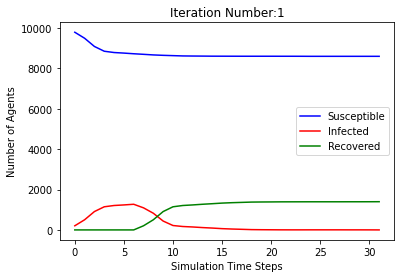

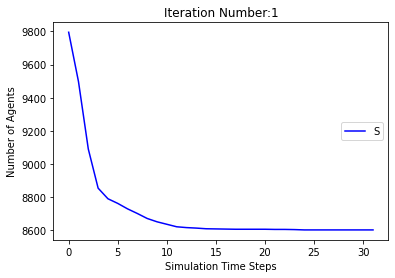

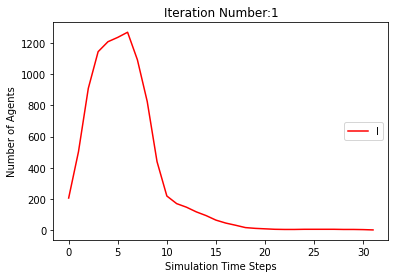

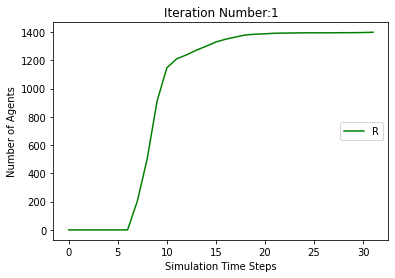

[9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585]
[205, 548, 919, 1129, 1215, 1253, 1274, 1088, 765, 418, 226, 154, 130, 116, 106, 88, 68, 51, 40, 30, 25, 16, 14, 10, 9, 6, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 548, 919, 1129, 1215, 1253, 1274, 1293, 1313, 1337, 1355, 1369, 1383, 1390, 1399, 1401, 1405, 1406, 1409, 1413, 1415]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585]]
[[], [205, 503, 910, 1146, 1210, 1238, 1271, 1094, 826, 439, 218, 169, 146, 116, 92, 63, 44, 30, 15, 10, 7, 4, 3, 3, 4, 4, 4, 4, 3, 3, 2, 0], [205, 548, 919, 1129, 1215, 1253, 1274, 1088, 

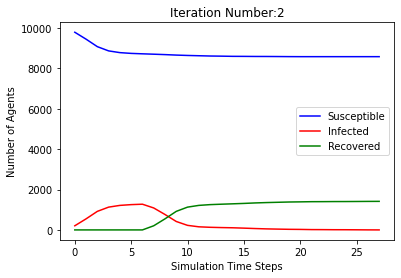

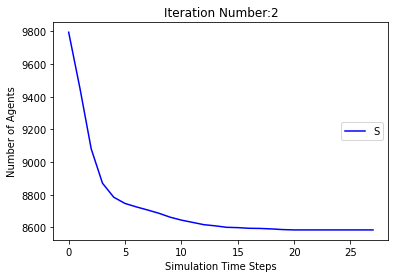

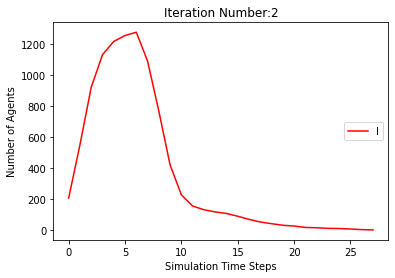

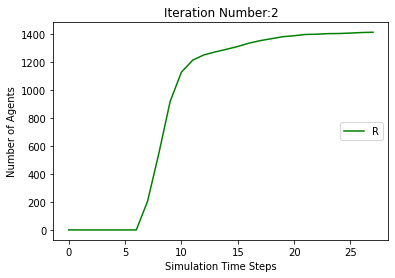

[9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594, 8594, 8594, 8594, 8594]
[205, 502, 896, 1112, 1188, 1228, 1249, 1077, 818, 450, 245, 177, 148, 139, 116, 83, 59, 48, 40, 29, 18, 8, 3, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 502, 896, 1112, 1188, 1228, 1249, 1282, 1320, 1346, 1357, 1365, 1376, 1388, 1398, 1403, 1405, 1405, 1405, 1405, 1406]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594, 8594, 8594, 8594, 8594]]
[[], [205, 503, 910, 

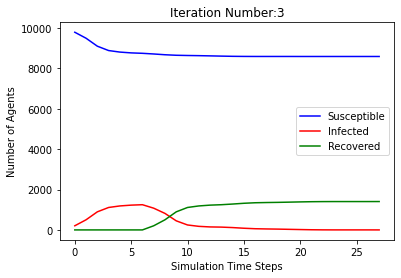

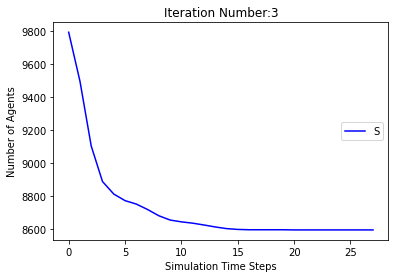

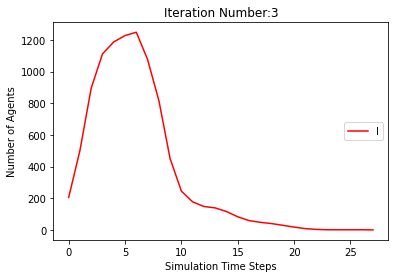

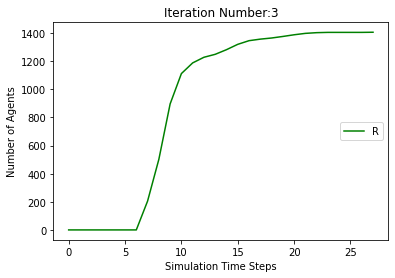

[9795, 9472, 9073, 8854, 8792, 8770, 8739, 8709, 8679, 8656, 8629, 8606, 8594, 8590, 8585, 8582, 8579, 8574, 8569, 8564, 8561, 8560, 8560, 8560, 8560, 8560, 8560, 8560, 8560]
[205, 528, 927, 1146, 1208, 1230, 1261, 1086, 793, 417, 225, 186, 176, 149, 124, 97, 77, 55, 37, 30, 29, 25, 22, 19, 14, 9, 4, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 528, 927, 1146, 1208, 1230, 1261, 1291, 1321, 1344, 1371, 1394, 1406, 1410, 1415, 1418, 1421, 1426, 1431, 1436, 1439, 1440]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594, 8594, 8594, 8594, 8594], [9

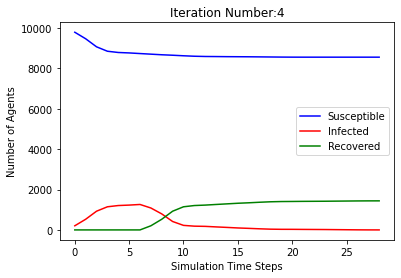

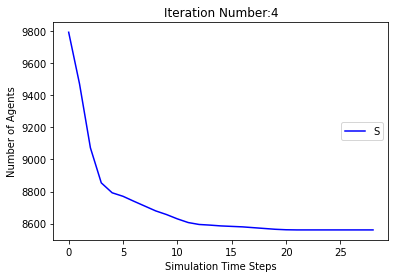

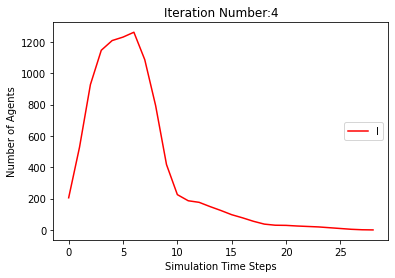

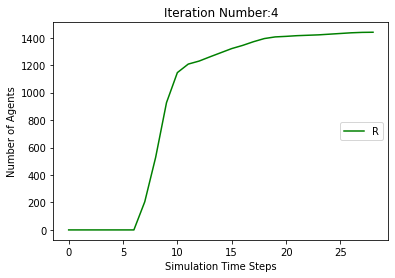

[9795, 9475, 9060, 8842, 8772, 8737, 8709, 8675, 8644, 8623, 8614, 8602, 8598, 8593, 8593, 8592, 8591, 8590, 8589, 8589, 8589, 8589, 8589, 8589, 8589, 8589]
[205, 525, 940, 1158, 1228, 1263, 1291, 1120, 831, 437, 228, 170, 139, 116, 82, 52, 32, 24, 13, 9, 4, 4, 3, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 525, 940, 1158, 1228, 1263, 1291, 1325, 1356, 1377, 1386, 1398, 1402, 1407, 1407, 1408, 1409, 1410, 1411]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594, 8594, 8594, 8594, 8594], [9795, 9472, 9073, 8854, 8792, 8770, 8739, 8709, 8679,

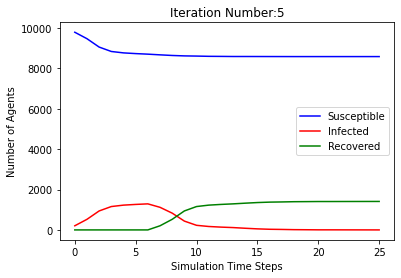

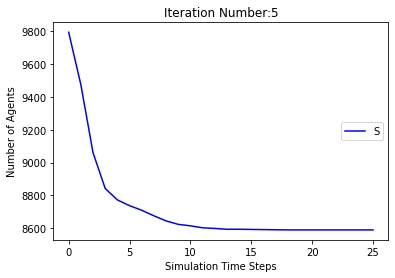

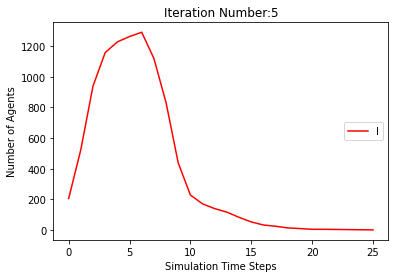

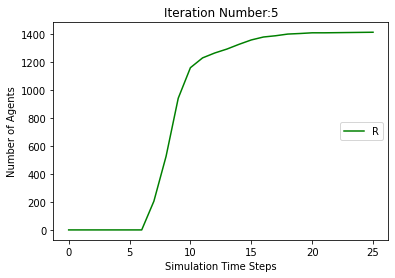

[9795, 9450, 9074, 8859, 8790, 8756, 8718, 8695, 8667, 8645, 8625, 8611, 8597, 8586, 8578, 8572, 8570, 8570, 8570, 8570, 8570, 8570, 8569, 8567, 8566, 8564, 8563, 8563, 8561, 8558, 8558, 8558, 8558, 8558, 8558, 8558, 8558]
[205, 550, 926, 1141, 1210, 1244, 1282, 1100, 783, 429, 234, 179, 159, 132, 117, 95, 75, 55, 41, 27, 16, 8, 3, 3, 4, 6, 7, 7, 9, 11, 9, 8, 6, 5, 5, 3, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 550, 926, 1141, 1210, 1244, 1282, 1305, 1333, 1355, 1375, 1389, 1403, 1414, 1422, 1428, 1430, 1430, 1430, 1430, 1430, 1430, 1431, 1433, 1434, 1436, 1437, 1437, 1439, 1442]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 

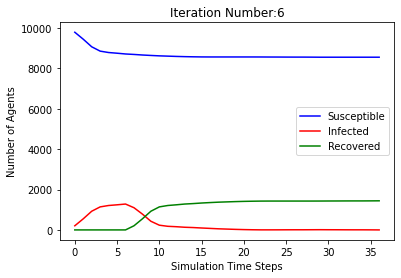

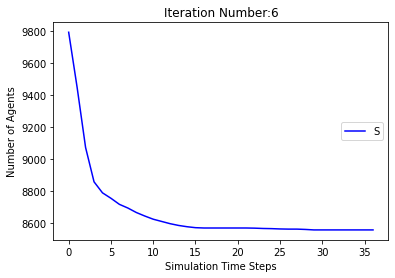

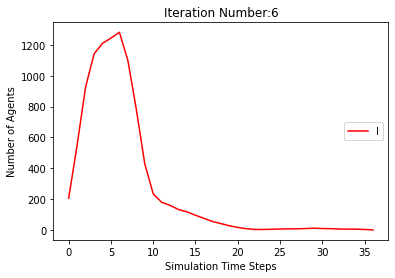

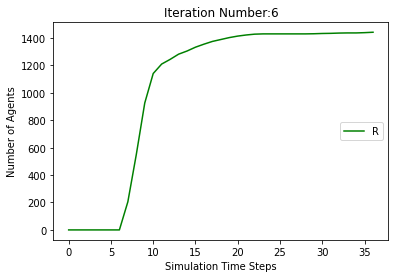

[9795, 9495, 9064, 8840, 8759, 8732, 8712, 8686, 8656, 8636, 8616, 8590, 8574, 8564, 8558, 8552, 8541, 8533, 8530, 8529, 8529, 8528, 8523, 8520, 8519, 8519, 8519, 8519, 8519, 8516, 8516, 8516, 8515, 8513, 8512, 8512, 8512, 8512, 8512, 8512, 8512, 8512]
[205, 505, 936, 1160, 1241, 1268, 1288, 1109, 839, 428, 224, 169, 158, 148, 128, 104, 95, 83, 60, 45, 35, 30, 29, 21, 14, 11, 10, 10, 9, 7, 4, 3, 4, 6, 7, 7, 4, 4, 4, 3, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 505, 936, 1160, 1241, 1268, 1288, 1314, 1344, 1364, 1384, 1410, 1426, 1436, 1442, 1448, 1459, 1467, 1470, 1471, 1471, 1472, 1477, 1480, 1481, 1481, 1481, 1481, 1481, 1484, 1484, 1484, 1485, 1487, 1488]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585

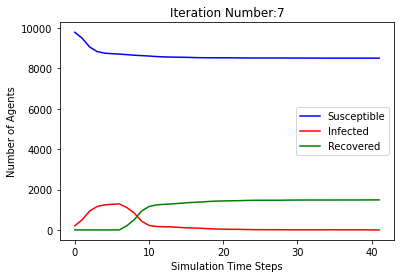

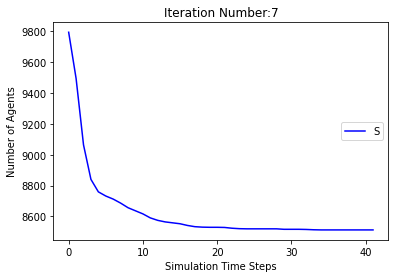

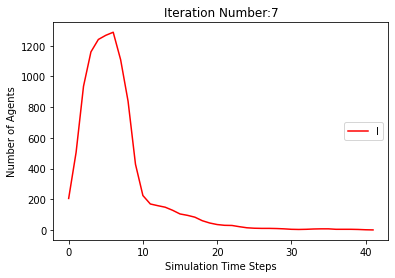

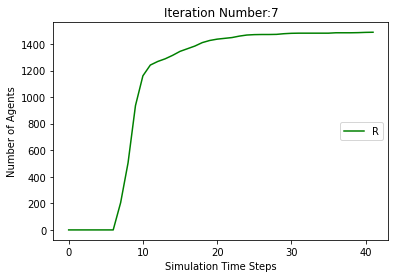

[9795, 9473, 9071, 8836, 8764, 8743, 8722, 8690, 8666, 8639, 8619, 8608, 8591, 8571, 8561, 8557, 8555, 8553, 8553, 8553, 8553, 8553, 8553, 8553, 8551, 8547, 8543, 8539, 8539, 8539, 8539, 8539, 8539, 8538, 8537, 8536, 8536, 8536, 8536, 8536, 8536, 8536, 8536]
[205, 527, 929, 1164, 1236, 1257, 1278, 1105, 807, 432, 217, 156, 152, 151, 129, 109, 84, 66, 55, 38, 18, 8, 4, 2, 2, 6, 10, 14, 14, 14, 14, 12, 8, 5, 2, 3, 3, 3, 3, 3, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 527, 929, 1164, 1236, 1257, 1278, 1310, 1334, 1361, 1381, 1392, 1409, 1429, 1439, 1443, 1445, 1447, 1447, 1447, 1447, 1447, 1447, 1447, 1449, 1453, 1457, 1461, 1461, 1461, 1461, 1461, 1461, 1462, 1463, 1464]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 85

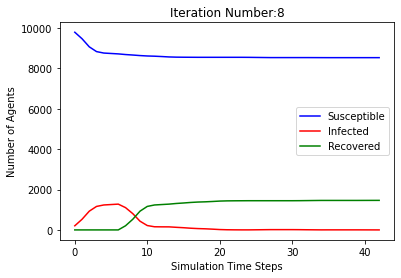

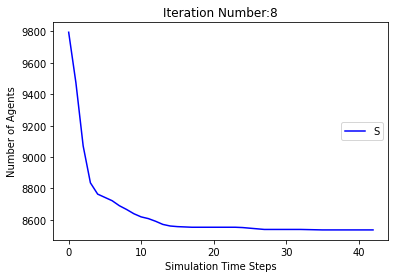

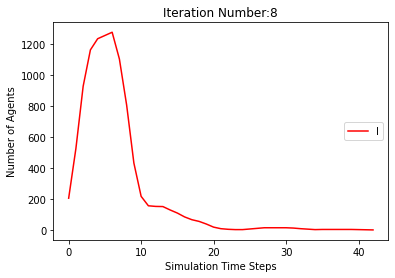

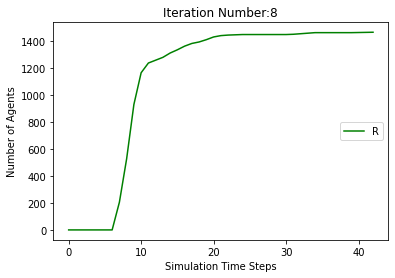

[9795, 9469, 9049, 8817, 8761, 8726, 8702, 8673, 8658, 8639, 8615, 8604, 8598, 8592, 8592, 8587, 8581, 8578, 8578, 8578, 8578, 8578, 8578, 8578, 8578]
[205, 531, 951, 1183, 1239, 1274, 1298, 1122, 811, 410, 202, 157, 128, 110, 81, 71, 58, 37, 26, 20, 14, 14, 9, 3, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 531, 951, 1183, 1239, 1274, 1298, 1327, 1342, 1361, 1385, 1396, 1402, 1408, 1408, 1413, 1419, 1422]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594, 8594, 8594, 8594, 8594], [9795, 9472, 9073, 8854, 8792, 8770, 8739, 8709, 8679, 8656, 8629,

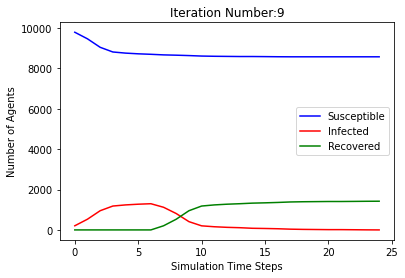

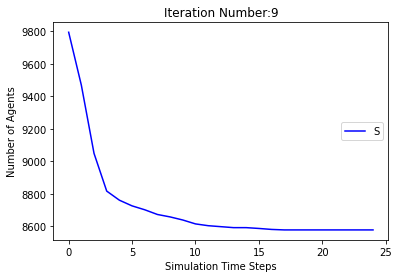

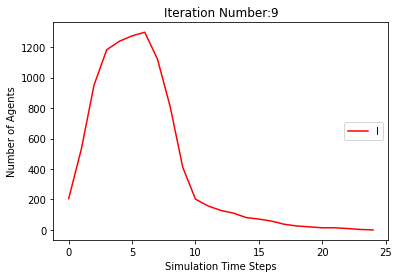

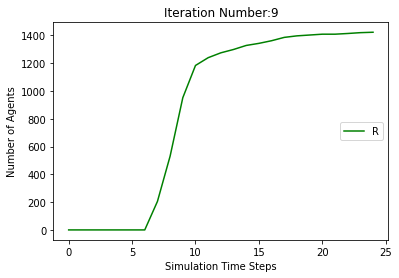

[9795, 9464, 9041, 8835, 8787, 8771, 8753, 8727, 8703, 8678, 8662, 8649, 8642, 8638, 8636, 8633, 8630, 8629, 8629, 8629, 8629, 8629, 8628, 8628, 8628, 8625, 8623, 8619, 8616, 8615, 8615, 8615, 8615, 8615, 8615, 8615, 8615]
[205, 536, 959, 1165, 1213, 1229, 1247, 1068, 761, 363, 173, 138, 129, 115, 91, 70, 48, 33, 20, 13, 9, 7, 5, 2, 1, 4, 6, 10, 13, 13, 13, 13, 10, 8, 4, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 536, 959, 1165, 1213, 1229, 1247, 1273, 1297, 1322, 1338, 1351, 1358, 1362, 1364, 1367, 1370, 1371, 1371, 1371, 1371, 1371, 1372, 1372, 1372, 1375, 1377, 1381, 1384, 1385]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 868

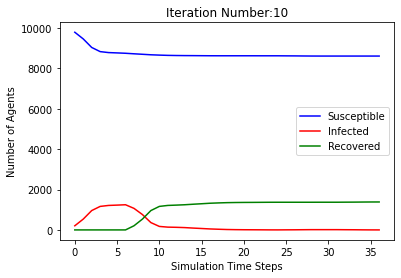

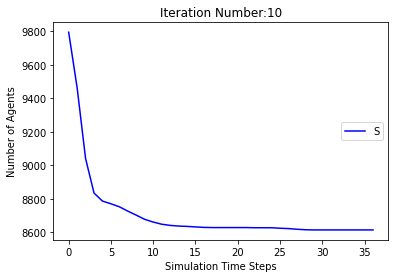

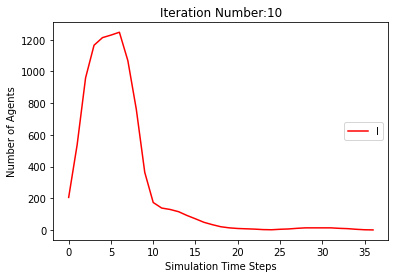

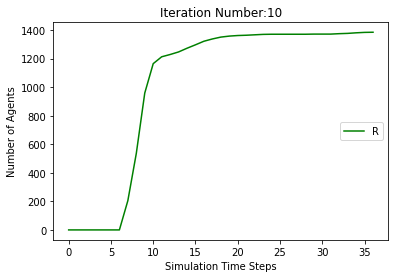

[9795, 9453, 9066, 8856, 8761, 8730, 8709, 8690, 8672, 8654, 8639, 8619, 8603, 8596, 8589, 8584, 8581, 8580, 8578, 8573, 8570, 8566, 8565, 8564, 8564, 8564, 8564, 8564, 8562, 8560, 8560, 8560, 8560, 8560, 8559, 8559, 8559, 8559, 8559, 8559, 8559, 8559]
[205, 547, 934, 1144, 1239, 1270, 1291, 1105, 781, 412, 217, 142, 127, 113, 101, 88, 73, 59, 41, 30, 26, 23, 19, 17, 16, 14, 9, 6, 4, 5, 4, 4, 4, 4, 5, 3, 1, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 547, 934, 1144, 1239, 1270, 1291, 1310, 1328, 1346, 1361, 1381, 1397, 1404, 1411, 1416, 1419, 1420, 1422, 1427, 1430, 1434, 1435, 1436, 1436, 1436, 1436, 1436, 1438, 1440, 1440, 1440, 1440, 1440, 1441]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8

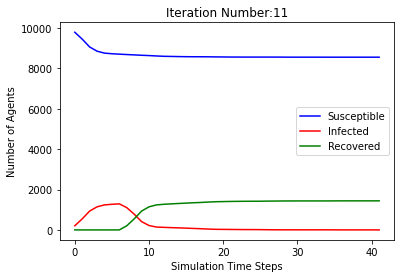

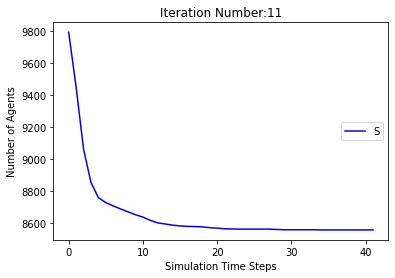

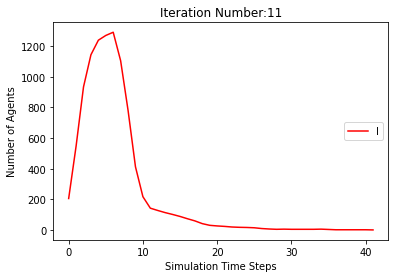

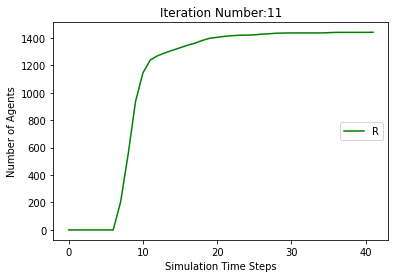

[9795, 9455, 9052, 8835, 8762, 8723, 8690, 8664, 8635, 8613, 8589, 8572, 8564, 8559, 8555, 8549, 8548, 8544, 8540, 8538, 8536, 8534, 8533, 8532, 8532, 8532, 8532, 8532, 8532, 8532, 8532]
[205, 545, 948, 1165, 1238, 1277, 1310, 1131, 820, 439, 246, 190, 159, 131, 109, 86, 65, 45, 32, 26, 23, 21, 16, 16, 12, 8, 6, 4, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 545, 948, 1165, 1238, 1277, 1310, 1336, 1365, 1387, 1411, 1428, 1436, 1441, 1445, 1451, 1452, 1456, 1460, 1462, 1464, 1466, 1467, 1468]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 859

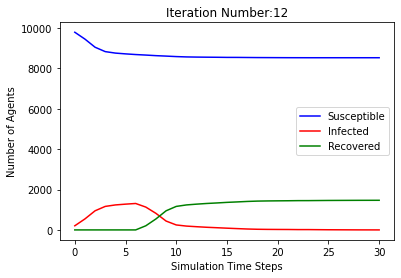

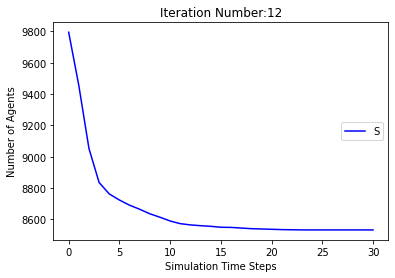

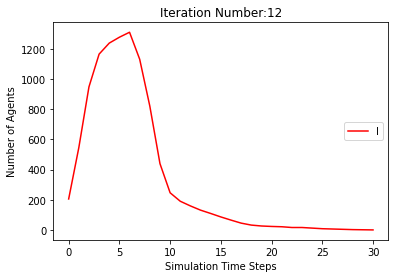

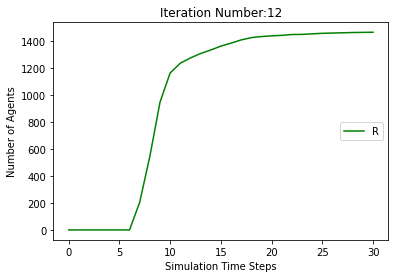

[9795, 9479, 9083, 8846, 8776, 8752, 8730, 8702, 8679, 8666, 8655, 8651, 8649, 8643, 8634, 8631, 8627, 8626, 8625, 8625, 8625, 8624, 8622, 8621, 8620, 8620, 8619, 8616, 8614, 8614, 8614, 8614, 8614, 8614, 8614, 8614]
[205, 521, 917, 1154, 1224, 1248, 1270, 1093, 800, 417, 191, 125, 103, 87, 68, 48, 39, 29, 26, 24, 18, 10, 9, 6, 6, 5, 6, 9, 10, 8, 7, 6, 6, 5, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 521, 917, 1154, 1224, 1248, 1270, 1298, 1321, 1334, 1345, 1349, 1351, 1357, 1366, 1369, 1373, 1374, 1375, 1375, 1375, 1376, 1378, 1379, 1380, 1380, 1381, 1384, 1386]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635

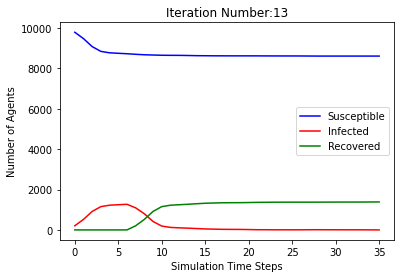

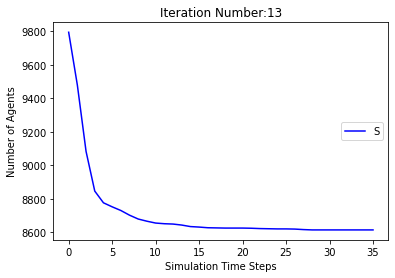

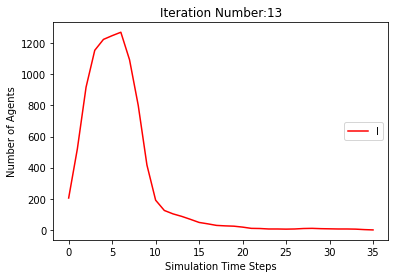

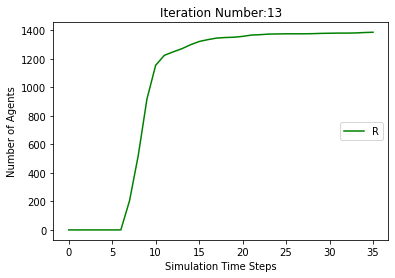

[9795, 9468, 9082, 8857, 8794, 8764, 8742, 8717, 8698, 8675, 8660, 8648, 8639, 8632, 8628, 8625, 8624, 8621, 8621, 8621, 8621, 8621, 8621, 8621, 8621]
[205, 532, 918, 1143, 1206, 1236, 1258, 1078, 770, 407, 197, 146, 125, 110, 89, 73, 51, 39, 27, 18, 11, 7, 4, 3, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 532, 918, 1143, 1206, 1236, 1258, 1283, 1302, 1325, 1340, 1352, 1361, 1368, 1372, 1375, 1376, 1379]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594, 8594, 8594, 8594, 8594], [9795, 9472, 9073, 8854, 8792, 8770, 8739, 8709, 8679, 8656, 8629, 

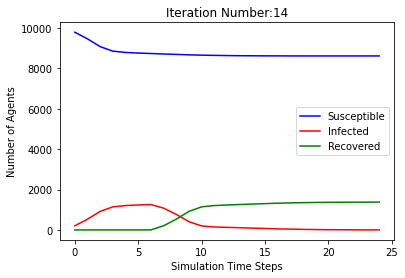

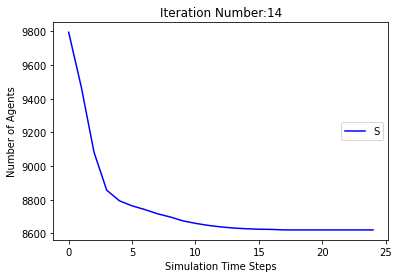

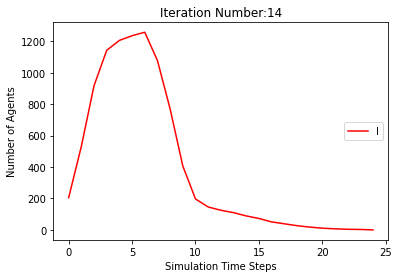

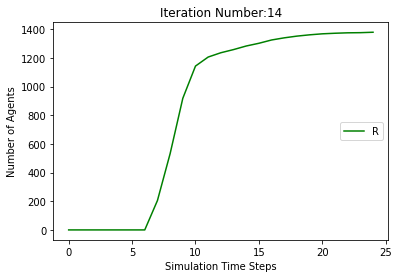

[9795, 9464, 9048, 8839, 8779, 8757, 8735, 8709, 8679, 8662, 8645, 8632, 8623, 8617, 8609, 8603, 8599, 8594, 8593, 8591, 8591, 8590, 8589, 8588, 8588, 8588, 8588, 8588, 8588, 8588, 8588]
[205, 536, 952, 1161, 1221, 1243, 1265, 1086, 785, 386, 194, 147, 134, 118, 100, 76, 63, 51, 39, 32, 26, 19, 14, 11, 6, 5, 3, 3, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 536, 952, 1161, 1221, 1243, 1265, 1291, 1321, 1338, 1355, 1368, 1377, 1383, 1391, 1397, 1401, 1406, 1407, 1409, 1409, 1410, 1411, 1412]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594

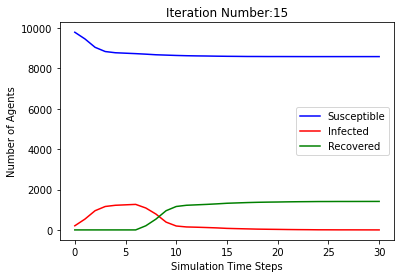

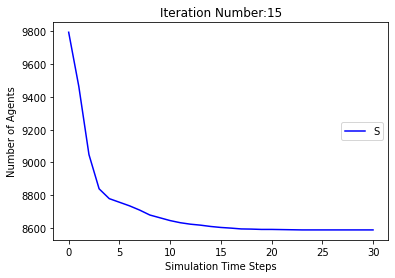

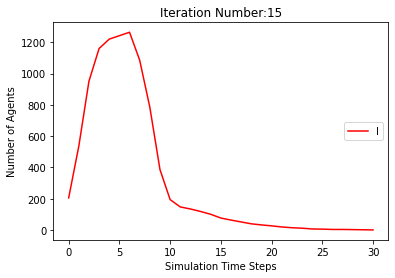

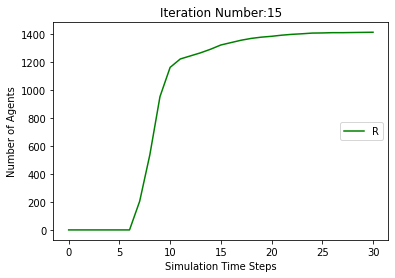

[9795, 9460, 9062, 8854, 8782, 8759, 8742, 8706, 8657, 8624, 8598, 8577, 8566, 8561, 8560, 8558, 8555, 8555, 8555, 8555, 8554, 8554, 8549, 8545, 8543, 8542, 8540, 8538, 8537, 8537, 8537, 8537, 8537, 8537, 8537, 8537]
[205, 540, 938, 1146, 1218, 1241, 1258, 1089, 803, 438, 256, 205, 193, 181, 146, 99, 69, 43, 22, 11, 7, 6, 9, 10, 12, 13, 15, 16, 17, 12, 8, 6, 5, 3, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 540, 938, 1146, 1218, 1241, 1258, 1294, 1343, 1376, 1402, 1423, 1434, 1439, 1440, 1442, 1445, 1445, 1445, 1445, 1446, 1446, 1451, 1455, 1457, 1458, 1460, 1462, 1463]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643

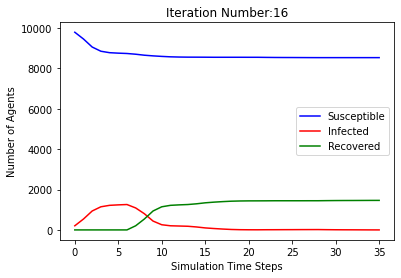

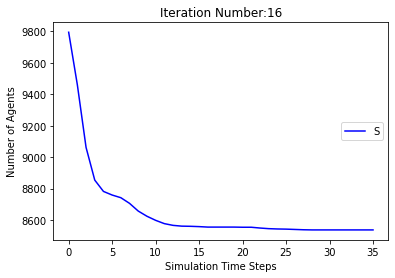

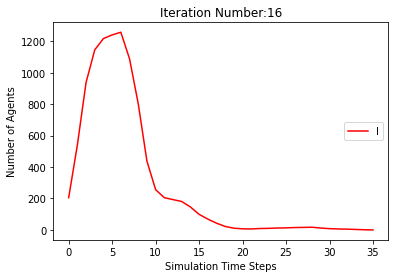

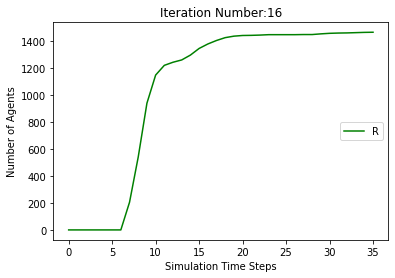

[9795, 9479, 9091, 8828, 8741, 8700, 8674, 8642, 8621, 8605, 8585, 8563, 8539, 8523, 8515, 8511, 8510, 8510, 8510, 8510, 8510, 8508, 8507, 8506, 8506, 8506, 8506, 8506, 8506, 8506, 8506]
[205, 521, 909, 1172, 1259, 1300, 1326, 1153, 858, 486, 243, 178, 161, 151, 127, 110, 95, 75, 53, 29, 13, 7, 4, 4, 4, 4, 4, 4, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 521, 909, 1172, 1259, 1300, 1326, 1358, 1379, 1395, 1415, 1437, 1461, 1477, 1485, 1489, 1490, 1490, 1490, 1490, 1490, 1492, 1493, 1494]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594, 

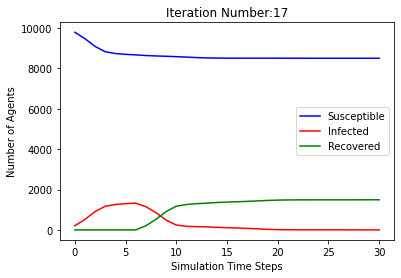

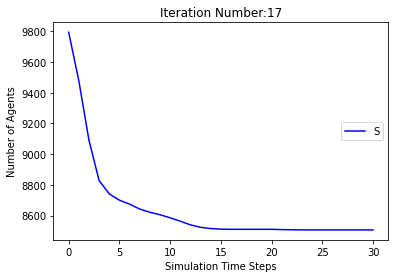

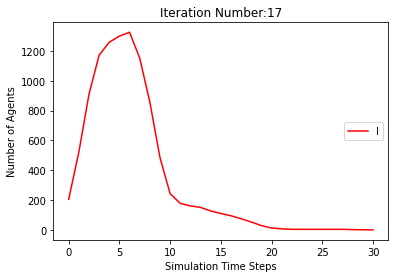

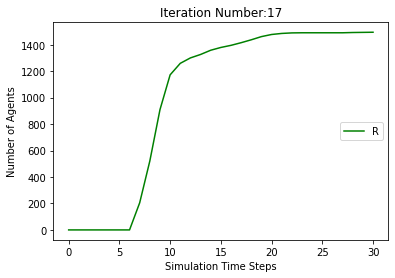

[9795, 9489, 9086, 8838, 8761, 8721, 8697, 8668, 8638, 8621, 8606, 8587, 8573, 8560, 8558, 8556, 8548, 8544, 8543, 8539, 8533, 8528, 8527, 8527, 8527, 8527, 8527, 8527, 8527, 8527]
[205, 511, 914, 1162, 1239, 1279, 1303, 1127, 851, 465, 232, 174, 148, 137, 110, 82, 73, 62, 44, 34, 27, 30, 29, 21, 17, 16, 12, 6, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 511, 914, 1162, 1239, 1279, 1303, 1332, 1362, 1379, 1394, 1413, 1427, 1440, 1442, 1444, 1452, 1456, 1457, 1461, 1467, 1472, 1473]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594, 8594, 8594

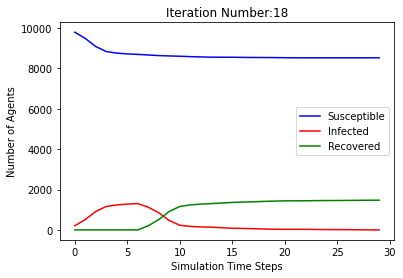

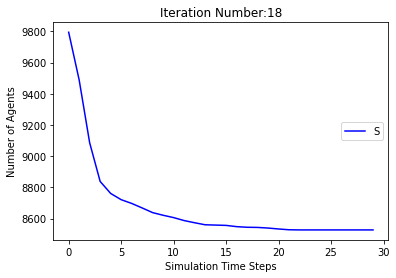

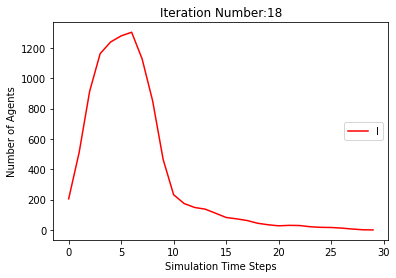

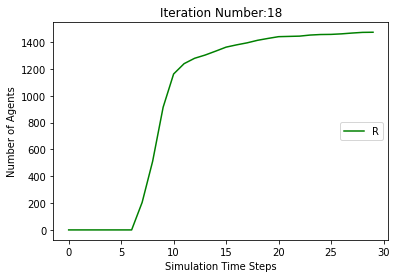

[9795, 9472, 9085, 8863, 8792, 8776, 8757, 8737, 8718, 8684, 8646, 8624, 8607, 8587, 8579, 8578, 8577, 8574, 8569, 8564, 8563, 8563, 8563, 8563, 8563, 8563, 8563, 8563]
[205, 528, 915, 1137, 1208, 1224, 1243, 1058, 754, 401, 217, 168, 169, 170, 158, 140, 107, 72, 55, 43, 24, 16, 15, 14, 11, 6, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 528, 915, 1137, 1208, 1224, 1243, 1263, 1282, 1316, 1354, 1376, 1393, 1413, 1421, 1422, 1423, 1426, 1431, 1436, 1437]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594, 8594, 8594, 8594, 8594], [9795, 9472, 90

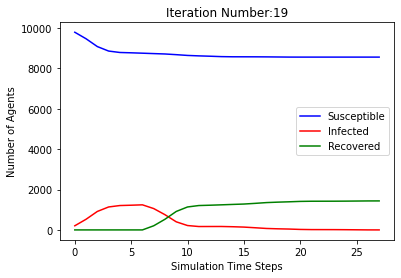

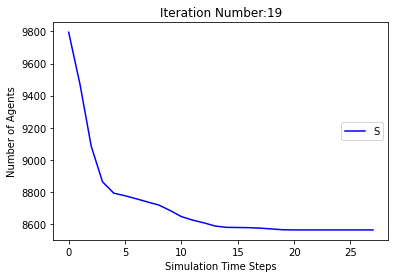

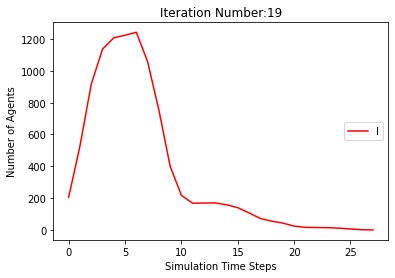

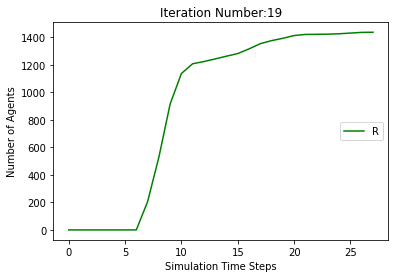

[9795, 9480, 9085, 8864, 8786, 8756, 8732, 8698, 8680, 8659, 8647, 8625, 8608, 8607, 8607, 8606, 8606, 8606, 8605, 8605, 8605, 8605, 8605, 8605, 8605, 8605]
[205, 520, 915, 1136, 1214, 1244, 1268, 1097, 800, 426, 217, 161, 148, 125, 91, 74, 53, 41, 20, 3, 2, 2, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 520, 915, 1136, 1214, 1244, 1268, 1302, 1320, 1341, 1353, 1375, 1392, 1393, 1393, 1394, 1394, 1394, 1395]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594, 8594, 8594, 8594, 8594], [9795, 9472, 9073, 8854, 8792, 8770, 8739, 8709, 8679,

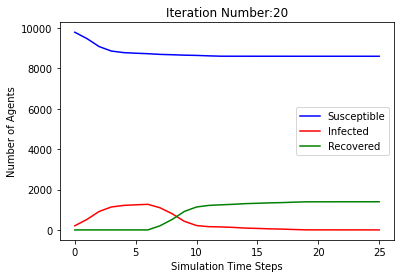

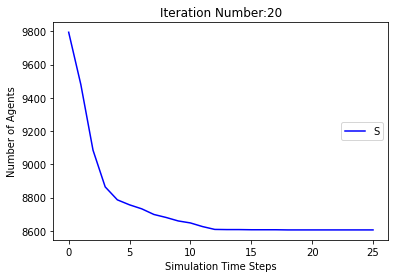

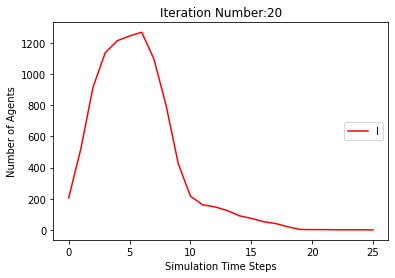

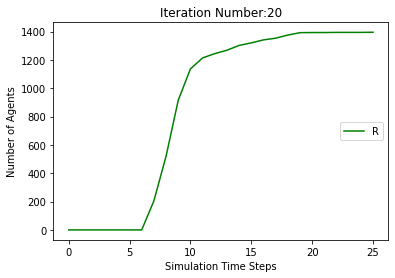

[9795, 9471, 9090, 8851, 8757, 8722, 8700, 8675, 8659, 8641, 8629, 8623, 8617, 8611, 8605, 8597, 8586, 8585, 8585, 8585, 8584, 8584, 8584, 8583, 8582, 8582, 8582, 8582, 8581, 8581, 8580, 8579, 8579, 8579, 8579, 8579, 8579, 8579, 8579]
[205, 529, 910, 1149, 1243, 1278, 1300, 1120, 812, 449, 222, 134, 105, 89, 70, 62, 55, 44, 38, 32, 27, 21, 13, 3, 3, 3, 3, 2, 3, 3, 3, 3, 3, 3, 3, 2, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 529, 910, 1149, 1243, 1278, 1300, 1325, 1341, 1359, 1371, 1377, 1383, 1389, 1395, 1403, 1414, 1415, 1415, 1415, 1416, 1416, 1416, 1417, 1418, 1418, 1418, 1418, 1419, 1419, 1420, 1421]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8

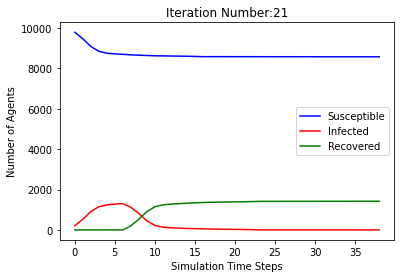

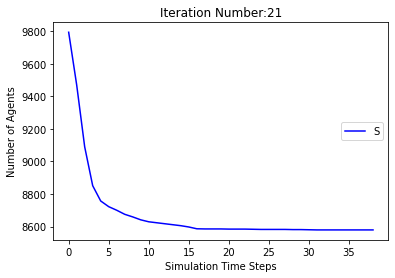

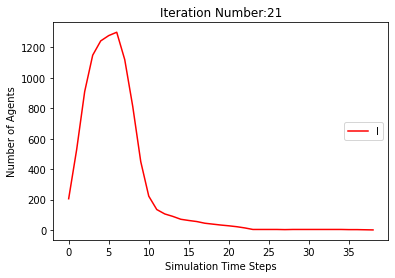

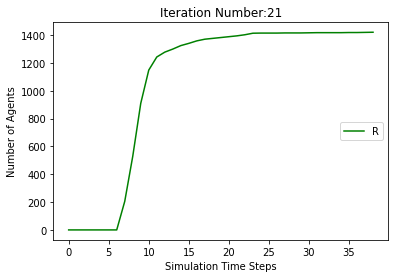

[9795, 9478, 9080, 8847, 8768, 8734, 8711, 8694, 8673, 8644, 8616, 8588, 8565, 8555, 8547, 8533, 8522, 8518, 8514, 8507, 8503, 8500, 8497, 8496, 8495, 8490, 8486, 8481, 8479, 8479, 8479, 8479, 8479, 8479, 8479, 8479]
[205, 522, 920, 1153, 1232, 1266, 1289, 1101, 805, 436, 231, 180, 169, 156, 147, 140, 122, 98, 74, 58, 52, 47, 36, 26, 23, 24, 21, 22, 21, 18, 17, 16, 11, 7, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 522, 920, 1153, 1232, 1266, 1289, 1306, 1327, 1356, 1384, 1412, 1435, 1445, 1453, 1467, 1478, 1482, 1486, 1493, 1497, 1500, 1503, 1504, 1505, 1510, 1514, 1519, 1521]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 86

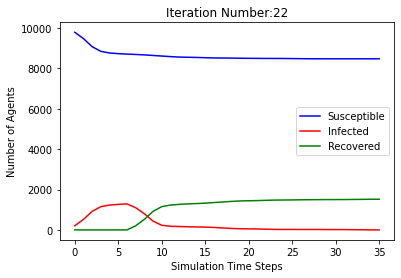

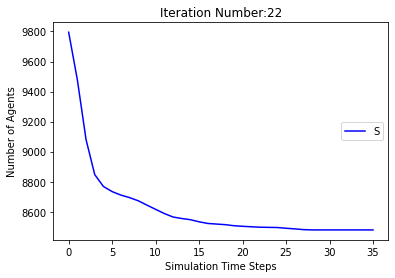

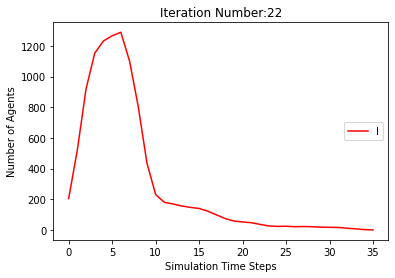

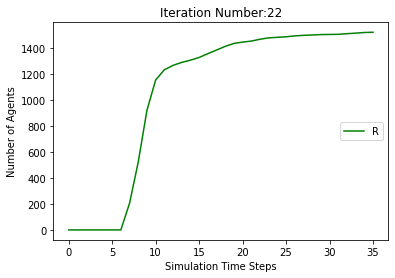

[9795, 9437, 9012, 8820, 8755, 8723, 8699, 8669, 8636, 8608, 8591, 8572, 8551, 8540, 8534, 8530, 8526, 8523, 8522, 8520, 8519, 8518, 8518, 8518, 8518, 8518, 8518, 8518, 8517, 8517, 8517, 8516, 8516, 8516, 8516, 8516, 8516, 8516, 8516]
[205, 563, 988, 1180, 1245, 1277, 1301, 1126, 801, 404, 229, 183, 172, 159, 135, 106, 82, 68, 50, 31, 21, 16, 12, 8, 5, 4, 2, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 563, 988, 1180, 1245, 1277, 1301, 1331, 1364, 1392, 1409, 1428, 1449, 1460, 1466, 1470, 1474, 1477, 1478, 1480, 1481, 1482, 1482, 1482, 1482, 1482, 1482, 1482, 1483, 1483, 1483, 1484]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888

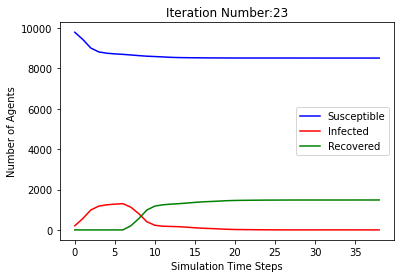

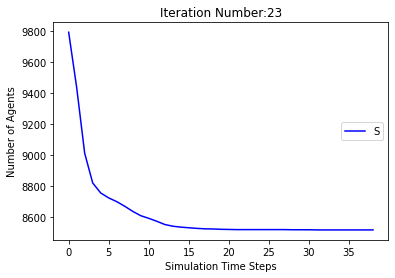

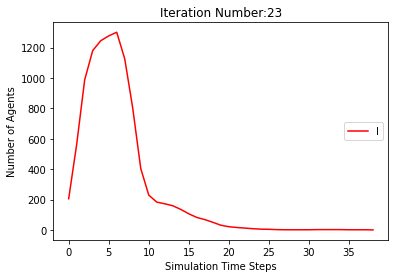

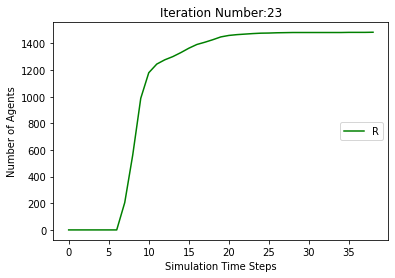

[9795, 9454, 9060, 8854, 8807, 8778, 8753, 8725, 8704, 8676, 8650, 8634, 8622, 8611, 8604, 8602, 8600, 8593, 8589, 8588, 8588, 8588, 8588, 8587, 8587, 8587, 8587, 8587, 8587, 8587, 8587]
[205, 546, 940, 1146, 1193, 1222, 1247, 1070, 750, 384, 204, 173, 156, 142, 121, 102, 76, 57, 45, 34, 23, 16, 14, 13, 6, 2, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 546, 940, 1146, 1193, 1222, 1247, 1275, 1296, 1324, 1350, 1366, 1378, 1389, 1396, 1398, 1400, 1407, 1411, 1412, 1412, 1412, 1412, 1413]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 859

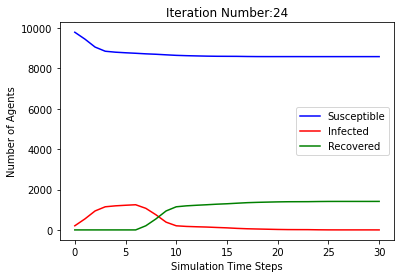

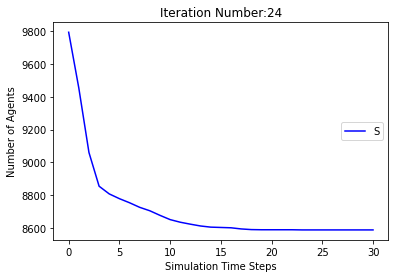

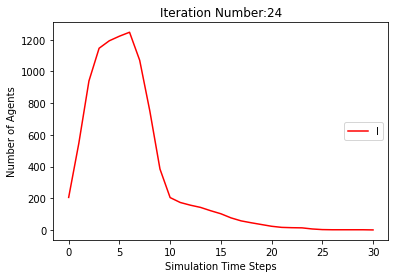

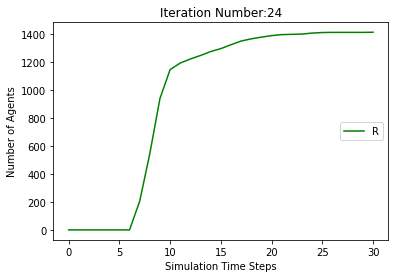

[9795, 9464, 9066, 8845, 8789, 8769, 8755, 8739, 8724, 8705, 8687, 8670, 8650, 8640, 8633, 8628, 8624, 8622, 8620, 8618, 8614, 8614, 8614, 8614, 8612, 8612, 8612, 8612, 8612, 8612, 8612, 8612]
[205, 536, 934, 1155, 1211, 1231, 1245, 1056, 740, 361, 158, 119, 119, 115, 106, 96, 81, 65, 50, 32, 26, 19, 14, 10, 10, 8, 6, 2, 2, 2, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 536, 934, 1155, 1211, 1231, 1245, 1261, 1276, 1295, 1313, 1330, 1350, 1360, 1367, 1372, 1376, 1378, 1380, 1382, 1386, 1386, 1386, 1386, 1388]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 

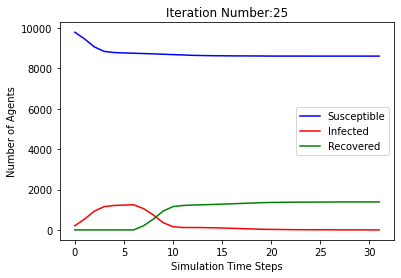

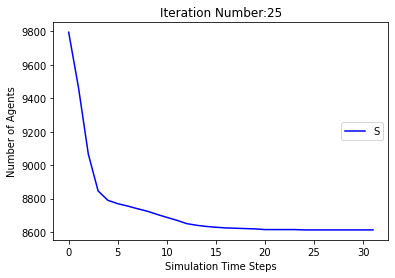

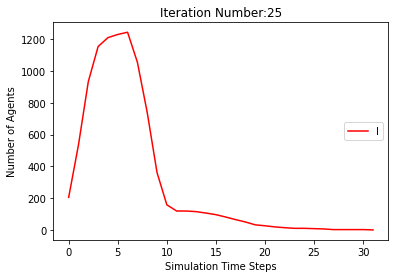

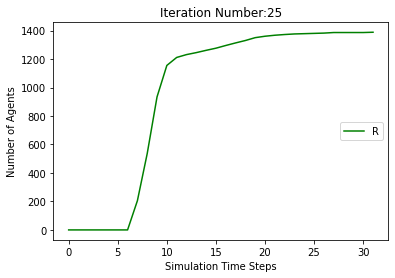

[9795, 9480, 9074, 8835, 8770, 8743, 8725, 8706, 8683, 8653, 8624, 8609, 8601, 8592, 8583, 8575, 8572, 8570, 8569, 8569, 8569, 8569, 8569, 8569, 8568, 8568, 8568, 8568, 8568, 8568, 8568, 8568]
[205, 520, 926, 1165, 1230, 1257, 1275, 1089, 797, 421, 211, 161, 142, 133, 123, 108, 81, 54, 40, 32, 23, 14, 6, 3, 2, 1, 1, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 520, 926, 1165, 1230, 1257, 1275, 1294, 1317, 1347, 1376, 1391, 1399, 1408, 1417, 1425, 1428, 1430, 1431, 1431, 1431, 1431, 1431, 1431, 1432]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 85

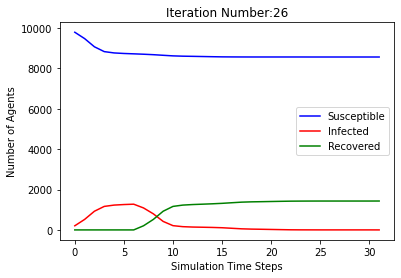

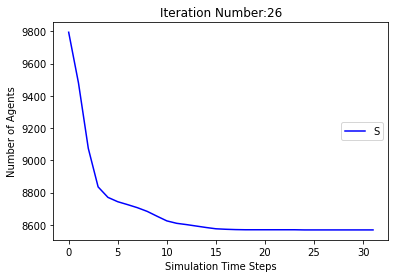

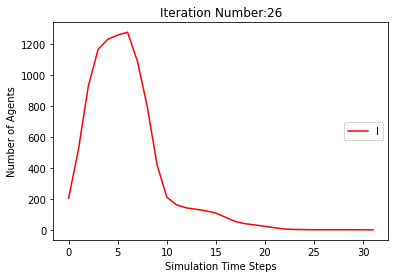

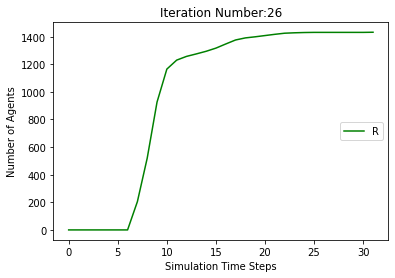

[9795, 9478, 9075, 8853, 8765, 8750, 8730, 8704, 8676, 8652, 8637, 8618, 8601, 8594, 8584, 8572, 8568, 8564, 8561, 8561, 8561, 8560, 8557, 8552, 8548, 8544, 8535, 8530, 8526, 8523, 8519, 8519, 8519, 8519, 8519, 8519, 8519, 8519]
[205, 522, 925, 1147, 1235, 1250, 1270, 1091, 802, 423, 216, 147, 149, 136, 120, 104, 84, 73, 57, 40, 33, 24, 15, 16, 16, 17, 26, 31, 34, 34, 33, 29, 25, 16, 11, 7, 4, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 522, 925, 1147, 1235, 1250, 1270, 1296, 1324, 1348, 1363, 1382, 1399, 1406, 1416, 1428, 1432, 1436, 1439, 1439, 1439, 1440, 1443, 1448, 1452, 1456, 1465, 1470, 1474, 1477, 1481]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8

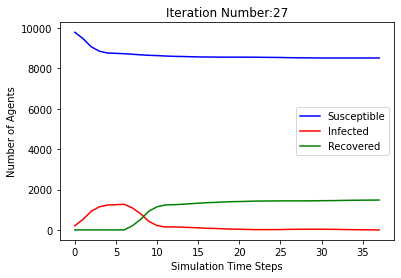

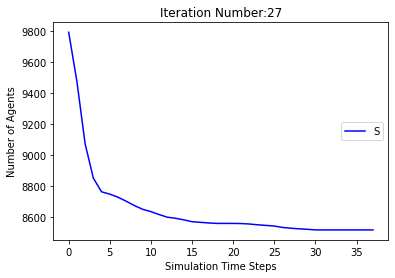

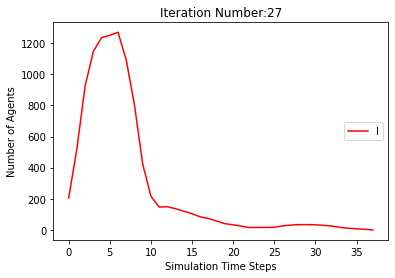

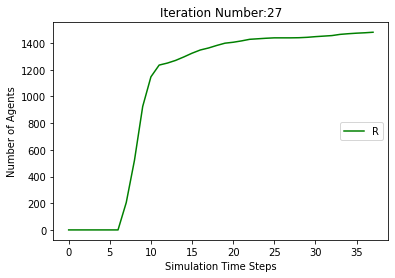

[9795, 9444, 9036, 8827, 8762, 8728, 8690, 8662, 8643, 8617, 8588, 8564, 8557, 8553, 8551, 8547, 8540, 8536, 8526, 8516, 8506, 8499, 8497, 8496, 8496, 8496, 8496, 8496, 8496, 8496, 8496]
[205, 556, 964, 1173, 1238, 1272, 1310, 1133, 801, 419, 239, 198, 171, 137, 111, 96, 77, 52, 38, 41, 47, 52, 50, 44, 40, 30, 20, 10, 3, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 556, 964, 1173, 1238, 1272, 1310, 1338, 1357, 1383, 1412, 1436, 1443, 1447, 1449, 1453, 1460, 1464, 1474, 1484, 1494, 1501, 1503, 1504]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 

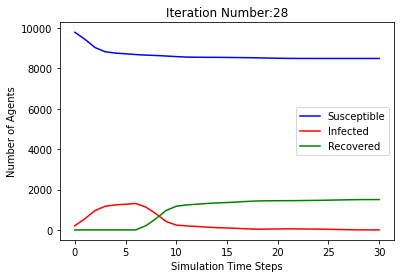

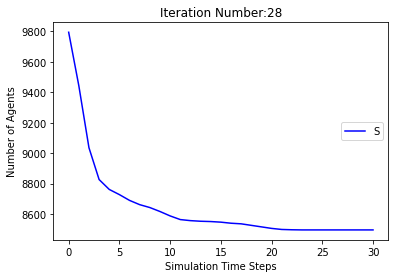

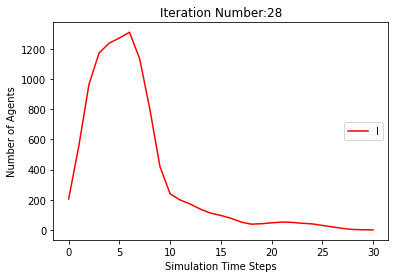

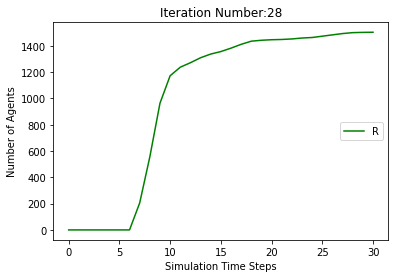

[9795, 9470, 9072, 8863, 8795, 8769, 8748, 8721, 8686, 8666, 8654, 8648, 8644, 8642, 8636, 8628, 8624, 8624, 8624, 8624, 8624, 8624, 8624, 8624]
[205, 530, 928, 1137, 1205, 1231, 1252, 1074, 784, 406, 209, 147, 125, 106, 85, 58, 42, 30, 24, 20, 18, 12, 4, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 530, 928, 1137, 1205, 1231, 1252, 1279, 1314, 1334, 1346, 1352, 1356, 1358, 1364, 1372, 1376]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594, 8594, 8594, 8594, 8594], [9795, 9472, 9073, 8854, 8792, 8770, 8739, 8709, 8679, 8656, 8629, 8606, 8594, 85

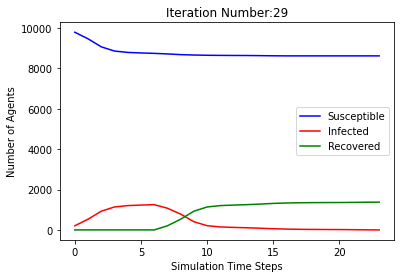

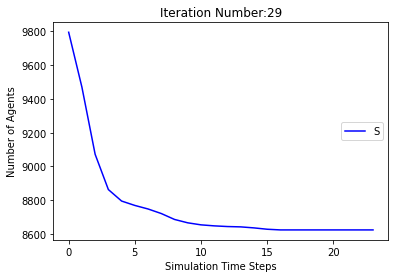

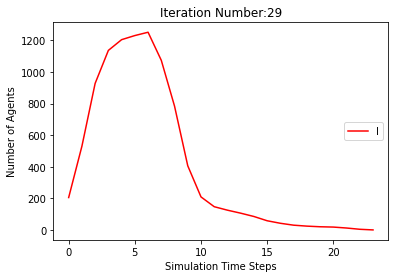

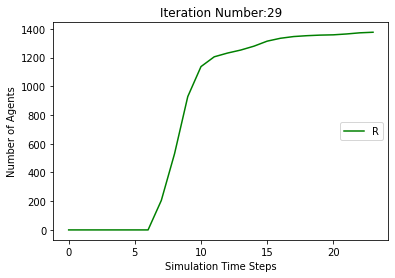

[9795, 9466, 9061, 8853, 8772, 8739, 8715, 8695, 8672, 8642, 8627, 8616, 8610, 8609, 8608, 8606, 8603, 8599, 8596, 8593, 8589, 8581, 8569, 8560, 8559, 8558, 8558, 8558, 8558, 8558, 8557, 8555, 8553, 8553, 8553, 8553, 8553, 8553, 8553, 8553]
[205, 534, 939, 1147, 1228, 1261, 1285, 1100, 794, 419, 226, 156, 129, 106, 87, 66, 39, 28, 20, 17, 20, 27, 37, 43, 40, 38, 35, 31, 23, 11, 3, 4, 5, 5, 5, 5, 5, 4, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 534, 939, 1147, 1228, 1261, 1285, 1305, 1328, 1358, 1373, 1384, 1390, 1391, 1392, 1394, 1397, 1401, 1404, 1407, 1411, 1419, 1431, 1440, 1441, 1442, 1442, 1442, 1442, 1442, 1443, 1445, 1447]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [97

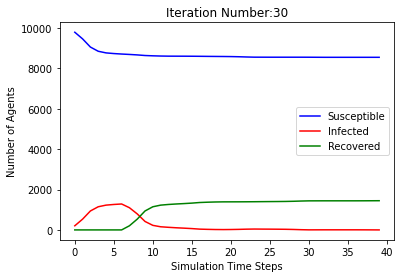

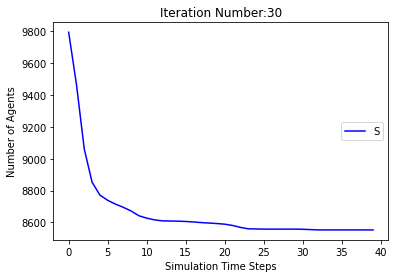

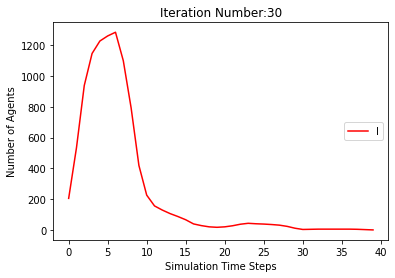

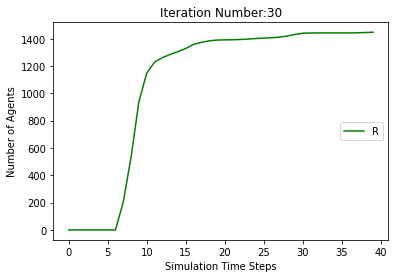

[9795, 9469, 9070, 8845, 8768, 8742, 8713, 8692, 8674, 8653, 8638, 8624, 8613, 8607, 8606, 8601, 8598, 8596, 8592, 8589, 8587, 8583, 8577, 8575, 8570, 8565, 8558, 8554, 8553, 8550, 8547, 8547, 8547, 8547, 8547, 8547, 8547, 8547]
[205, 531, 930, 1155, 1232, 1258, 1287, 1103, 795, 417, 207, 144, 129, 106, 86, 73, 55, 42, 32, 24, 20, 23, 24, 23, 26, 27, 31, 33, 30, 27, 28, 23, 18, 11, 7, 6, 3, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 531, 930, 1155, 1232, 1258, 1287, 1308, 1326, 1347, 1362, 1376, 1387, 1393, 1394, 1399, 1402, 1404, 1408, 1411, 1413, 1417, 1423, 1425, 1430, 1435, 1442, 1446, 1447, 1450, 1453]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812

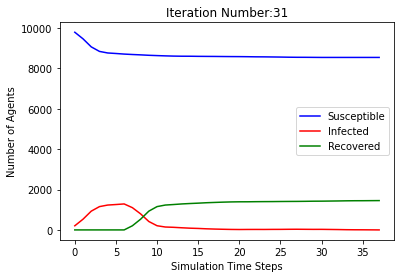

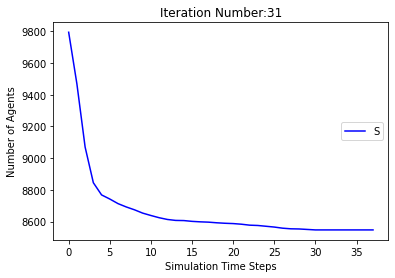

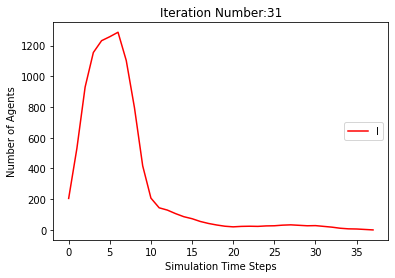

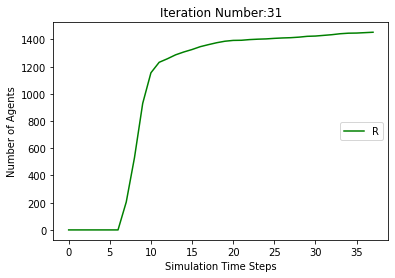

[9795, 9480, 9082, 8855, 8774, 8741, 8701, 8671, 8642, 8615, 8598, 8579, 8565, 8553, 8543, 8534, 8521, 8517, 8515, 8514, 8514, 8514, 8514, 8513, 8513, 8513, 8513, 8513, 8513, 8513, 8513]
[205, 520, 918, 1145, 1226, 1259, 1299, 1124, 838, 467, 257, 195, 176, 148, 128, 108, 94, 81, 64, 51, 39, 29, 20, 8, 4, 2, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 520, 918, 1145, 1226, 1259, 1299, 1329, 1358, 1385, 1402, 1421, 1435, 1447, 1457, 1466, 1479, 1483, 1485, 1486, 1486, 1486, 1486, 1487]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594

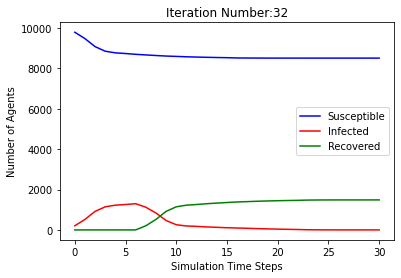

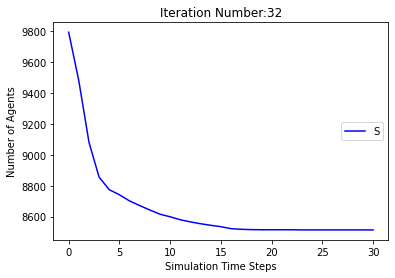

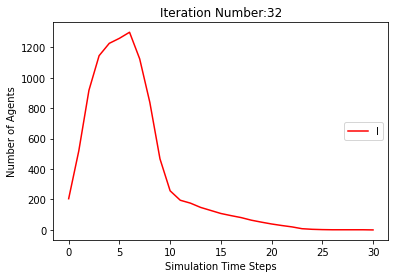

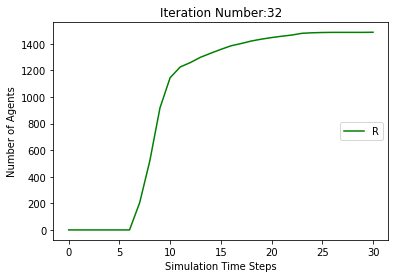

[9795, 9475, 9052, 8832, 8778, 8756, 8726, 8700, 8681, 8660, 8641, 8628, 8620, 8613, 8607, 8602, 8601, 8599, 8597, 8596, 8596, 8596, 8595, 8595, 8595, 8595, 8595, 8595, 8595, 8595]
[205, 525, 948, 1168, 1222, 1244, 1274, 1095, 794, 392, 191, 150, 136, 113, 93, 79, 59, 42, 31, 24, 17, 11, 7, 6, 4, 2, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 525, 948, 1168, 1222, 1244, 1274, 1300, 1319, 1340, 1359, 1372, 1380, 1387, 1393, 1398, 1399, 1401, 1403, 1404, 1404, 1404, 1405]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594, 8594, 8594, 8594

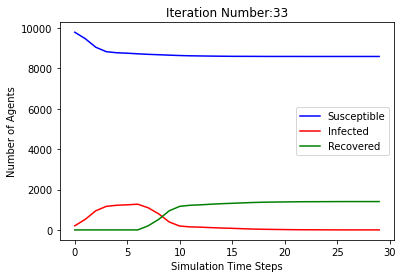

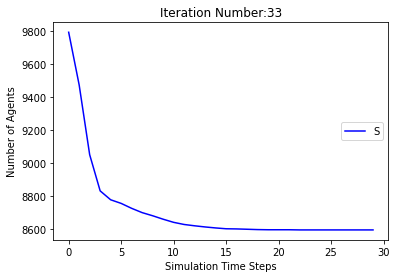

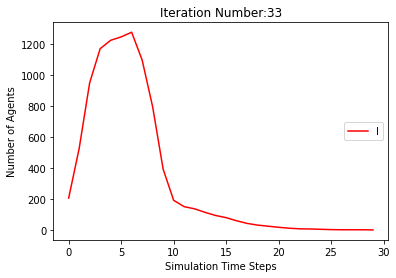

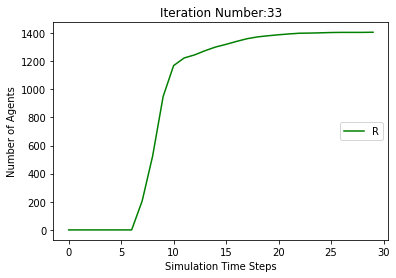

[9795, 9463, 9037, 8830, 8782, 8757, 8735, 8716, 8696, 8674, 8654, 8641, 8637, 8628, 8620, 8617, 8614, 8607, 8604, 8601, 8596, 8591, 8587, 8584, 8582, 8579, 8579, 8577, 8577, 8577, 8577, 8577, 8577, 8577, 8577]
[205, 537, 963, 1170, 1218, 1243, 1265, 1079, 767, 363, 176, 141, 120, 107, 96, 79, 60, 47, 37, 36, 32, 29, 30, 30, 25, 25, 22, 19, 14, 10, 7, 5, 2, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 537, 963, 1170, 1218, 1243, 1265, 1284, 1304, 1326, 1346, 1359, 1363, 1372, 1380, 1383, 1386, 1393, 1396, 1399, 1404, 1409, 1413, 1416, 1418, 1421, 1421, 1423]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624,

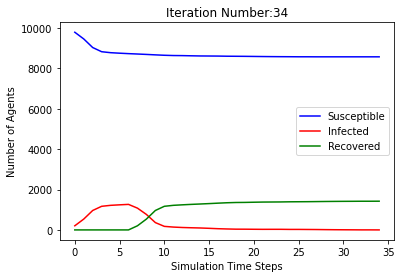

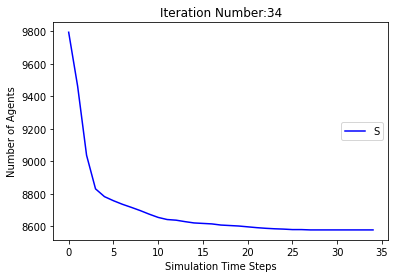

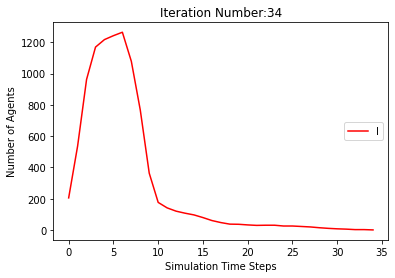

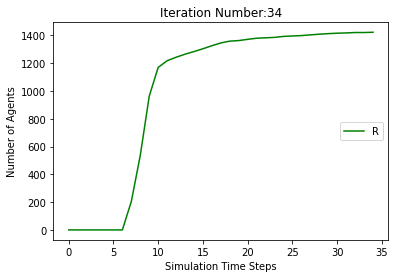

[9795, 9464, 9068, 8846, 8784, 8755, 8729, 8704, 8686, 8661, 8640, 8624, 8615, 8611, 8610, 8608, 8608, 8608, 8608, 8608, 8608, 8608, 8608]
[205, 536, 932, 1154, 1216, 1245, 1271, 1091, 778, 407, 206, 160, 140, 118, 94, 78, 53, 32, 16, 7, 3, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 536, 932, 1154, 1216, 1245, 1271, 1296, 1314, 1339, 1360, 1376, 1385, 1389, 1390, 1392]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594, 8594, 8594, 8594, 8594], [9795, 9472, 9073, 8854, 8792, 8770, 8739, 8709, 8679, 8656, 8629, 8606, 8594, 8590, 8585, 8582, 85

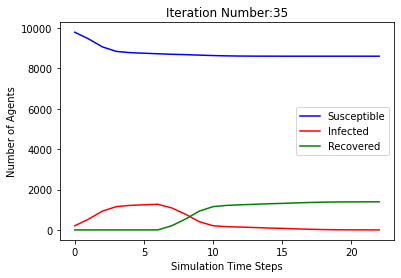

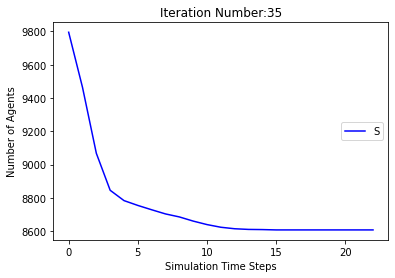

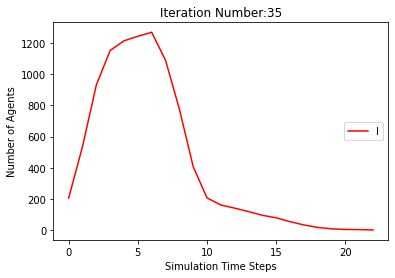

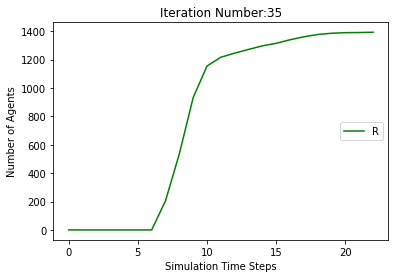

[9795, 9465, 9063, 8841, 8762, 8725, 8695, 8672, 8656, 8633, 8612, 8595, 8576, 8568, 8563, 8562, 8559, 8559, 8559, 8559, 8559, 8557, 8556, 8556, 8556, 8556, 8556, 8556, 8556, 8556]
[205, 535, 937, 1159, 1238, 1275, 1305, 1123, 809, 430, 229, 167, 149, 127, 109, 94, 74, 53, 36, 17, 9, 6, 6, 3, 3, 3, 3, 3, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 535, 937, 1159, 1238, 1275, 1305, 1328, 1344, 1367, 1388, 1405, 1424, 1432, 1437, 1438, 1441, 1441, 1441, 1441, 1441, 1443, 1444]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594, 8594, 8594, 8594,

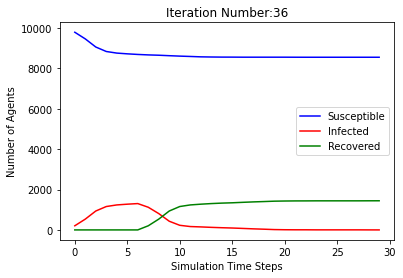

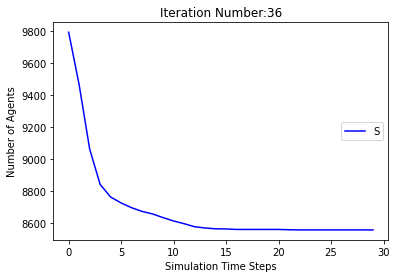

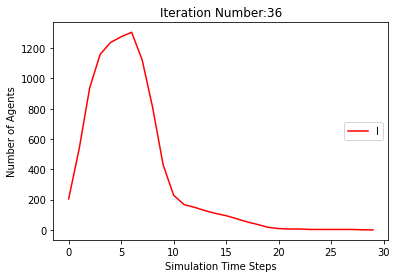

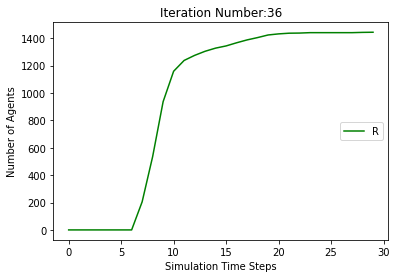

[9795, 9478, 9085, 8848, 8783, 8758, 8727, 8696, 8675, 8653, 8635, 8613, 8594, 8589, 8585, 8577, 8570, 8566, 8565, 8564, 8561, 8561, 8561, 8561, 8561, 8561, 8561, 8561]
[205, 522, 915, 1152, 1217, 1242, 1273, 1099, 803, 432, 213, 170, 164, 138, 111, 98, 83, 69, 48, 30, 28, 24, 16, 9, 5, 4, 3, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 522, 915, 1152, 1217, 1242, 1273, 1304, 1325, 1347, 1365, 1387, 1406, 1411, 1415, 1423, 1430, 1434, 1435, 1436, 1439]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594, 8594, 8594, 8594, 8594], [9795, 9472, 9073, 

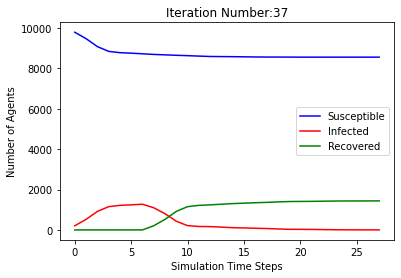

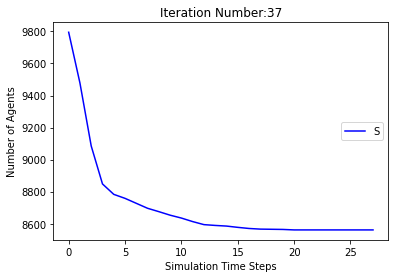

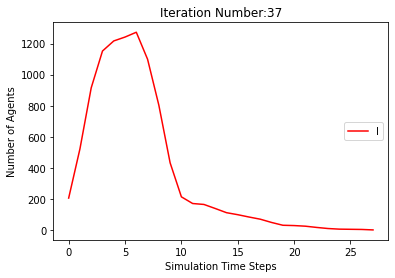

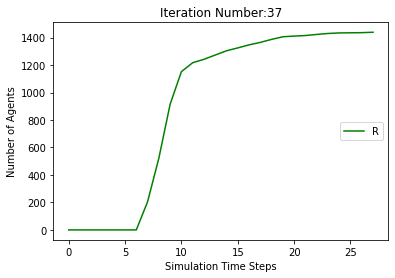

[9795, 9440, 9047, 8828, 8759, 8725, 8703, 8670, 8643, 8617, 8598, 8587, 8575, 8562, 8552, 8542, 8540, 8537, 8536, 8536, 8535, 8532, 8529, 8528, 8528, 8528, 8528, 8528, 8528, 8528, 8528]
[205, 560, 953, 1172, 1241, 1275, 1297, 1125, 797, 430, 230, 172, 150, 141, 118, 101, 77, 61, 51, 39, 27, 20, 13, 12, 9, 8, 8, 7, 4, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 560, 953, 1172, 1241, 1275, 1297, 1330, 1357, 1383, 1402, 1413, 1425, 1438, 1448, 1458, 1460, 1463, 1464, 1464, 1465, 1468, 1471, 1472]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 859

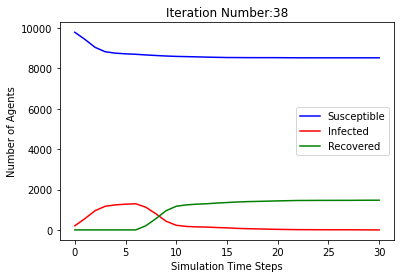

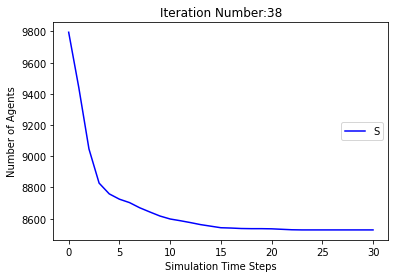

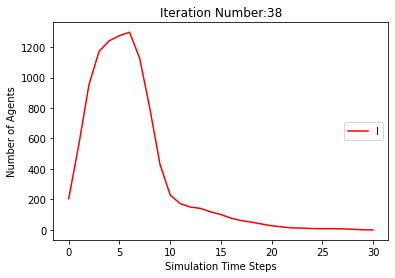

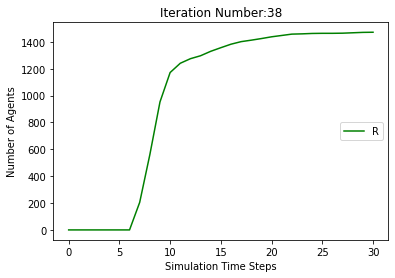

[9795, 9487, 9083, 8850, 8784, 8757, 8737, 8706, 8653, 8620, 8600, 8580, 8555, 8543, 8527, 8513, 8508, 8502, 8494, 8490, 8485, 8480, 8477, 8477, 8476, 8475, 8473, 8473, 8471, 8466, 8465, 8465, 8465, 8465, 8465, 8464, 8464, 8464, 8464, 8464, 8464, 8464, 8464]
[205, 513, 917, 1150, 1216, 1243, 1263, 1089, 834, 463, 250, 204, 202, 194, 179, 140, 112, 98, 86, 65, 58, 47, 36, 31, 26, 19, 17, 12, 9, 11, 12, 11, 10, 8, 8, 7, 2, 1, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 513, 917, 1150, 1216, 1243, 1263, 1294, 1347, 1380, 1400, 1420, 1445, 1457, 1473, 1487, 1492, 1498, 1506, 1510, 1515, 1520, 1523, 1523, 1524, 1525, 1527, 1527, 1529, 1534, 1535, 1535, 1535, 1535, 1535, 1536]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 85

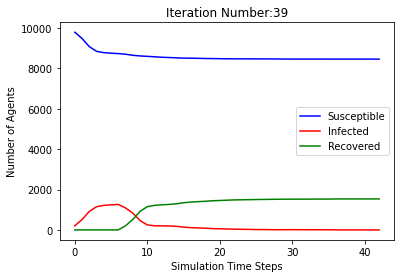

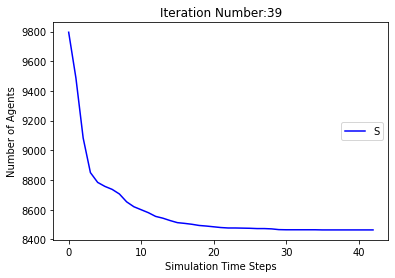

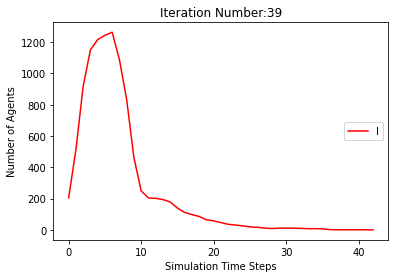

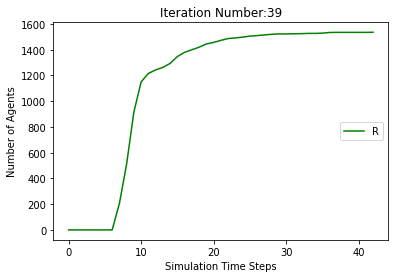

[9795, 9489, 9075, 8856, 8796, 8777, 8764, 8745, 8732, 8714, 8698, 8685, 8679, 8672, 8664, 8655, 8653, 8649, 8649, 8646, 8643, 8643, 8643, 8643, 8643, 8643, 8643, 8643]
[205, 511, 925, 1144, 1204, 1223, 1236, 1050, 757, 361, 158, 111, 98, 92, 81, 77, 61, 49, 36, 33, 29, 21, 12, 10, 6, 6, 3, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 511, 925, 1144, 1204, 1223, 1236, 1255, 1268, 1286, 1302, 1315, 1321, 1328, 1336, 1345, 1347, 1351, 1351, 1354, 1357]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594, 8594, 8594, 8594, 8594], [9795, 9472, 9073, 88

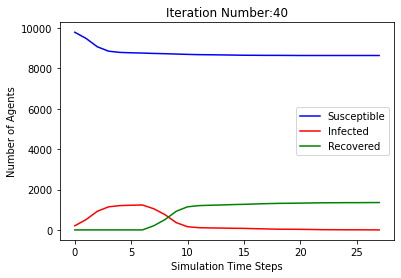

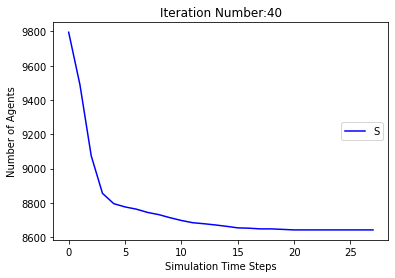

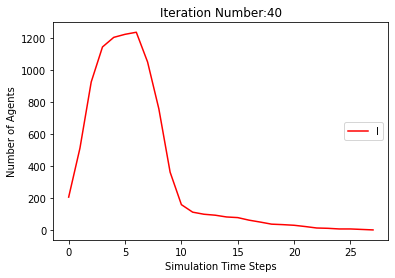

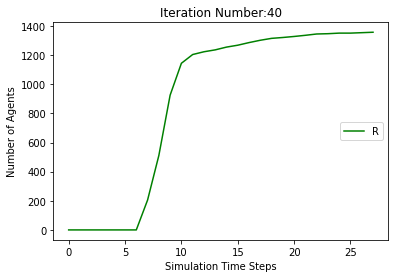

[9795, 9469, 9041, 8834, 8772, 8742, 8721, 8692, 8666, 8647, 8638, 8629, 8626, 8618, 8607, 8603, 8598, 8598, 8598, 8598, 8598, 8597, 8596, 8596, 8595, 8595, 8595, 8595, 8595, 8595, 8595, 8595]
[205, 531, 959, 1166, 1228, 1258, 1279, 1103, 803, 394, 196, 143, 116, 103, 85, 63, 49, 40, 31, 28, 20, 10, 7, 2, 3, 3, 3, 3, 2, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 531, 959, 1166, 1228, 1258, 1279, 1308, 1334, 1353, 1362, 1371, 1374, 1382, 1393, 1397, 1402, 1402, 1402, 1402, 1402, 1403, 1404, 1404, 1405]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594

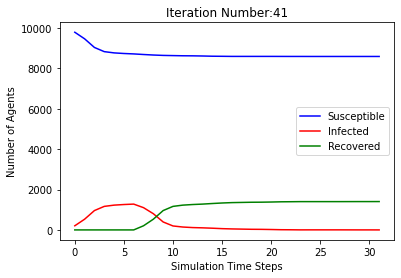

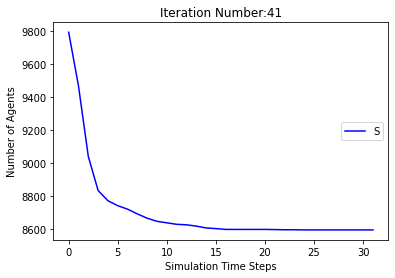

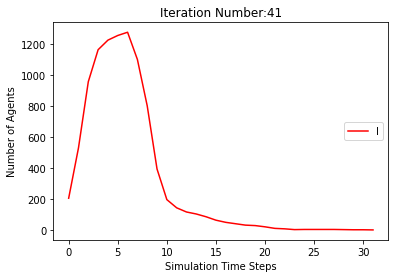

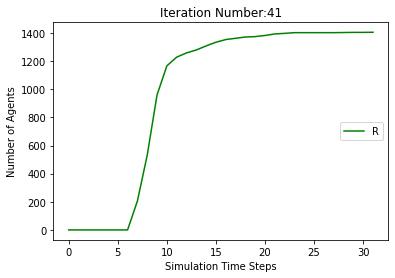

[9795, 9466, 9055, 8839, 8774, 8738, 8706, 8679, 8649, 8621, 8595, 8576, 8564, 8556, 8552, 8546, 8543, 8542, 8538, 8533, 8533, 8533, 8532, 8532, 8532, 8532, 8532, 8532, 8532, 8532]
[205, 534, 945, 1161, 1226, 1262, 1294, 1116, 817, 434, 244, 198, 174, 150, 127, 103, 78, 53, 38, 31, 23, 19, 14, 11, 10, 6, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 534, 945, 1161, 1226, 1262, 1294, 1321, 1351, 1379, 1405, 1424, 1436, 1444, 1448, 1454, 1457, 1458, 1462, 1467, 1467, 1467, 1468]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594, 8594, 8594,

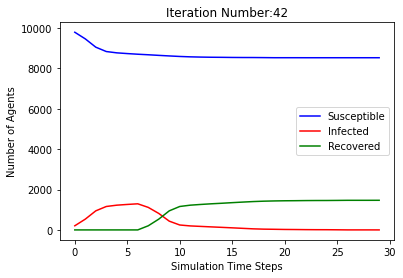

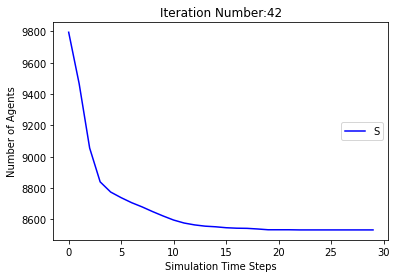

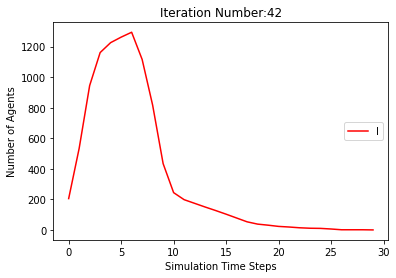

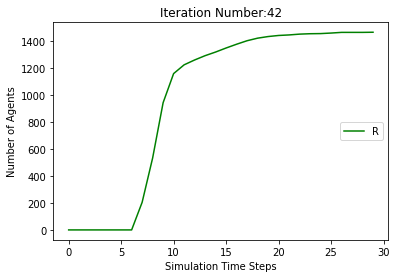

[9795, 9448, 9039, 8835, 8764, 8728, 8710, 8695, 8675, 8656, 8633, 8618, 8605, 8595, 8586, 8570, 8561, 8558, 8558, 8558, 8558, 8558, 8558, 8558, 8558]
[205, 552, 961, 1165, 1236, 1272, 1290, 1100, 773, 383, 202, 146, 123, 115, 109, 105, 95, 75, 60, 47, 37, 28, 12, 3, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 552, 961, 1165, 1236, 1272, 1290, 1305, 1325, 1344, 1367, 1382, 1395, 1405, 1414, 1430, 1439, 1442]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594, 8594, 8594, 8594, 8594], [9795, 9472, 9073, 8854, 8792, 8770, 8739, 8709, 8679, 8656, 86

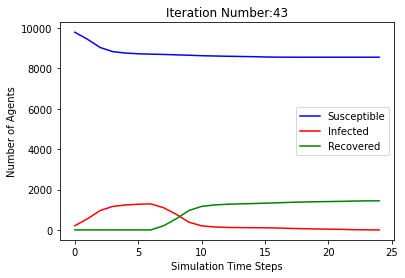

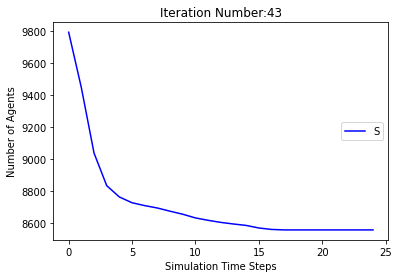

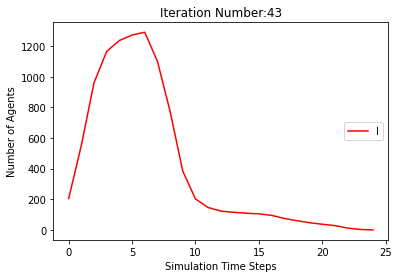

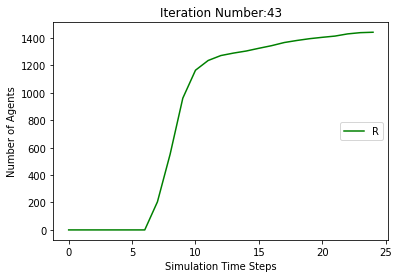

[9795, 9490, 9105, 8889, 8796, 8754, 8728, 8711, 8695, 8671, 8654, 8645, 8635, 8624, 8621, 8615, 8613, 8610, 8608, 8604, 8602, 8601, 8599, 8599, 8599, 8599, 8599, 8599, 8599, 8599]
[205, 510, 895, 1111, 1204, 1246, 1272, 1084, 795, 434, 235, 151, 119, 104, 90, 80, 58, 44, 37, 31, 22, 20, 16, 14, 11, 9, 5, 3, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 510, 895, 1111, 1204, 1246, 1272, 1289, 1305, 1329, 1346, 1355, 1365, 1376, 1379, 1385, 1387, 1390, 1392, 1396, 1398, 1399, 1401]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594, 8594, 8594, 8

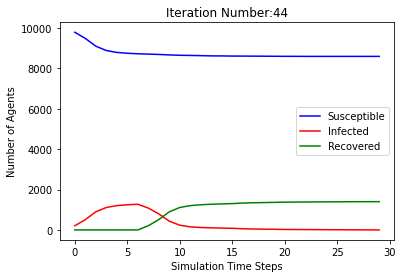

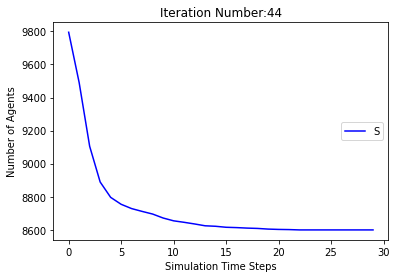

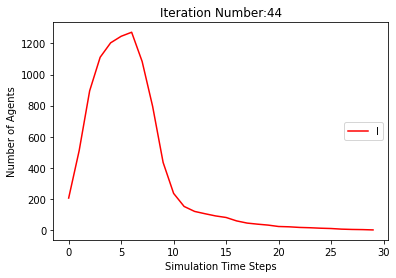

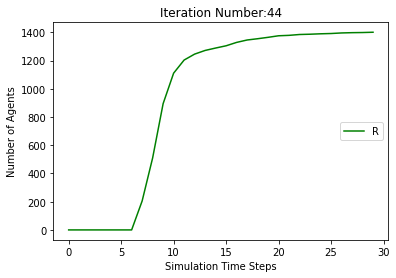

[9795, 9489, 9082, 8854, 8772, 8743, 8711, 8688, 8665, 8643, 8630, 8622, 8612, 8606, 8594, 8588, 8582, 8577, 8576, 8576, 8576, 8576, 8576, 8576, 8576, 8576]
[205, 511, 918, 1146, 1228, 1257, 1289, 1107, 824, 439, 224, 150, 131, 105, 94, 77, 61, 53, 46, 36, 30, 18, 12, 6, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 511, 918, 1146, 1228, 1257, 1289, 1312, 1335, 1357, 1370, 1378, 1388, 1394, 1406, 1412, 1418, 1423, 1424]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594, 8594, 8594, 8594, 8594], [9795, 9472, 9073, 8854, 8792, 8770, 8739, 8709, 8

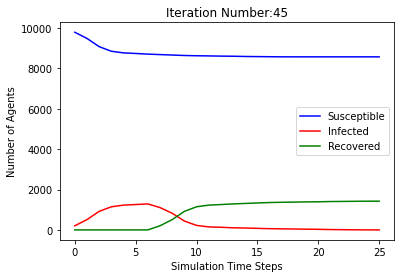

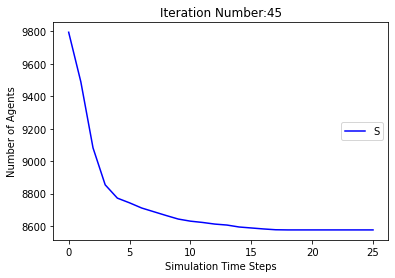

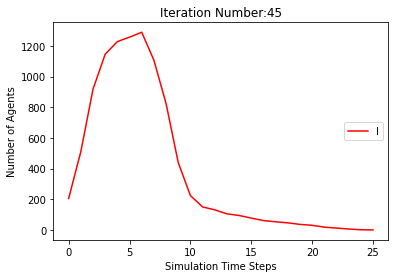

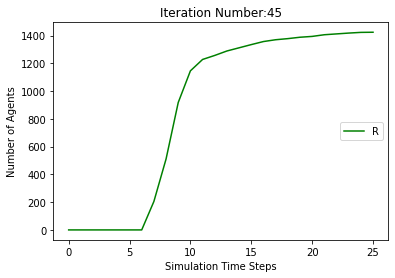

[9795, 9460, 9035, 8827, 8764, 8726, 8700, 8659, 8645, 8622, 8602, 8590, 8580, 8569, 8564, 8563, 8562, 8560, 8558, 8554, 8548, 8546, 8546, 8546, 8546, 8546, 8546, 8546, 8546]
[205, 540, 965, 1173, 1236, 1274, 1300, 1136, 815, 413, 225, 174, 146, 131, 95, 82, 60, 42, 32, 26, 21, 18, 17, 16, 14, 12, 8, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 540, 965, 1173, 1236, 1274, 1300, 1341, 1355, 1378, 1398, 1410, 1420, 1431, 1436, 1437, 1438, 1440, 1442, 1446, 1452, 1454]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594, 8594, 8594, 8594, 8594], [9

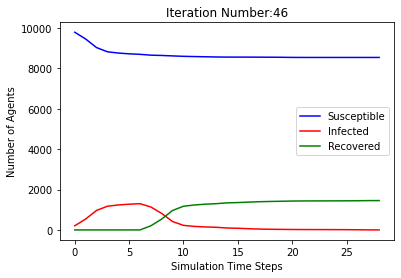

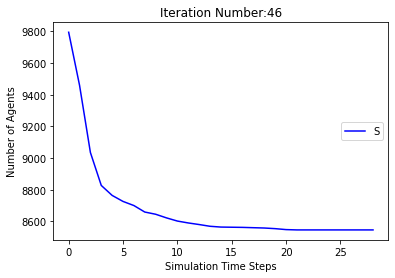

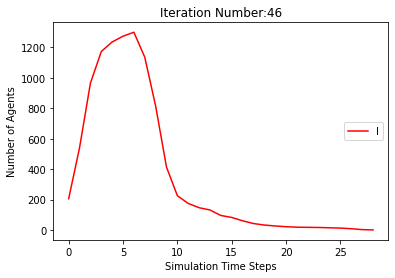

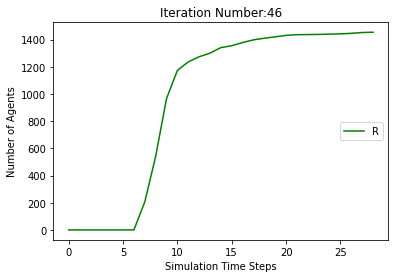

[9795, 9483, 9089, 8858, 8775, 8744, 8725, 8706, 8676, 8645, 8622, 8613, 8605, 8602, 8598, 8590, 8586, 8581, 8580, 8580, 8578, 8576, 8575, 8574, 8574, 8574, 8574, 8574, 8574, 8574, 8574]
[205, 517, 911, 1142, 1225, 1256, 1275, 1089, 807, 444, 236, 162, 139, 123, 108, 86, 59, 41, 33, 25, 24, 22, 15, 12, 7, 6, 6, 4, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 517, 911, 1142, 1225, 1256, 1275, 1294, 1324, 1355, 1378, 1387, 1395, 1398, 1402, 1410, 1414, 1419, 1420, 1420, 1422, 1424, 1425, 1426]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594

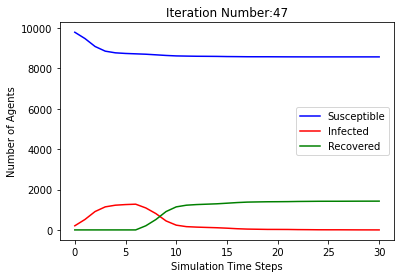

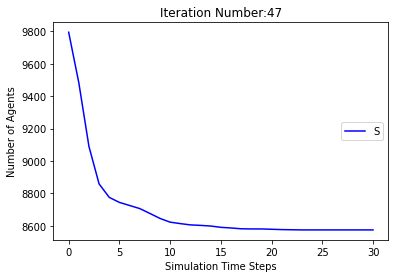

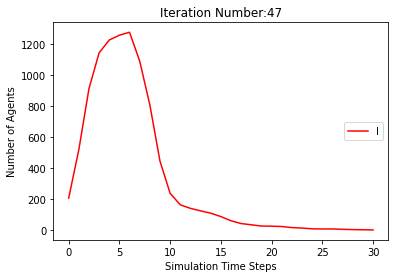

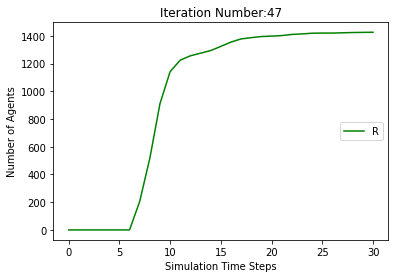

[9795, 9472, 9088, 8860, 8777, 8742, 8728, 8714, 8699, 8679, 8657, 8642, 8635, 8631, 8629, 8628, 8628, 8628, 8625, 8623, 8621, 8621, 8621, 8618, 8618, 8618, 8618, 8618, 8618, 8618, 8618]
[205, 528, 912, 1140, 1223, 1258, 1272, 1081, 773, 409, 203, 135, 107, 97, 85, 71, 51, 29, 17, 12, 10, 8, 7, 10, 10, 7, 5, 3, 3, 3, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 528, 912, 1140, 1223, 1258, 1272, 1286, 1301, 1321, 1343, 1358, 1365, 1369, 1371, 1372, 1372, 1372, 1375, 1377, 1379, 1379, 1379, 1382]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594, 8

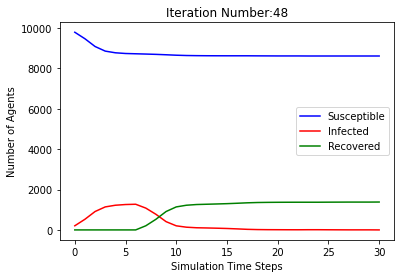

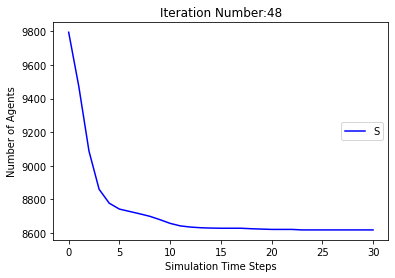

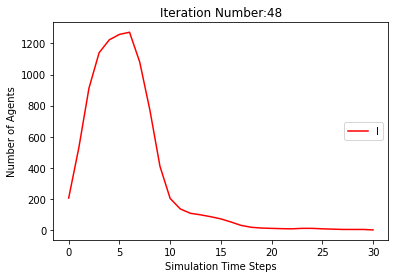

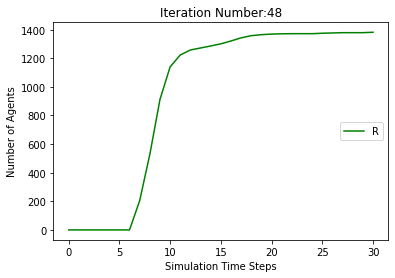

[9795, 9463, 9065, 8840, 8756, 8731, 8712, 8704, 8693, 8680, 8665, 8652, 8644, 8642, 8638, 8634, 8631, 8628, 8626, 8626, 8626, 8626, 8626, 8626, 8626, 8626]
[205, 537, 935, 1160, 1244, 1269, 1288, 1091, 770, 385, 175, 104, 87, 70, 66, 59, 49, 37, 26, 18, 16, 12, 8, 5, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 537, 935, 1160, 1244, 1269, 1288, 1296, 1307, 1320, 1335, 1348, 1356, 1358, 1362, 1366, 1369, 1372, 1374]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594, 8594, 8594, 8594, 8594], [9795, 9472, 9073, 8854, 8792, 8770, 8739, 8709, 8679

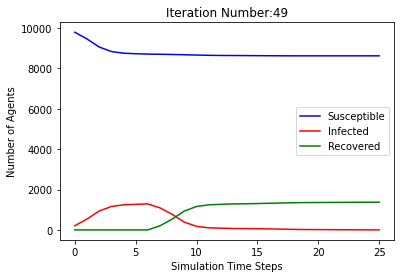

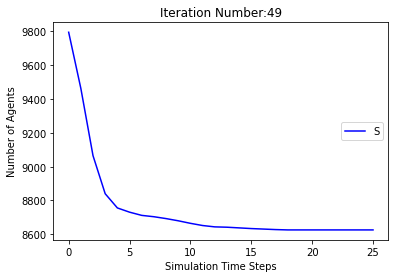

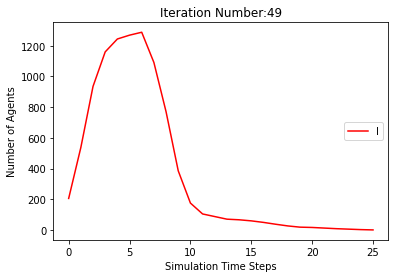

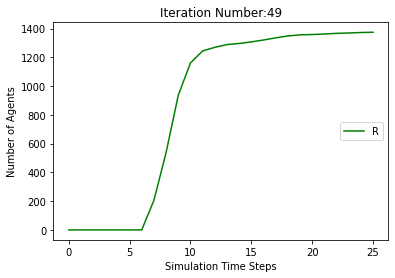

[9795, 9474, 9073, 8846, 8778, 8753, 8733, 8713, 8693, 8671, 8652, 8634, 8624, 8619, 8616, 8614, 8613, 8612, 8609, 8609, 8609, 8609, 8608, 8608, 8608, 8608, 8608, 8608, 8608, 8608]
[205, 526, 927, 1154, 1222, 1247, 1267, 1082, 781, 402, 194, 144, 129, 114, 97, 79, 58, 40, 25, 15, 10, 7, 6, 5, 4, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 526, 927, 1154, 1222, 1247, 1267, 1287, 1307, 1329, 1348, 1366, 1376, 1381, 1384, 1386, 1387, 1388, 1391, 1391, 1391, 1391, 1392]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594, 8594, 8594, 8594,

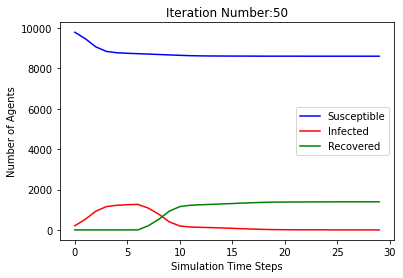

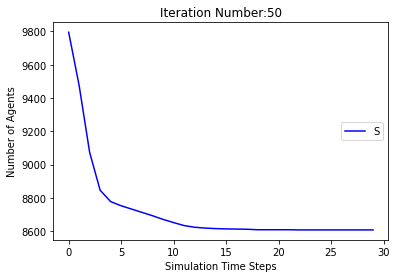

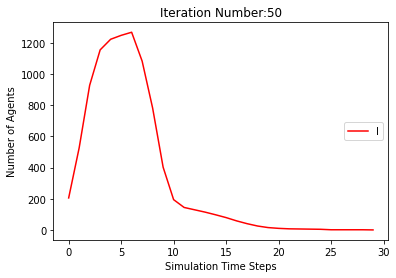

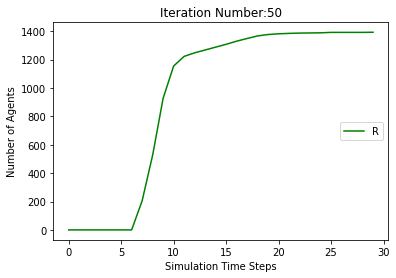

[9795, 9466, 9074, 8843, 8773, 8746, 8724, 8686, 8658, 8631, 8608, 8589, 8575, 8570, 8568, 8562, 8557, 8555, 8555, 8555, 8554, 8552, 8548, 8545, 8545, 8545, 8545, 8545, 8545, 8545, 8545]
[205, 534, 926, 1157, 1227, 1254, 1276, 1109, 808, 443, 235, 184, 171, 154, 118, 96, 74, 53, 34, 20, 16, 16, 14, 12, 10, 10, 10, 9, 7, 3, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 534, 926, 1157, 1227, 1254, 1276, 1314, 1342, 1369, 1392, 1411, 1425, 1430, 1432, 1438, 1443, 1445, 1445, 1445, 1446, 1448, 1452, 1455]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8

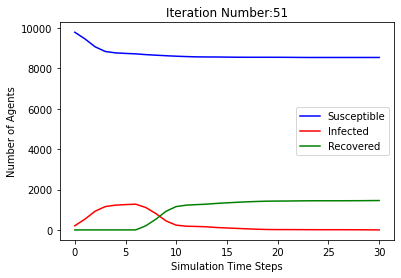

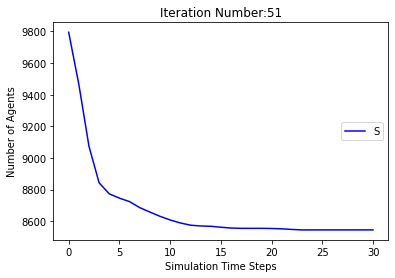

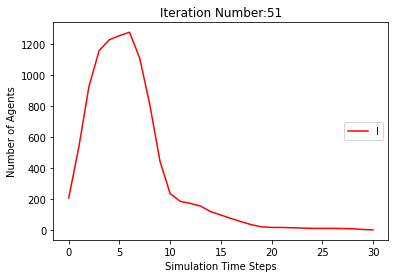

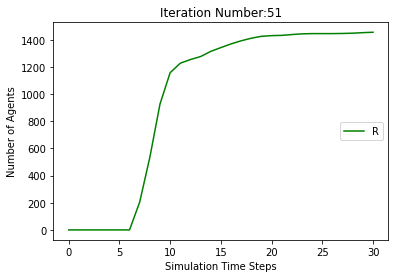

[9795, 9457, 9067, 8822, 8745, 8706, 8681, 8649, 8624, 8589, 8559, 8540, 8523, 8509, 8499, 8495, 8490, 8490, 8489, 8488, 8485, 8481, 8479, 8479, 8479, 8478, 8478, 8478, 8478, 8478, 8478, 8478, 8478]
[205, 543, 933, 1178, 1255, 1294, 1319, 1146, 833, 478, 263, 205, 183, 172, 150, 129, 99, 69, 51, 35, 24, 18, 16, 11, 11, 11, 10, 7, 3, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 543, 933, 1178, 1255, 1294, 1319, 1351, 1376, 1411, 1441, 1460, 1477, 1491, 1501, 1505, 1510, 1510, 1511, 1512, 1515, 1519, 1521, 1521, 1521, 1522]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 

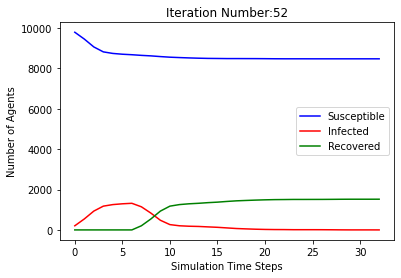

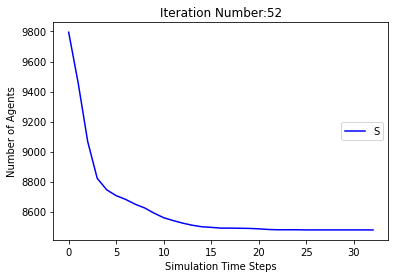

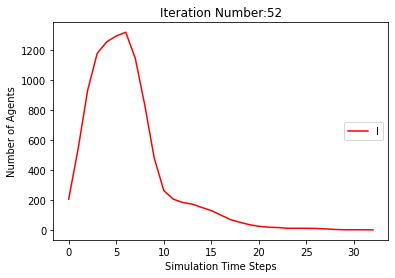

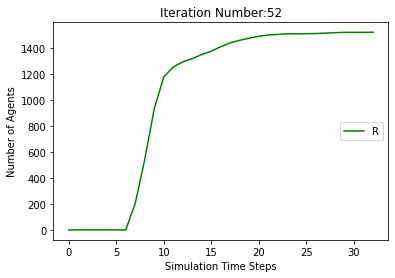

[9795, 9473, 9100, 8847, 8769, 8735, 8705, 8684, 8664, 8639, 8618, 8604, 8581, 8560, 8551, 8545, 8538, 8533, 8530, 8527, 8526, 8525, 8521, 8521, 8521, 8521, 8521, 8521, 8521, 8521]
[205, 527, 900, 1153, 1231, 1265, 1295, 1111, 809, 461, 229, 165, 154, 145, 133, 119, 101, 85, 74, 54, 34, 26, 24, 17, 12, 9, 6, 5, 4, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 527, 900, 1153, 1231, 1265, 1295, 1316, 1336, 1361, 1382, 1396, 1419, 1440, 1449, 1455, 1462, 1467, 1470, 1473, 1474, 1475, 1479]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594, 8594, 8594

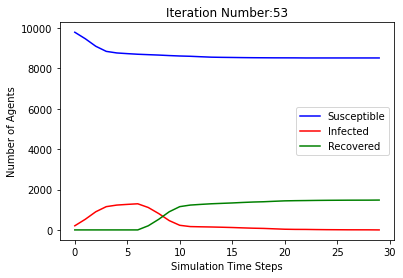

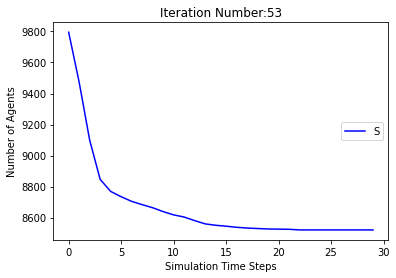

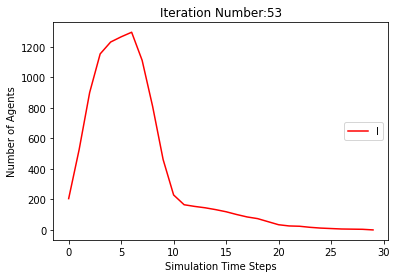

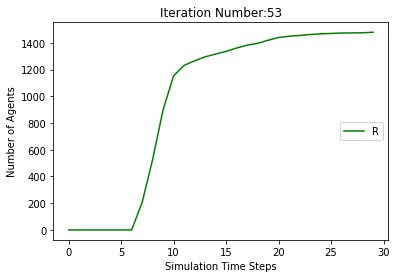

[9795, 9486, 9079, 8840, 8772, 8746, 8719, 8694, 8670, 8647, 8635, 8623, 8614, 8609, 8606, 8604, 8598, 8597, 8596, 8596, 8596, 8595, 8593, 8589, 8589, 8588, 8586, 8585, 8585, 8585, 8585, 8585, 8585, 8584, 8583, 8580, 8579, 8579, 8579, 8579, 8579, 8579, 8579, 8579]
[205, 514, 921, 1160, 1228, 1254, 1281, 1101, 816, 432, 205, 149, 132, 110, 88, 66, 49, 38, 27, 18, 13, 11, 11, 9, 8, 8, 10, 11, 10, 8, 4, 4, 3, 2, 2, 5, 6, 6, 6, 6, 5, 4, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 514, 921, 1160, 1228, 1254, 1281, 1306, 1330, 1353, 1365, 1377, 1386, 1391, 1394, 1396, 1402, 1403, 1404, 1404, 1404, 1405, 1407, 1411, 1411, 1412, 1414, 1415, 1415, 1415, 1415, 1415, 1415, 1416, 1417, 1420, 1421]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 85

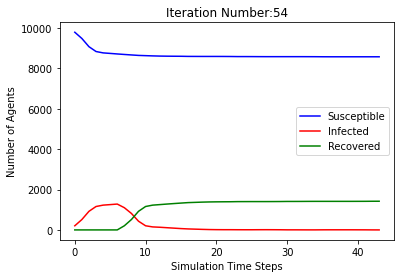

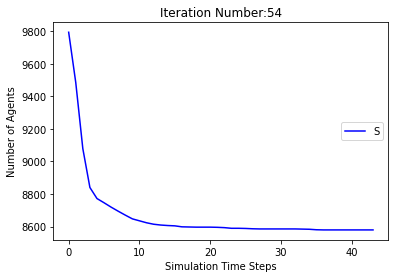

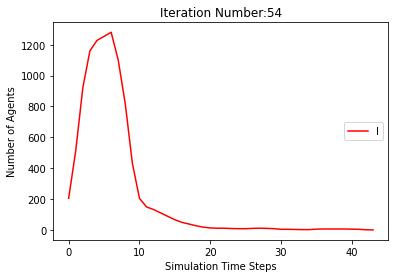

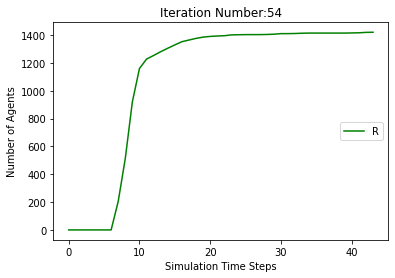

[9795, 9468, 9083, 8844, 8761, 8733, 8711, 8691, 8662, 8641, 8624, 8610, 8595, 8580, 8571, 8561, 8554, 8554, 8554, 8554, 8552, 8548, 8544, 8544, 8543, 8542, 8539, 8538, 8538, 8538, 8538, 8538, 8538, 8538, 8538]
[205, 532, 917, 1156, 1239, 1267, 1289, 1104, 806, 442, 220, 151, 138, 131, 120, 101, 87, 70, 56, 41, 28, 23, 17, 10, 11, 12, 15, 14, 10, 6, 6, 5, 4, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 532, 917, 1156, 1239, 1267, 1289, 1309, 1338, 1359, 1376, 1390, 1405, 1420, 1429, 1439, 1446, 1446, 1446, 1446, 1448, 1452, 1456, 1456, 1457, 1458, 1461, 1462]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624

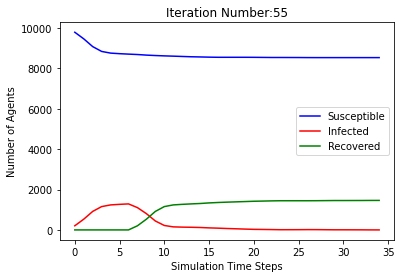

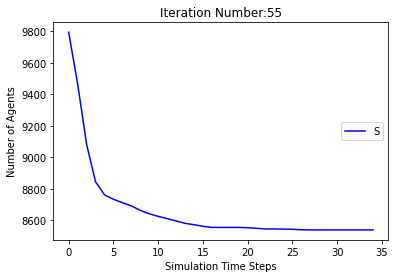

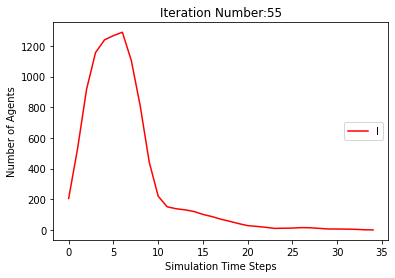

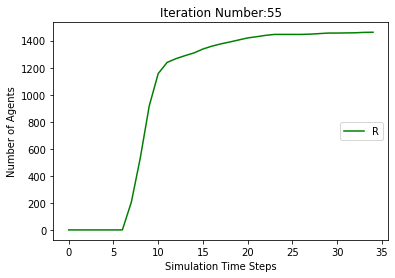

[9795, 9460, 9065, 8852, 8776, 8753, 8726, 8702, 8679, 8660, 8653, 8646, 8645, 8642, 8638, 8631, 8624, 8621, 8615, 8614, 8614, 8614, 8614, 8614, 8614, 8614, 8614]
[205, 540, 935, 1148, 1224, 1247, 1274, 1093, 781, 405, 199, 130, 108, 84, 64, 48, 36, 32, 31, 31, 28, 24, 17, 10, 7, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 540, 935, 1148, 1224, 1247, 1274, 1298, 1321, 1340, 1347, 1354, 1355, 1358, 1362, 1369, 1376, 1379, 1385, 1386]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594, 8594, 8594, 8594, 8594], [9795, 9472, 9073, 8854, 8792, 8770

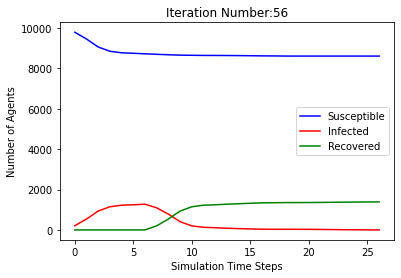

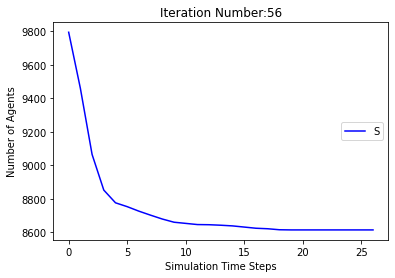

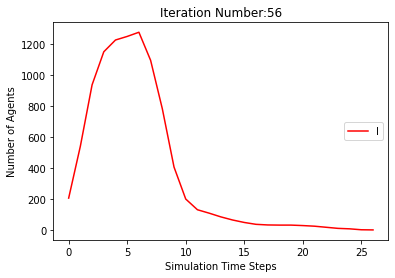

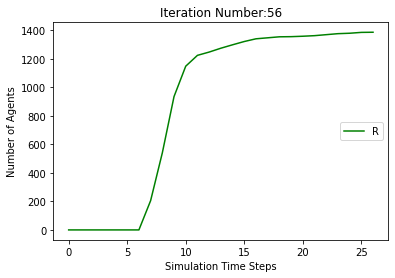

[9795, 9461, 9039, 8821, 8759, 8736, 8708, 8671, 8619, 8589, 8567, 8548, 8533, 8524, 8514, 8507, 8504, 8502, 8501, 8500, 8494, 8491, 8490, 8487, 8485, 8484, 8484, 8484, 8484, 8484, 8484, 8484, 8484]
[205, 539, 961, 1179, 1241, 1264, 1292, 1124, 842, 450, 254, 211, 203, 184, 157, 112, 85, 65, 47, 33, 30, 23, 17, 17, 17, 17, 16, 10, 7, 6, 3, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 539, 961, 1179, 1241, 1264, 1292, 1329, 1381, 1411, 1433, 1452, 1467, 1476, 1486, 1493, 1496, 1498, 1499, 1500, 1506, 1509, 1510, 1513, 1515, 1516]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595,

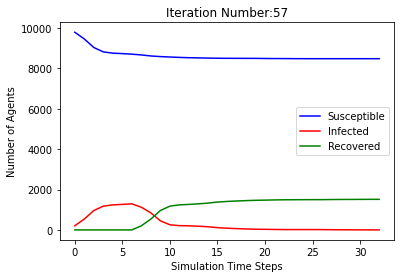

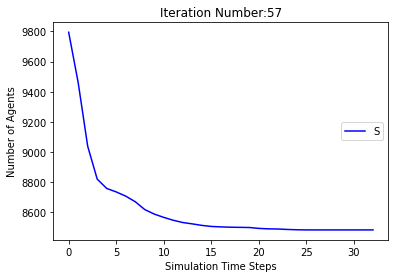

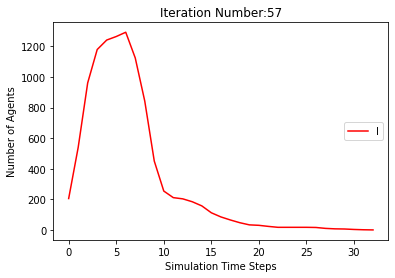

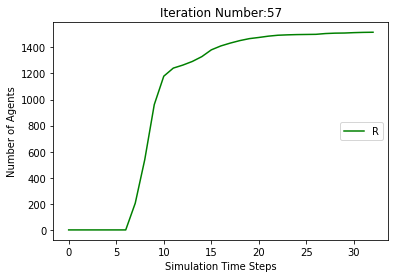

[9795, 9473, 9081, 8854, 8772, 8725, 8695, 8674, 8652, 8620, 8582, 8559, 8558, 8556, 8553, 8548, 8545, 8544, 8544, 8544, 8544, 8544, 8544, 8544, 8544]
[205, 527, 919, 1146, 1228, 1275, 1305, 1121, 821, 461, 272, 213, 167, 139, 121, 104, 75, 38, 15, 14, 12, 9, 4, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 527, 919, 1146, 1228, 1275, 1305, 1326, 1348, 1380, 1418, 1441, 1442, 1444, 1447, 1452, 1455, 1456]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594, 8594, 8594, 8594, 8594], [9795, 9472, 9073, 8854, 8792, 8770, 8739, 8709, 8679, 8656, 8629

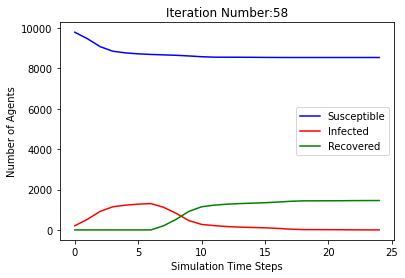

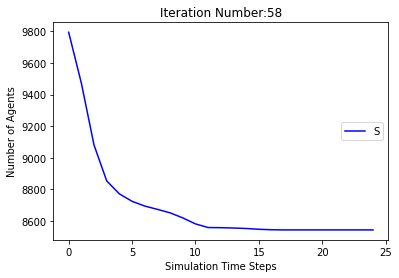

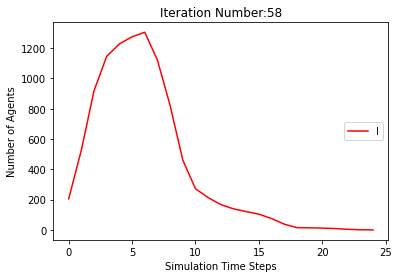

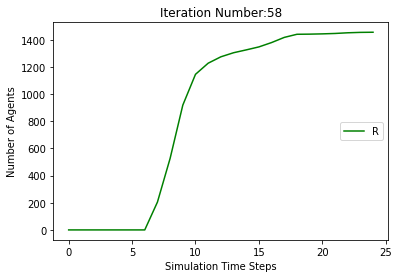

[9795, 9484, 9055, 8818, 8756, 8738, 8717, 8691, 8672, 8644, 8621, 8609, 8599, 8595, 8591, 8588, 8580, 8579, 8575, 8571, 8569, 8568, 8568, 8568, 8568, 8568, 8566, 8566, 8566, 8566, 8566, 8566, 8565, 8562, 8560, 8559, 8559, 8559, 8559, 8559, 8559, 8559, 8559]
[205, 516, 945, 1182, 1244, 1262, 1283, 1104, 812, 411, 197, 147, 139, 122, 100, 84, 64, 42, 34, 28, 26, 23, 20, 12, 11, 7, 5, 3, 2, 2, 2, 2, 3, 4, 6, 7, 7, 7, 7, 6, 3, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 516, 945, 1182, 1244, 1262, 1283, 1309, 1328, 1356, 1379, 1391, 1401, 1405, 1409, 1412, 1420, 1421, 1425, 1429, 1431, 1432, 1432, 1432, 1432, 1432, 1434, 1434, 1434, 1434, 1434, 1434, 1435, 1438, 1440, 1441]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585,

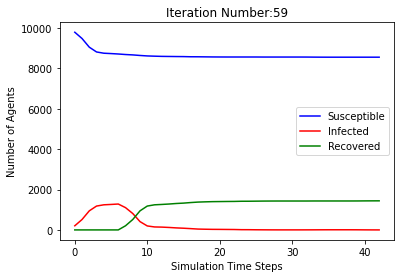

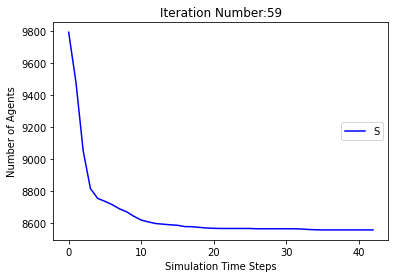

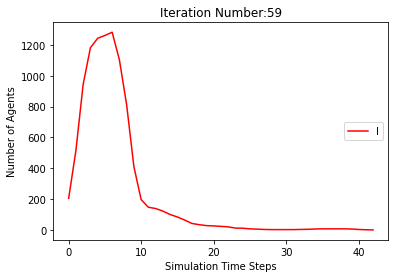

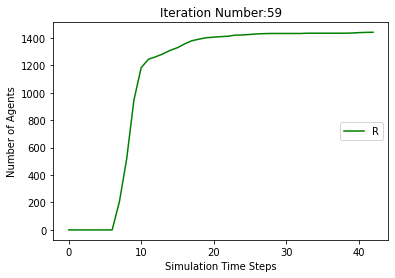

[9795, 9464, 9055, 8839, 8753, 8715, 8696, 8683, 8673, 8659, 8644, 8633, 8626, 8624, 8621, 8619, 8616, 8614, 8612, 8611, 8608, 8608, 8608, 8608, 8608, 8608, 8608, 8608]
[205, 536, 945, 1161, 1247, 1285, 1304, 1112, 791, 396, 195, 120, 89, 72, 62, 54, 43, 30, 21, 15, 16, 13, 11, 8, 6, 4, 3, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 536, 945, 1161, 1247, 1285, 1304, 1317, 1327, 1341, 1356, 1367, 1374, 1376, 1379, 1381, 1384, 1386, 1388, 1389, 1392]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594, 8594, 8594, 8594, 8594], [9795, 9472, 9073, 885

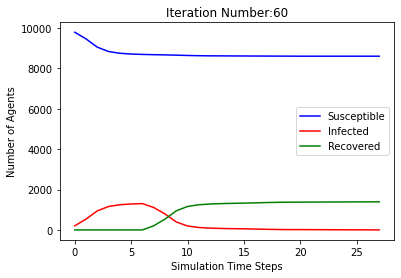

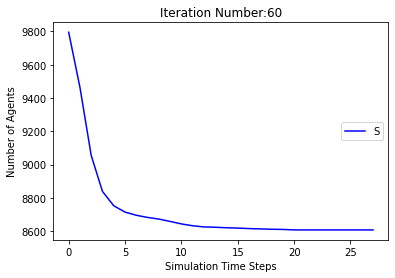

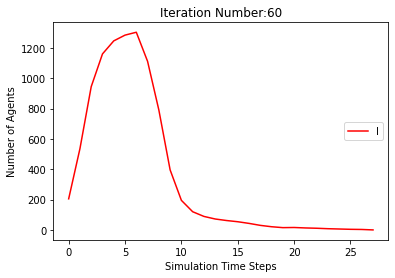

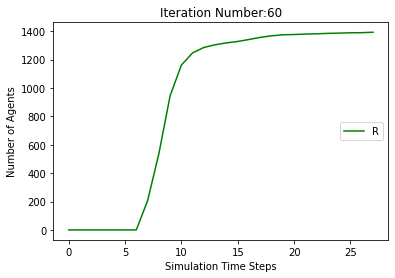

[9795, 9459, 9051, 8859, 8794, 8762, 8733, 8711, 8687, 8650, 8629, 8607, 8592, 8590, 8587, 8585, 8583, 8583, 8582, 8582, 8582, 8581, 8581, 8581, 8581, 8581, 8581, 8581, 8580, 8580, 8580, 8580, 8580, 8580, 8580, 8580]
[205, 541, 949, 1141, 1206, 1238, 1267, 1084, 772, 401, 230, 187, 170, 143, 124, 102, 67, 46, 25, 10, 8, 6, 4, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 541, 949, 1141, 1206, 1238, 1267, 1289, 1313, 1350, 1371, 1393, 1408, 1410, 1413, 1415, 1417, 1417, 1418, 1418, 1418, 1419, 1419, 1419, 1419, 1419, 1419, 1419, 1420]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635

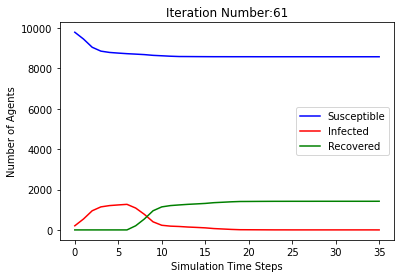

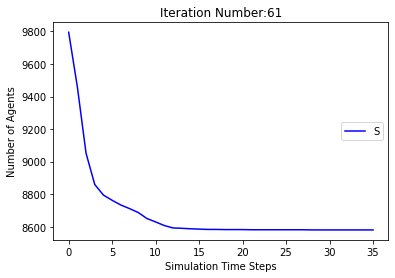

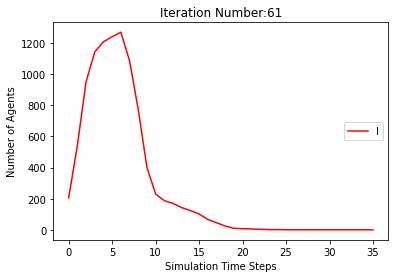

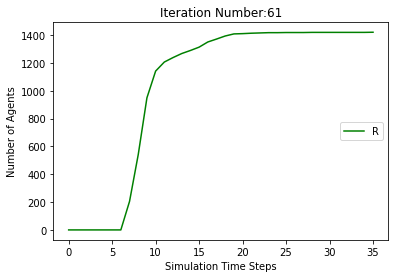

[9795, 9466, 9062, 8835, 8756, 8723, 8695, 8666, 8637, 8611, 8600, 8590, 8589, 8582, 8575, 8569, 8564, 8564, 8563, 8563, 8563, 8563, 8563, 8563, 8563, 8563]
[205, 534, 938, 1165, 1244, 1277, 1305, 1129, 829, 451, 235, 166, 134, 113, 91, 68, 47, 36, 27, 26, 19, 12, 6, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 534, 938, 1165, 1244, 1277, 1305, 1334, 1363, 1389, 1400, 1410, 1411, 1418, 1425, 1431, 1436, 1436, 1437]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594, 8594, 8594, 8594, 8594], [9795, 9472, 9073, 8854, 8792, 8770, 8739, 8709, 86

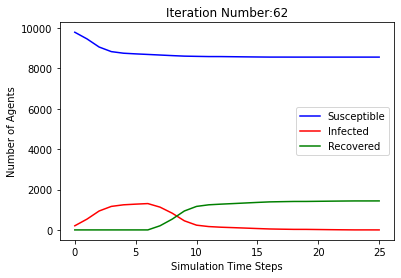

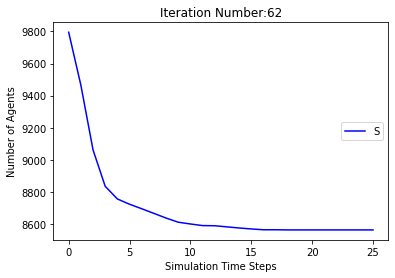

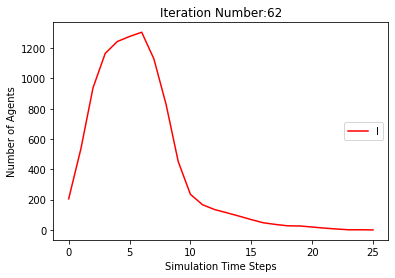

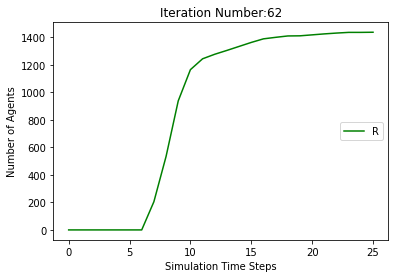

[9795, 9474, 9052, 8841, 8766, 8730, 8706, 8674, 8650, 8629, 8616, 8593, 8577, 8569, 8561, 8556, 8553, 8553, 8552, 8550, 8549, 8546, 8546, 8546, 8546, 8546, 8546, 8546, 8546]
[205, 526, 948, 1159, 1234, 1270, 1294, 1121, 824, 423, 225, 173, 153, 137, 113, 94, 76, 63, 41, 27, 20, 15, 10, 7, 7, 6, 4, 3, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 526, 948, 1159, 1234, 1270, 1294, 1326, 1350, 1371, 1384, 1407, 1423, 1431, 1439, 1444, 1447, 1447, 1448, 1450, 1451, 1454]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594, 8594, 8594, 8594, 8594], [979

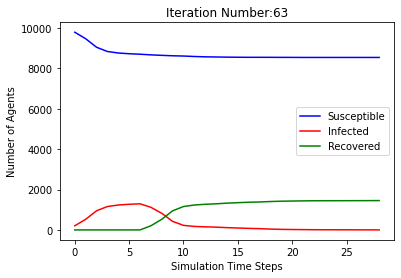

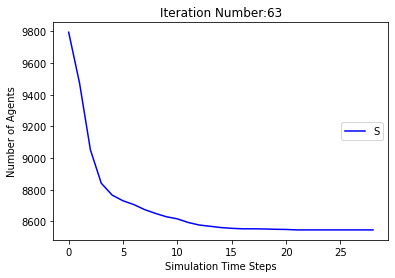

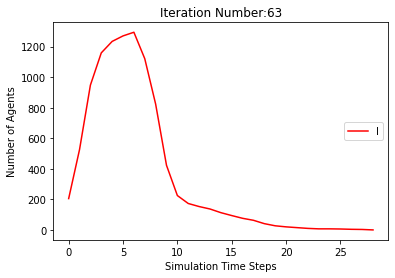

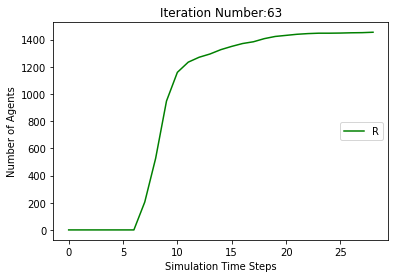

[9795, 9473, 9080, 8857, 8785, 8757, 8726, 8700, 8677, 8663, 8654, 8646, 8638, 8629, 8624, 8621, 8621, 8621, 8621, 8621, 8621, 8621, 8621]
[205, 527, 920, 1143, 1215, 1243, 1274, 1095, 796, 417, 203, 139, 119, 97, 76, 56, 42, 33, 25, 17, 8, 3, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 527, 920, 1143, 1215, 1243, 1274, 1300, 1323, 1337, 1346, 1354, 1362, 1371, 1376, 1379]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594, 8594, 8594, 8594, 8594], [9795, 9472, 9073, 8854, 8792, 8770, 8739, 8709, 8679, 8656, 8629, 8606, 8594, 8590, 8585, 8582, 85

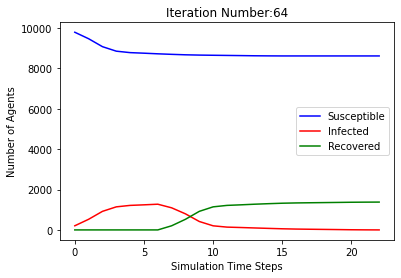

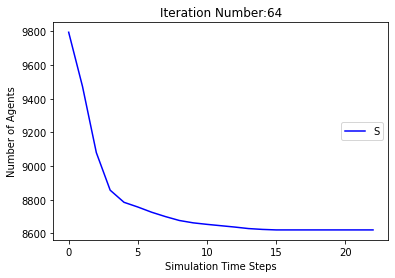

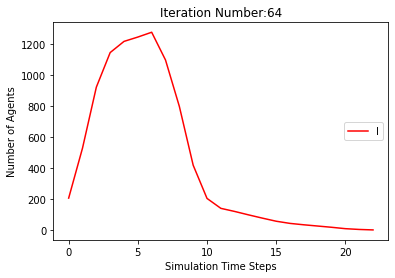

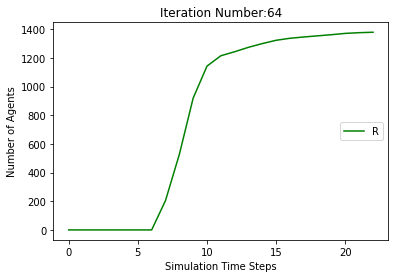

[9795, 9476, 9069, 8836, 8776, 8753, 8743, 8720, 8703, 8683, 8666, 8653, 8645, 8639, 8629, 8621, 8618, 8616, 8612, 8609, 8608, 8605, 8605, 8604, 8603, 8603, 8602, 8600, 8599, 8599, 8599, 8599, 8599, 8599, 8599, 8599]
[205, 524, 931, 1164, 1224, 1247, 1257, 1075, 773, 386, 170, 123, 108, 104, 91, 82, 65, 50, 41, 36, 31, 24, 16, 14, 13, 9, 7, 8, 6, 6, 5, 4, 4, 3, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 524, 931, 1164, 1224, 1247, 1257, 1280, 1297, 1317, 1334, 1347, 1355, 1361, 1371, 1379, 1382, 1384, 1388, 1391, 1392, 1395, 1395, 1396, 1397, 1397, 1398, 1400, 1401]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8

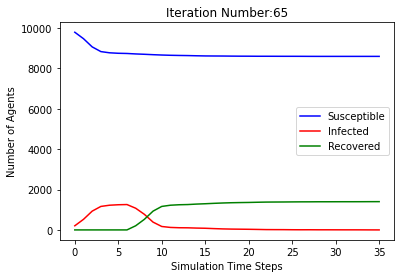

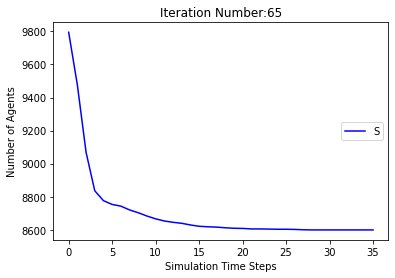

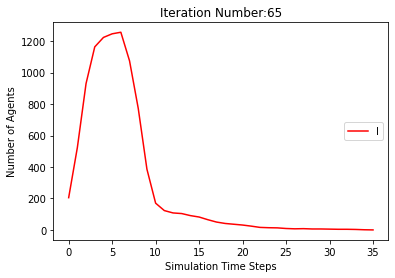

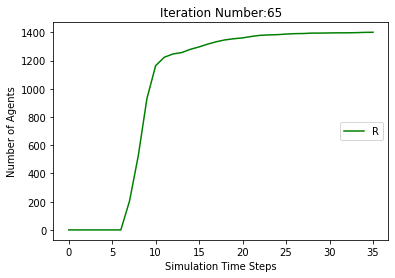

[9795, 9448, 9060, 8849, 8771, 8747, 8725, 8686, 8652, 8633, 8611, 8588, 8573, 8563, 8549, 8541, 8536, 8536, 8534, 8533, 8533, 8533, 8533, 8533, 8531, 8530, 8529, 8529, 8529, 8529, 8529, 8528, 8528, 8528, 8528, 8528, 8528, 8528, 8528]
[205, 552, 940, 1151, 1229, 1253, 1275, 1109, 796, 427, 238, 183, 174, 162, 137, 111, 97, 75, 54, 40, 30, 16, 8, 3, 5, 4, 4, 4, 4, 4, 4, 3, 2, 1, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 552, 940, 1151, 1229, 1253, 1275, 1314, 1348, 1367, 1389, 1412, 1427, 1437, 1451, 1459, 1464, 1464, 1466, 1467, 1467, 1467, 1467, 1467, 1469, 1470, 1471, 1471, 1471, 1471, 1471, 1472]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888,

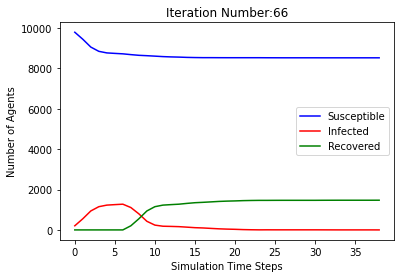

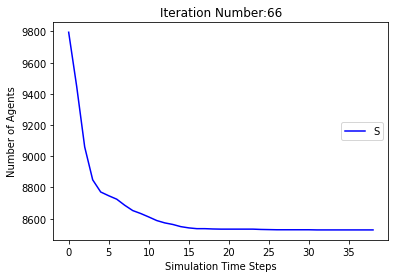

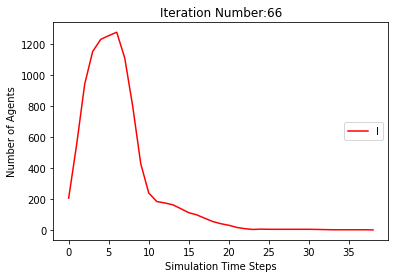

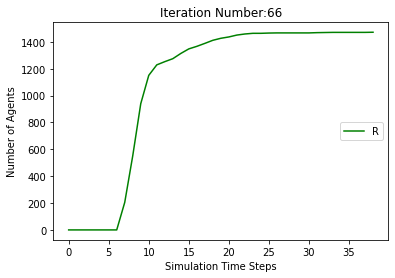

[9795, 9460, 9075, 8845, 8771, 8742, 8722, 8706, 8680, 8652, 8626, 8619, 8607, 8593, 8588, 8584, 8580, 8575, 8575, 8575, 8575, 8575, 8575, 8572, 8570, 8570, 8570, 8570, 8570, 8570, 8569, 8566, 8565, 8565, 8565, 8565, 8565, 8565, 8565, 8565]
[205, 540, 925, 1155, 1229, 1258, 1278, 1089, 780, 423, 219, 152, 135, 129, 118, 96, 72, 51, 44, 32, 18, 13, 9, 8, 5, 5, 5, 5, 5, 5, 3, 4, 5, 5, 5, 5, 5, 4, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 540, 925, 1155, 1229, 1258, 1278, 1294, 1320, 1348, 1374, 1381, 1393, 1407, 1412, 1416, 1420, 1425, 1425, 1425, 1425, 1425, 1425, 1428, 1430, 1430, 1430, 1430, 1430, 1430, 1431, 1434, 1435]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 949

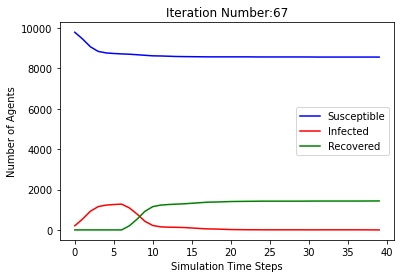

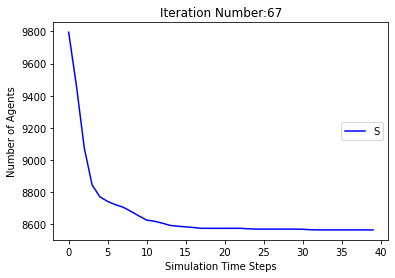

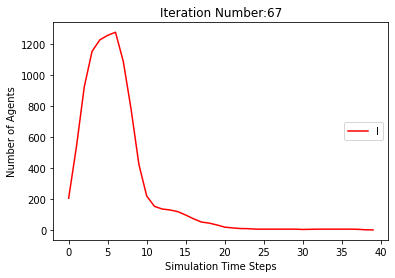

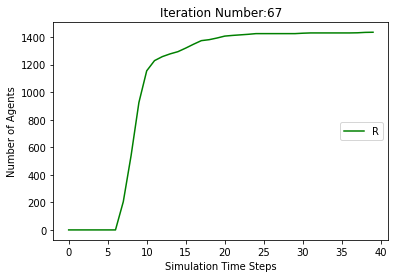

[9795, 9472, 9107, 8854, 8788, 8756, 8726, 8699, 8678, 8660, 8648, 8637, 8630, 8624, 8620, 8616, 8614, 8609, 8605, 8601, 8600, 8600, 8600, 8600, 8600, 8600, 8600, 8600]
[205, 528, 893, 1146, 1212, 1244, 1274, 1096, 794, 447, 206, 151, 126, 102, 79, 62, 46, 39, 32, 29, 24, 20, 16, 14, 9, 5, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 528, 893, 1146, 1212, 1244, 1274, 1301, 1322, 1340, 1352, 1363, 1370, 1376, 1380, 1384, 1386, 1391, 1395, 1399, 1400]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594, 8594, 8594, 8594, 8594], [9795, 9472, 9073, 

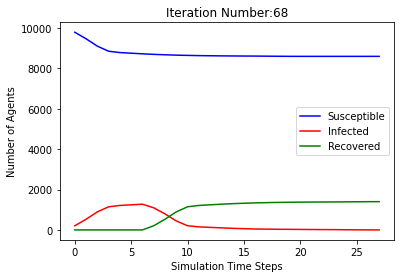

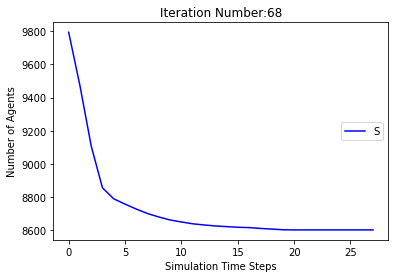

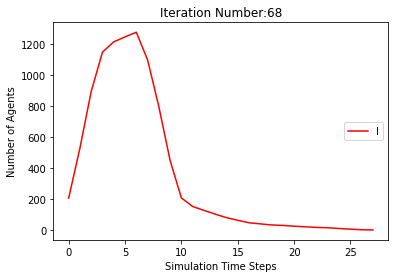

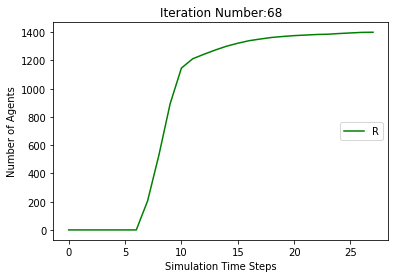

[9795, 9466, 9090, 8833, 8750, 8730, 8703, 8681, 8660, 8635, 8609, 8599, 8588, 8578, 8568, 8567, 8564, 8563, 8562, 8558, 8555, 8554, 8554, 8554, 8554, 8554, 8554, 8554, 8554]
[205, 534, 910, 1167, 1250, 1270, 1297, 1114, 806, 455, 224, 151, 142, 125, 113, 93, 71, 46, 37, 30, 23, 14, 13, 10, 9, 8, 4, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 534, 910, 1167, 1250, 1270, 1297, 1319, 1340, 1365, 1391, 1401, 1412, 1422, 1432, 1433, 1436, 1437, 1438, 1442, 1445, 1446]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594, 8594, 8594, 8594, 8594], [97

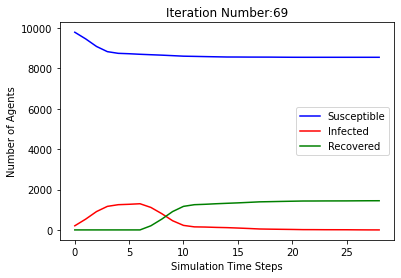

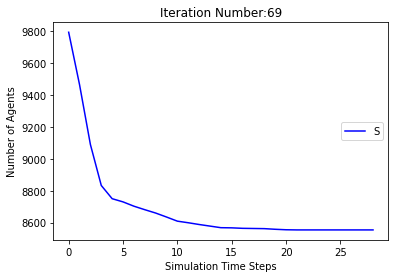

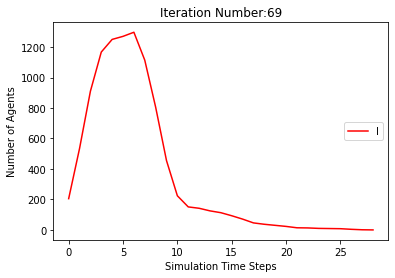

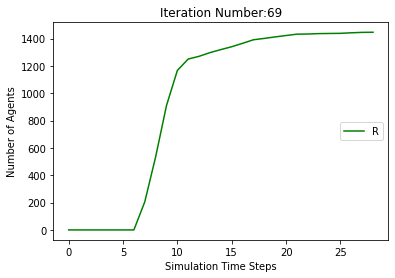

[9795, 9451, 9055, 8824, 8756, 8728, 8710, 8694, 8673, 8649, 8629, 8597, 8572, 8565, 8556, 8550, 8546, 8540, 8537, 8535, 8530, 8528, 8525, 8524, 8524, 8524, 8524, 8524, 8524, 8524, 8524]
[205, 549, 945, 1176, 1244, 1272, 1290, 1101, 778, 406, 195, 159, 156, 145, 138, 123, 103, 89, 60, 37, 35, 28, 25, 22, 16, 13, 11, 6, 4, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 549, 945, 1176, 1244, 1272, 1290, 1306, 1327, 1351, 1371, 1403, 1428, 1435, 1444, 1450, 1454, 1460, 1463, 1465, 1470, 1472, 1475, 1476]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594,

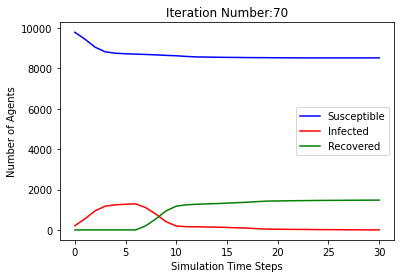

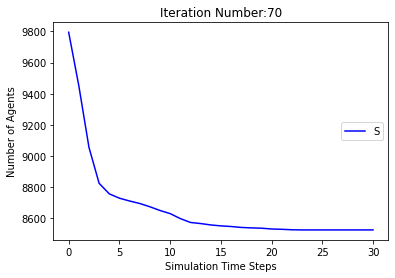

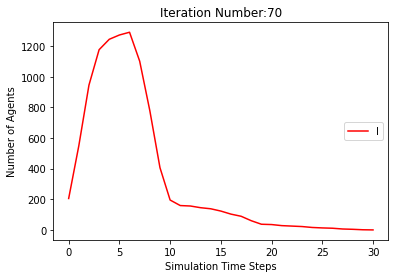

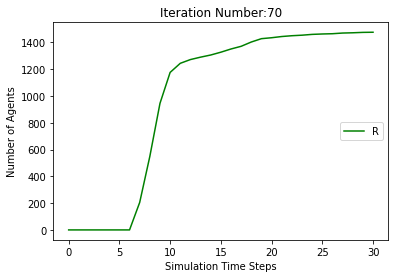

[9795, 9464, 9061, 8843, 8771, 8739, 8718, 8697, 8678, 8661, 8644, 8631, 8624, 8621, 8620, 8620, 8620, 8620, 8620, 8620, 8619, 8618, 8618, 8618, 8618, 8618, 8618, 8618, 8618]
[205, 536, 939, 1157, 1229, 1261, 1282, 1098, 786, 400, 199, 140, 115, 97, 77, 58, 41, 24, 11, 4, 2, 2, 2, 2, 2, 2, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 536, 939, 1157, 1229, 1261, 1282, 1303, 1322, 1339, 1356, 1369, 1376, 1379, 1380, 1380, 1380, 1380, 1380, 1380, 1381, 1382]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594, 8594, 8594, 8594, 8594], [9795, 947

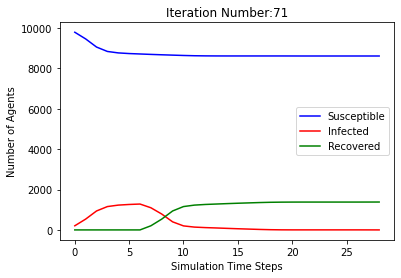

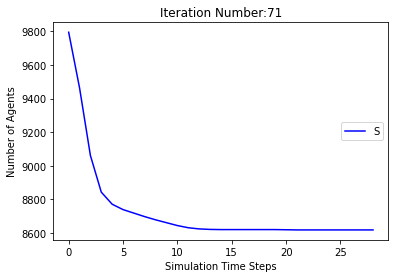

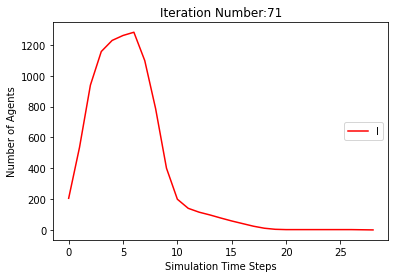

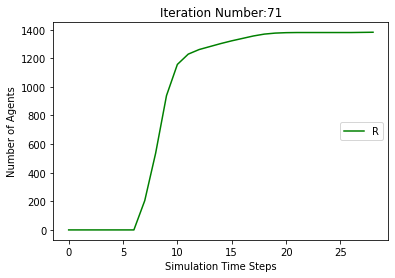

[9795, 9470, 9087, 8844, 8768, 8751, 8731, 8692, 8665, 8641, 8617, 8605, 8593, 8581, 8573, 8572, 8571, 8570, 8568, 8566, 8565, 8565, 8565, 8565, 8565, 8565, 8565, 8564, 8564, 8564, 8562, 8558, 8555, 8555, 8555, 8555, 8555, 8555, 8555, 8555]
[205, 530, 913, 1156, 1232, 1249, 1269, 1103, 805, 446, 227, 163, 158, 150, 119, 93, 70, 47, 37, 27, 16, 8, 7, 6, 5, 3, 1, 1, 1, 1, 3, 7, 10, 10, 9, 9, 9, 7, 3, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 530, 913, 1156, 1232, 1249, 1269, 1308, 1335, 1359, 1383, 1395, 1407, 1419, 1427, 1428, 1429, 1430, 1432, 1434, 1435, 1435, 1435, 1435, 1435, 1435, 1435, 1436, 1436, 1436, 1438, 1442, 1445]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 94

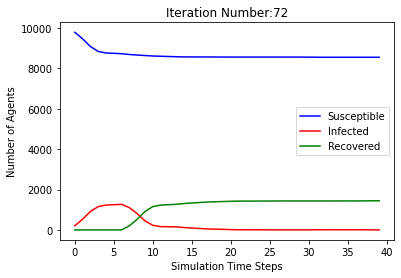

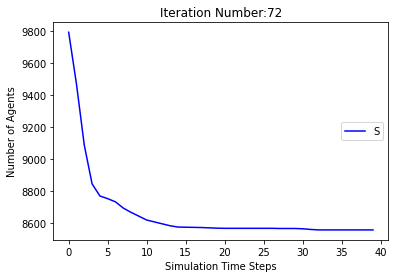

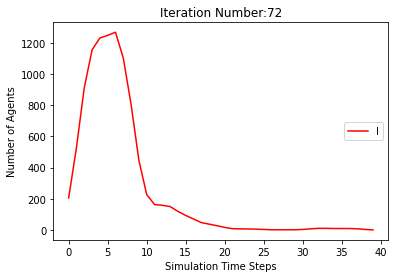

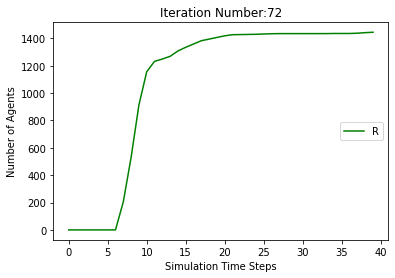

[9795, 9459, 9044, 8836, 8775, 8745, 8716, 8678, 8656, 8628, 8602, 8582, 8569, 8566, 8566, 8564, 8561, 8556, 8554, 8553, 8552, 8552, 8552, 8552, 8552, 8552, 8552, 8552]
[205, 541, 956, 1164, 1225, 1255, 1284, 1117, 803, 416, 234, 193, 176, 150, 112, 92, 67, 46, 28, 16, 14, 14, 12, 9, 4, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 541, 956, 1164, 1225, 1255, 1284, 1322, 1344, 1372, 1398, 1418, 1431, 1434, 1434, 1436, 1439, 1444, 1446, 1447, 1448]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594, 8594, 8594, 8594, 8594], [9795, 9472, 9073, 

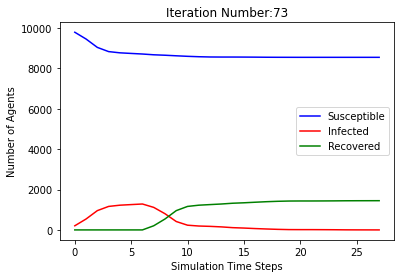

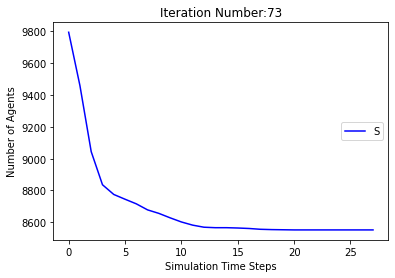

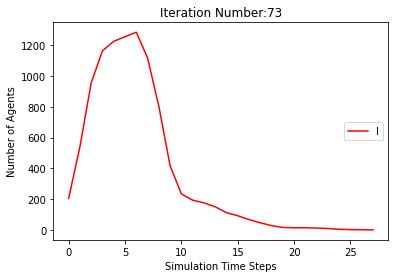

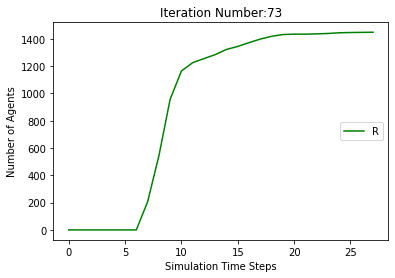

[9795, 9456, 9031, 8813, 8754, 8733, 8701, 8667, 8646, 8625, 8608, 8592, 8579, 8571, 8567, 8563, 8558, 8556, 8555, 8555, 8555, 8555, 8555, 8555, 8555, 8555]
[205, 544, 969, 1187, 1246, 1267, 1299, 1128, 810, 406, 205, 162, 154, 130, 100, 83, 67, 52, 37, 24, 16, 12, 8, 3, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 544, 969, 1187, 1246, 1267, 1299, 1333, 1354, 1375, 1392, 1408, 1421, 1429, 1433, 1437, 1442, 1444, 1445]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594, 8594, 8594, 8594, 8594], [9795, 9472, 9073, 8854, 8792, 8770, 8739, 8709, 8

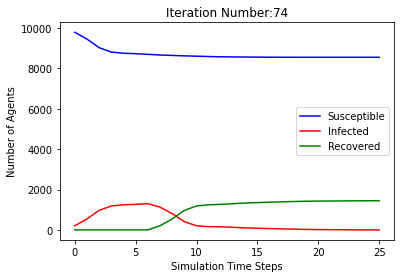

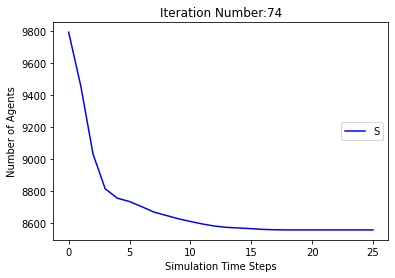

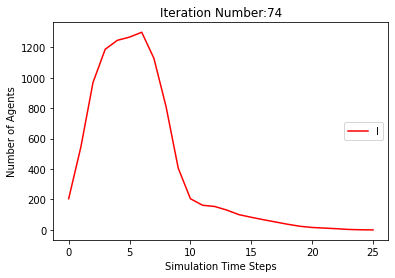

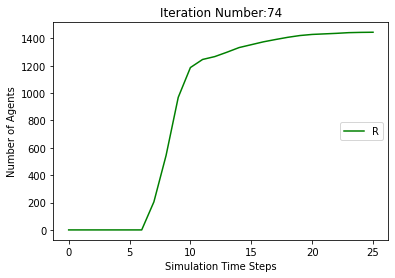

[9795, 9461, 9072, 8838, 8783, 8761, 8736, 8708, 8685, 8662, 8647, 8637, 8631, 8626, 8619, 8611, 8608, 8606, 8605, 8603, 8598, 8594, 8593, 8593, 8591, 8589, 8586, 8586, 8586, 8583, 8581, 8580, 8580, 8580, 8580, 8580, 8580, 8580, 8580]
[205, 539, 928, 1162, 1217, 1239, 1264, 1087, 776, 410, 191, 146, 130, 110, 89, 74, 54, 41, 32, 28, 28, 25, 18, 15, 15, 16, 17, 12, 8, 10, 12, 11, 9, 6, 6, 6, 3, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 539, 928, 1162, 1217, 1239, 1264, 1292, 1315, 1338, 1353, 1363, 1369, 1374, 1381, 1389, 1392, 1394, 1395, 1397, 1402, 1406, 1407, 1407, 1409, 1411, 1414, 1414, 1414, 1417, 1419, 1420]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104

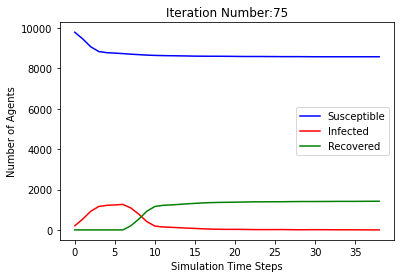

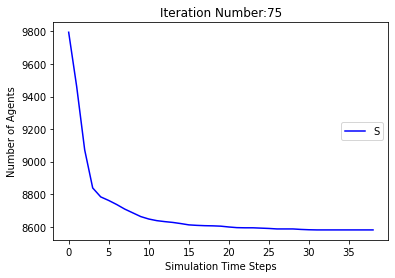

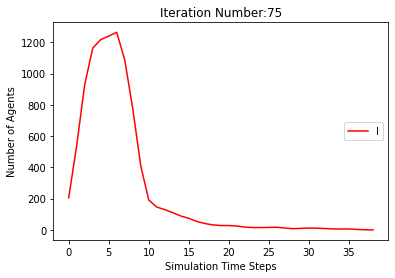

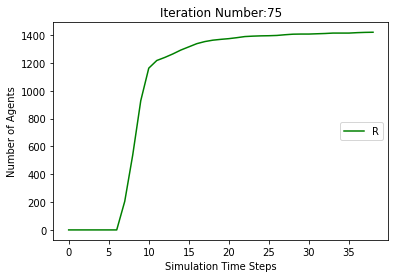

[9795, 9483, 9075, 8855, 8780, 8754, 8739, 8724, 8713, 8697, 8680, 8656, 8633, 8619, 8611, 8605, 8599, 8599, 8599, 8598, 8597, 8597, 8596, 8596, 8596, 8596, 8596, 8596, 8596, 8596]
[205, 517, 925, 1145, 1220, 1246, 1261, 1071, 770, 378, 175, 124, 121, 120, 113, 108, 98, 81, 57, 35, 22, 14, 9, 3, 3, 3, 2, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 517, 925, 1145, 1220, 1246, 1261, 1276, 1287, 1303, 1320, 1344, 1367, 1381, 1389, 1395, 1401, 1401, 1401, 1402, 1403, 1403, 1404]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594, 8594, 8594, 85

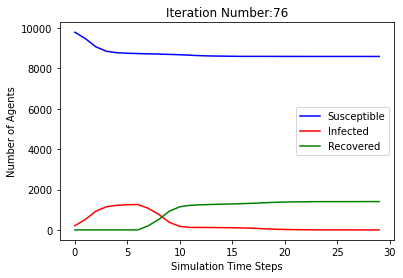

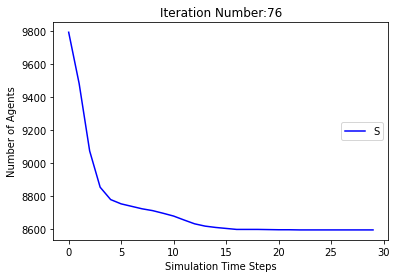

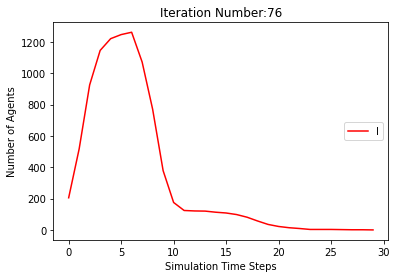

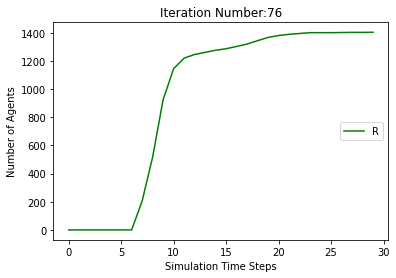

[9795, 9465, 9061, 8856, 8769, 8746, 8719, 8691, 8668, 8642, 8628, 8618, 8605, 8596, 8592, 8588, 8581, 8577, 8574, 8573, 8571, 8564, 8558, 8557, 8557, 8555, 8552, 8551, 8550, 8550, 8550, 8550, 8550, 8549, 8549, 8549, 8549, 8549, 8549, 8549, 8549]
[205, 535, 939, 1144, 1231, 1254, 1281, 1104, 797, 419, 228, 151, 141, 123, 99, 80, 61, 51, 44, 32, 25, 28, 30, 24, 20, 19, 21, 20, 14, 8, 7, 7, 5, 3, 2, 1, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 535, 939, 1144, 1231, 1254, 1281, 1309, 1332, 1358, 1372, 1382, 1395, 1404, 1408, 1412, 1419, 1423, 1426, 1427, 1429, 1436, 1442, 1443, 1443, 1445, 1448, 1449, 1450, 1450, 1450, 1450, 1450, 1451]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 85

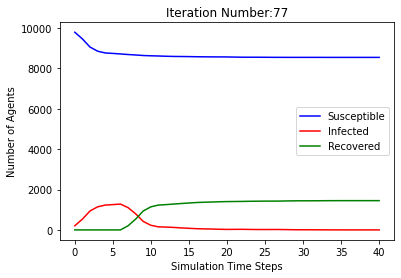

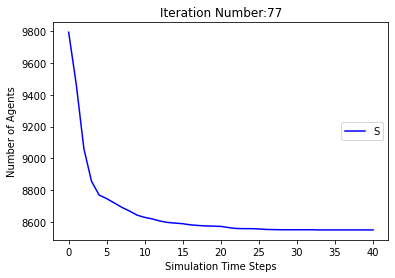

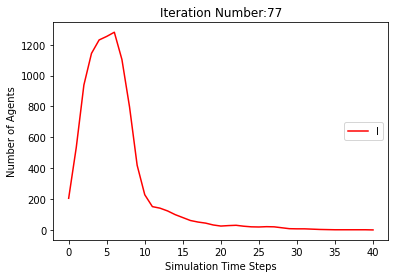

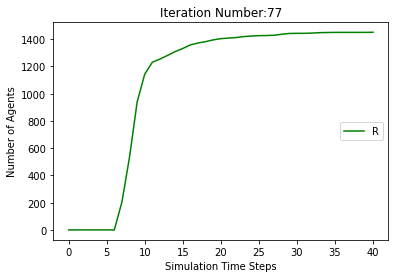

[9795, 9452, 9040, 8828, 8761, 8727, 8700, 8682, 8661, 8645, 8624, 8609, 8596, 8590, 8585, 8583, 8581, 8579, 8574, 8573, 8573, 8573, 8572, 8571, 8570, 8568, 8567, 8567, 8566, 8566, 8566, 8566, 8566, 8566, 8566, 8566]
[205, 548, 960, 1172, 1239, 1273, 1300, 1113, 791, 395, 204, 152, 131, 110, 97, 78, 64, 45, 35, 23, 17, 12, 11, 10, 9, 6, 6, 6, 7, 6, 5, 4, 2, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 548, 960, 1172, 1239, 1273, 1300, 1318, 1339, 1355, 1376, 1391, 1404, 1410, 1415, 1417, 1419, 1421, 1426, 1427, 1427, 1427, 1428, 1429, 1430, 1432, 1433, 1433, 1434]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 86

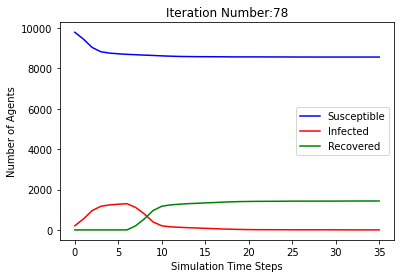

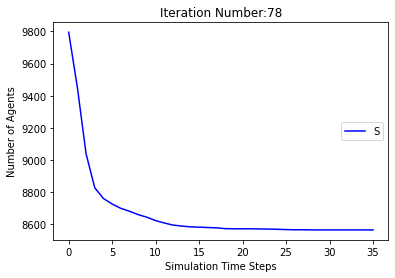

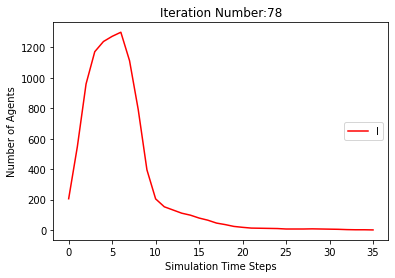

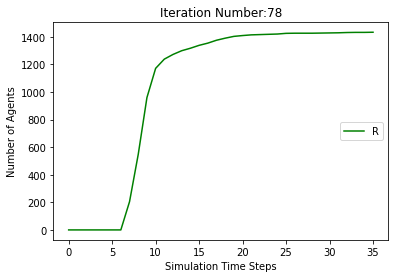

[9795, 9472, 9093, 8865, 8791, 8755, 8734, 8715, 8683, 8653, 8635, 8625, 8618, 8616, 8614, 8611, 8608, 8601, 8600, 8596, 8596, 8596, 8596, 8596, 8595, 8594, 8591, 8590, 8590, 8590, 8590, 8590, 8590, 8590, 8590]
[205, 528, 907, 1135, 1209, 1245, 1266, 1080, 789, 440, 230, 166, 137, 118, 101, 72, 45, 34, 25, 22, 20, 18, 15, 12, 6, 6, 5, 6, 6, 6, 6, 5, 4, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 528, 907, 1135, 1209, 1245, 1266, 1285, 1317, 1347, 1365, 1375, 1382, 1384, 1386, 1389, 1392, 1399, 1400, 1404, 1404, 1404, 1404, 1404, 1405, 1406, 1409, 1410]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612

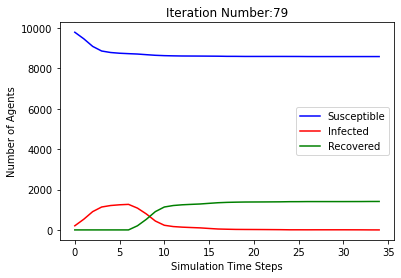

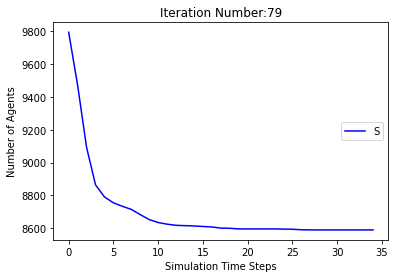

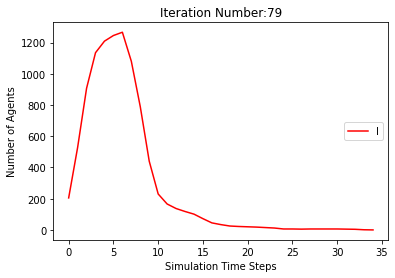

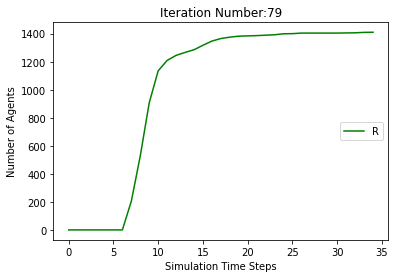

[9795, 9501, 9097, 8865, 8782, 8759, 8737, 8717, 8705, 8689, 8682, 8672, 8661, 8661, 8660, 8657, 8657, 8657, 8657, 8657, 8657, 8657, 8657]
[205, 499, 903, 1135, 1218, 1241, 1263, 1078, 796, 408, 183, 110, 98, 76, 57, 48, 32, 25, 15, 4, 4, 3, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 499, 903, 1135, 1218, 1241, 1263, 1283, 1295, 1311, 1318, 1328, 1339, 1339, 1340, 1343]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594, 8594, 8594, 8594, 8594], [9795, 9472, 9073, 8854, 8792, 8770, 8739, 8709, 8679, 8656, 8629, 8606, 8594, 8590, 8585, 8582, 8579

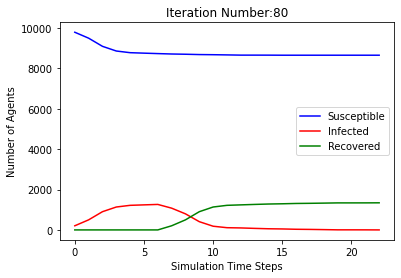

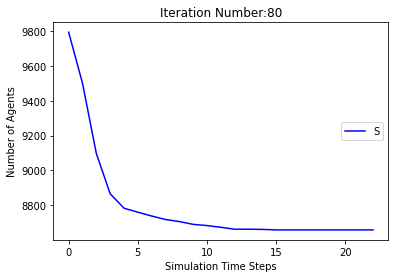

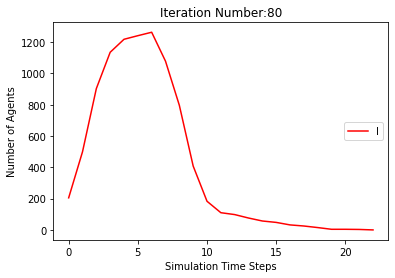

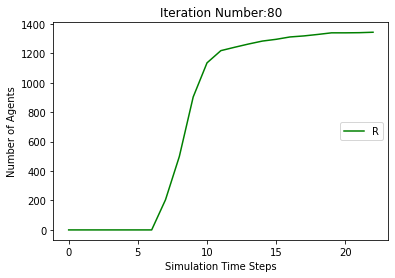

[9795, 9477, 9070, 8841, 8770, 8749, 8728, 8702, 8666, 8642, 8624, 8600, 8575, 8561, 8549, 8539, 8535, 8530, 8527, 8524, 8522, 8519, 8515, 8514, 8513, 8513, 8513, 8513, 8513, 8513, 8512, 8512, 8512, 8512, 8512, 8512, 8512, 8512]
[205, 523, 930, 1159, 1230, 1251, 1272, 1093, 811, 428, 217, 170, 174, 167, 153, 127, 107, 94, 73, 51, 39, 30, 24, 21, 17, 14, 11, 9, 6, 2, 2, 1, 1, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 523, 930, 1159, 1230, 1251, 1272, 1298, 1334, 1358, 1376, 1400, 1425, 1439, 1451, 1461, 1465, 1470, 1473, 1476, 1478, 1481, 1485, 1486, 1487, 1487, 1487, 1487, 1487, 1487, 1488]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 87

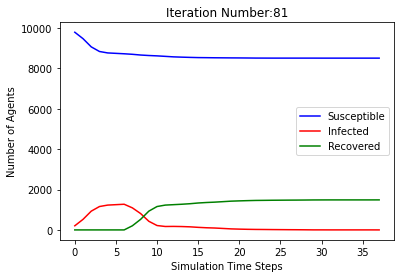

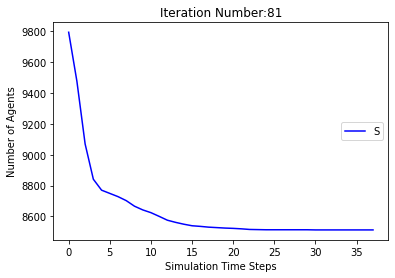

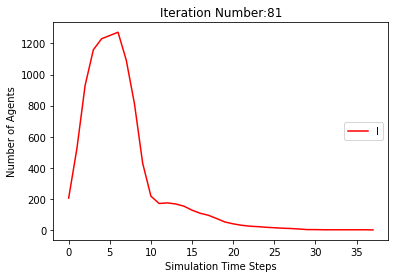

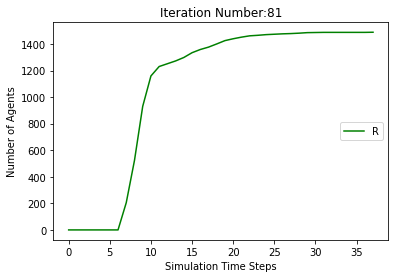

[9795, 9469, 9052, 8842, 8798, 8769, 8743, 8720, 8690, 8667, 8640, 8614, 8604, 8594, 8582, 8579, 8577, 8574, 8572, 8571, 8571, 8570, 8570, 8570, 8570, 8570, 8570, 8569, 8569, 8569, 8569, 8569, 8569, 8569, 8569]
[205, 531, 948, 1158, 1202, 1231, 1257, 1075, 779, 385, 202, 184, 165, 149, 138, 111, 90, 66, 42, 33, 23, 12, 9, 7, 4, 2, 1, 2, 1, 1, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 531, 948, 1158, 1202, 1231, 1257, 1280, 1310, 1333, 1360, 1386, 1396, 1406, 1418, 1421, 1423, 1426, 1428, 1429, 1429, 1430, 1430, 1430, 1430, 1430, 1430, 1431]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612,

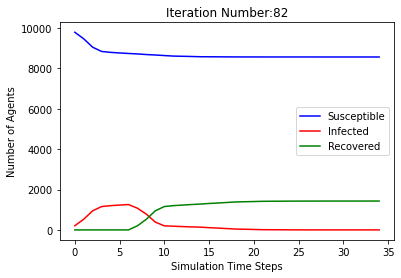

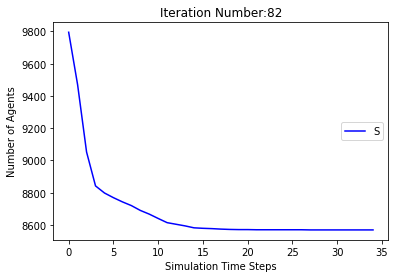

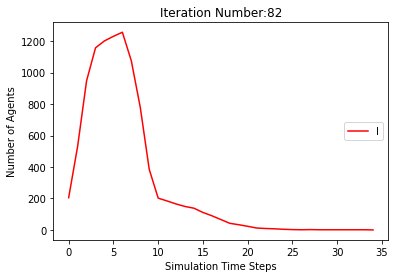

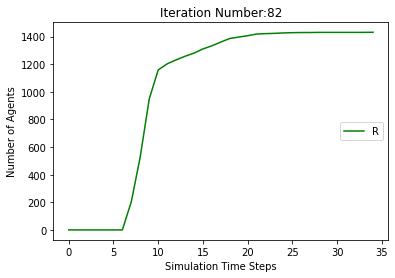

[9795, 9481, 9076, 8842, 8772, 8750, 8733, 8714, 8692, 8675, 8655, 8641, 8630, 8622, 8617, 8615, 8614, 8613, 8612, 8612, 8611, 8611, 8610, 8608, 8607, 8606, 8606, 8605, 8604, 8604, 8604, 8604, 8604, 8604, 8604, 8604]
[205, 519, 924, 1158, 1228, 1250, 1267, 1081, 789, 401, 187, 131, 120, 111, 97, 77, 61, 42, 29, 18, 11, 6, 5, 6, 6, 6, 6, 6, 7, 6, 4, 3, 2, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 519, 924, 1158, 1228, 1250, 1267, 1286, 1308, 1325, 1345, 1359, 1370, 1378, 1383, 1385, 1386, 1387, 1388, 1388, 1389, 1389, 1390, 1392, 1393, 1394, 1394, 1395, 1396]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635,

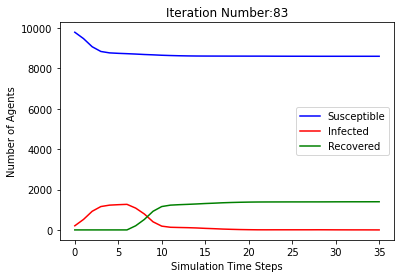

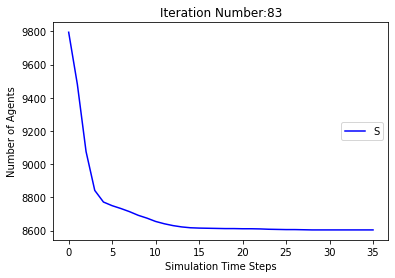

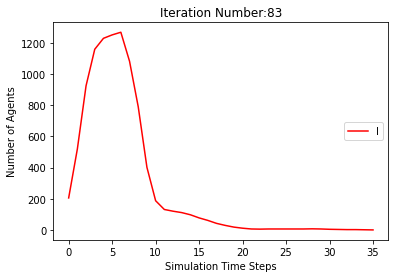

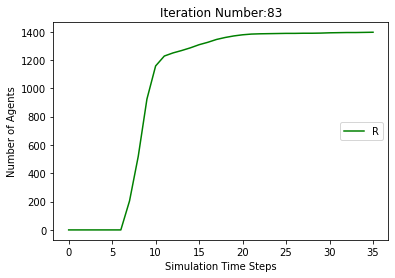

[9795, 9484, 9069, 8837, 8761, 8712, 8670, 8611, 8580, 8553, 8537, 8522, 8514, 8507, 8501, 8491, 8487, 8482, 8479, 8470, 8468, 8467, 8466, 8461, 8461, 8461, 8461, 8461, 8461, 8461, 8461]
[205, 516, 931, 1163, 1239, 1288, 1330, 1184, 904, 516, 300, 239, 198, 163, 110, 89, 66, 55, 43, 44, 39, 34, 25, 26, 21, 18, 9, 7, 6, 5, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 516, 931, 1163, 1239, 1288, 1330, 1389, 1420, 1447, 1463, 1478, 1486, 1493, 1499, 1509, 1513, 1518, 1521, 1530, 1532, 1533, 1534, 1539]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 85

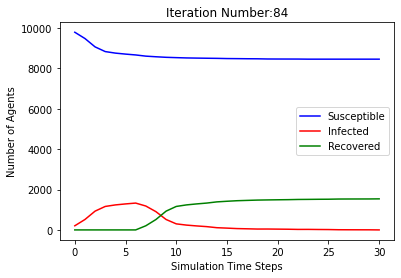

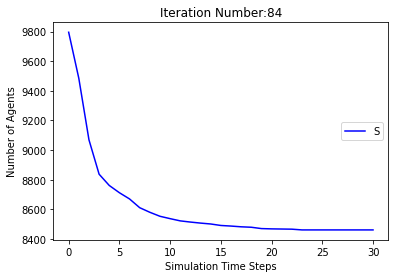

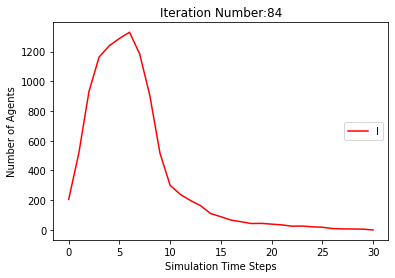

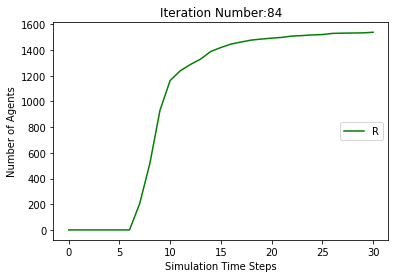

[9795, 9475, 9065, 8863, 8780, 8739, 8721, 8711, 8693, 8676, 8663, 8654, 8647, 8647, 8643, 8642, 8641, 8636, 8633, 8629, 8628, 8628, 8628, 8628, 8628, 8628, 8628, 8628]
[205, 525, 935, 1137, 1220, 1261, 1279, 1084, 782, 389, 200, 126, 92, 74, 68, 51, 35, 27, 21, 18, 19, 15, 14, 13, 8, 5, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 525, 935, 1137, 1220, 1261, 1279, 1289, 1307, 1324, 1337, 1346, 1353, 1353, 1357, 1358, 1359, 1364, 1367, 1371, 1372]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594, 8594, 8594, 8594, 8594], [9795, 9472, 9073, 88

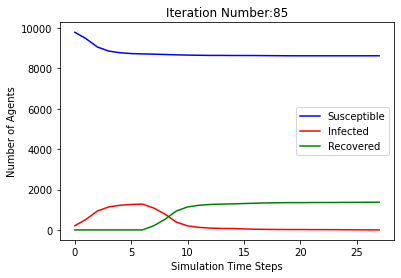

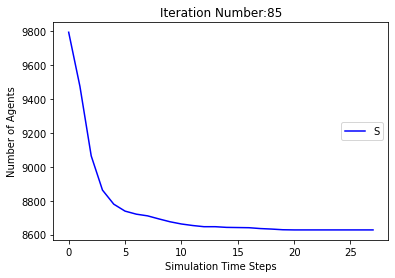

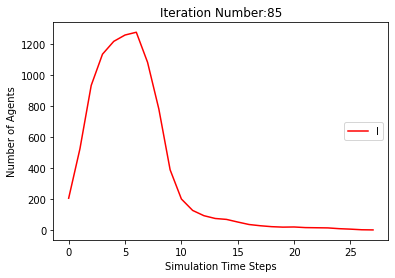

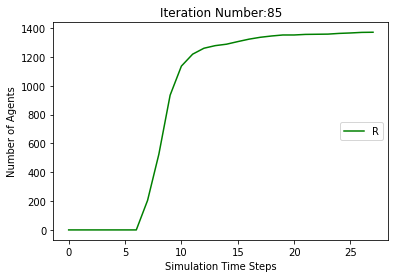

[9795, 9478, 9069, 8857, 8788, 8749, 8712, 8675, 8652, 8624, 8600, 8580, 8569, 8562, 8556, 8545, 8543, 8543, 8543, 8542, 8542, 8542, 8542, 8542, 8542, 8542, 8542]
[205, 522, 931, 1143, 1212, 1251, 1288, 1120, 826, 445, 257, 208, 180, 150, 119, 107, 81, 57, 37, 27, 20, 14, 3, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 522, 931, 1143, 1212, 1251, 1288, 1325, 1348, 1376, 1400, 1420, 1431, 1438, 1444, 1455, 1457, 1457, 1457, 1458]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594, 8594, 8594, 8594, 8594], [9795, 9472, 9073, 8854, 8792, 877

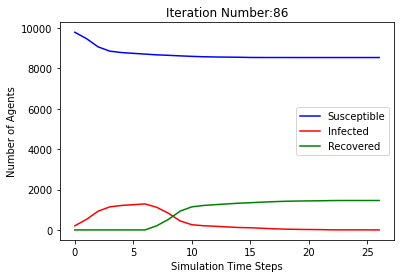

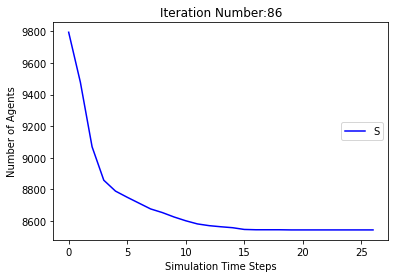

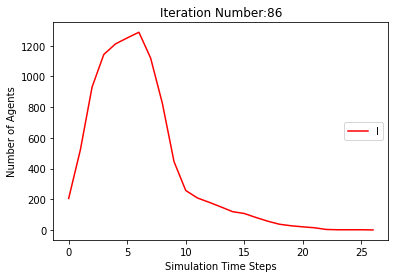

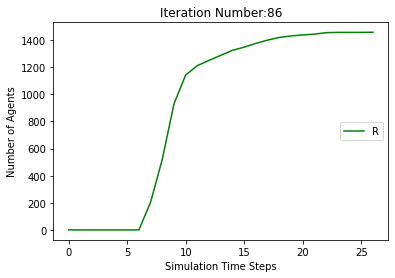

[9795, 9505, 9088, 8846, 8769, 8740, 8719, 8695, 8671, 8644, 8615, 8602, 8590, 8587, 8580, 8572, 8569, 8569, 8569, 8569, 8569, 8568, 8567, 8566, 8564, 8564, 8564, 8564, 8564, 8564, 8564, 8564]
[205, 495, 912, 1154, 1231, 1260, 1281, 1100, 834, 444, 231, 167, 150, 132, 115, 99, 75, 46, 33, 21, 18, 12, 5, 3, 5, 5, 5, 5, 4, 3, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 495, 912, 1154, 1231, 1260, 1281, 1305, 1329, 1356, 1385, 1398, 1410, 1413, 1420, 1428, 1431, 1431, 1431, 1431, 1431, 1432, 1433, 1434, 1436]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 859

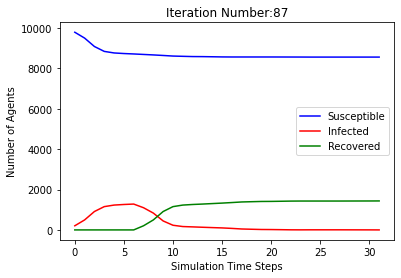

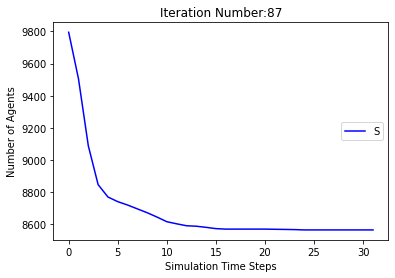

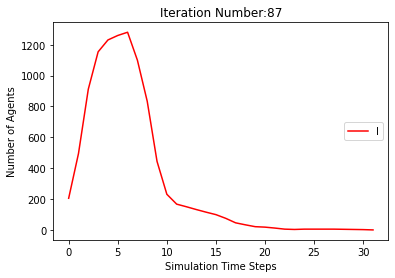

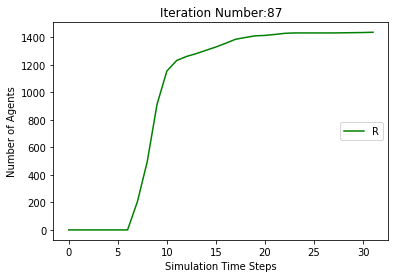

[9795, 9455, 9057, 8862, 8795, 8759, 8733, 8708, 8692, 8687, 8685, 8685, 8682, 8677, 8673, 8671, 8670, 8670, 8670, 8670, 8670, 8670, 8670, 8670]
[205, 545, 943, 1138, 1205, 1241, 1267, 1087, 763, 370, 177, 110, 77, 56, 35, 21, 17, 15, 15, 12, 7, 3, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 545, 943, 1138, 1205, 1241, 1267, 1292, 1308, 1313, 1315, 1315, 1318, 1323, 1327, 1329, 1330]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594, 8594, 8594, 8594, 8594], [9795, 9472, 9073, 8854, 8792, 8770, 8739, 8709, 8679, 8656, 8629, 8606, 8594, 8590, 

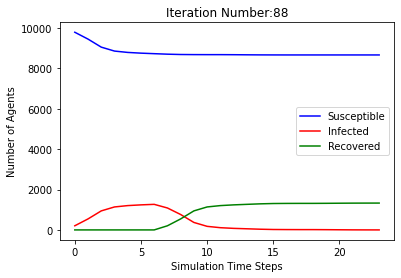

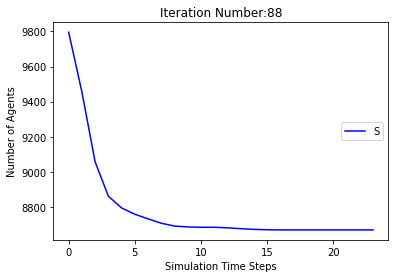

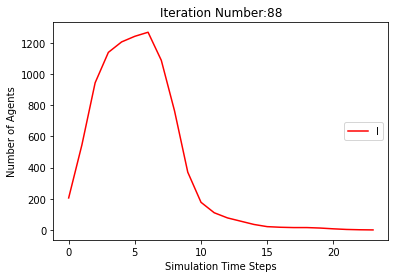

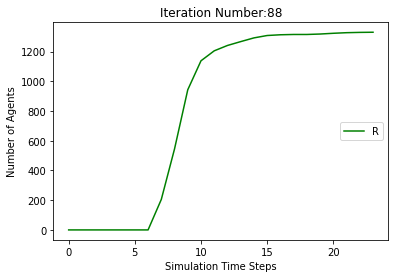

[9795, 9470, 9050, 8835, 8774, 8748, 8726, 8711, 8684, 8646, 8620, 8607, 8598, 8595, 8591, 8588, 8583, 8580, 8580, 8580, 8579, 8578, 8577, 8576, 8576, 8575, 8572, 8569, 8568, 8568, 8568, 8568, 8568, 8568, 8568, 8568]
[205, 530, 950, 1165, 1226, 1252, 1274, 1084, 786, 404, 215, 167, 150, 131, 120, 96, 63, 40, 27, 18, 16, 13, 11, 7, 4, 5, 8, 10, 10, 9, 8, 8, 7, 4, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 530, 950, 1165, 1226, 1252, 1274, 1289, 1316, 1354, 1380, 1393, 1402, 1405, 1409, 1412, 1417, 1420, 1420, 1420, 1421, 1422, 1423, 1424, 1424, 1425, 1428, 1431, 1432]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 

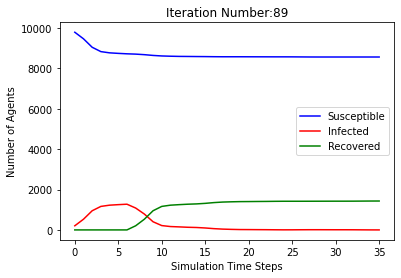

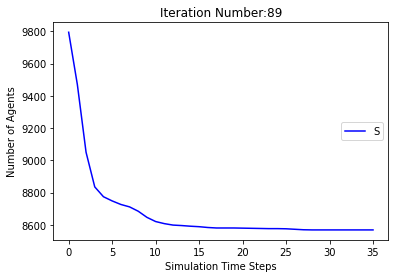

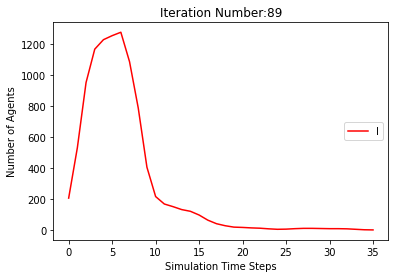

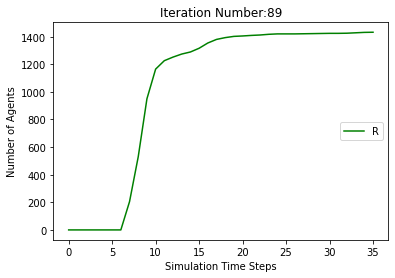

[9795, 9457, 9061, 8842, 8789, 8764, 8752, 8743, 8723, 8693, 8668, 8655, 8646, 8635, 8621, 8612, 8602, 8589, 8581, 8575, 8573, 8572, 8572, 8571, 8569, 8568, 8567, 8565, 8562, 8561, 8561, 8561, 8561, 8561, 8561, 8561, 8561]
[205, 543, 939, 1158, 1211, 1236, 1248, 1052, 734, 368, 174, 134, 118, 117, 122, 111, 91, 79, 74, 71, 62, 49, 40, 31, 20, 13, 8, 8, 10, 11, 10, 8, 7, 6, 4, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 543, 939, 1158, 1211, 1236, 1248, 1257, 1277, 1307, 1332, 1345, 1354, 1365, 1379, 1388, 1398, 1411, 1419, 1425, 1427, 1428, 1428, 1429, 1431, 1432, 1433, 1435, 1438, 1439]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718

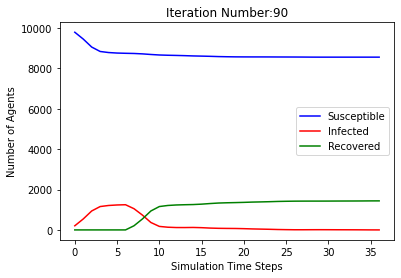

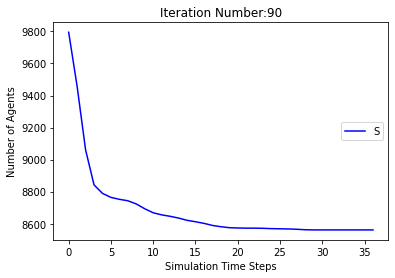

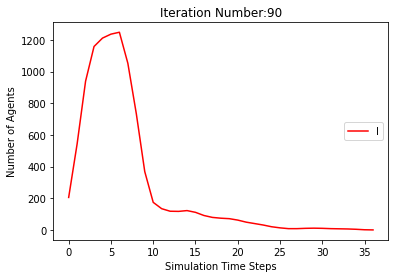

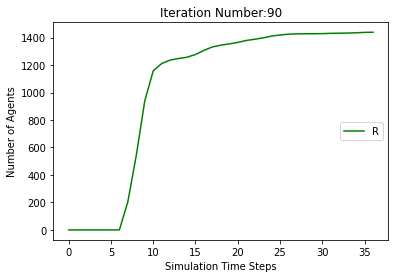

[9795, 9483, 9083, 8846, 8774, 8733, 8690, 8654, 8610, 8580, 8539, 8508, 8496, 8488, 8474, 8459, 8451, 8445, 8439, 8436, 8434, 8430, 8425, 8423, 8419, 8419, 8419, 8419, 8419, 8419, 8419, 8419]
[205, 517, 917, 1154, 1226, 1267, 1310, 1141, 873, 503, 307, 266, 237, 202, 180, 151, 129, 94, 69, 60, 54, 44, 34, 28, 26, 20, 17, 15, 11, 6, 4, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 517, 917, 1154, 1226, 1267, 1310, 1346, 1390, 1420, 1461, 1492, 1504, 1512, 1526, 1541, 1549, 1555, 1561, 1564, 1566, 1570, 1575, 1577, 1581]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 

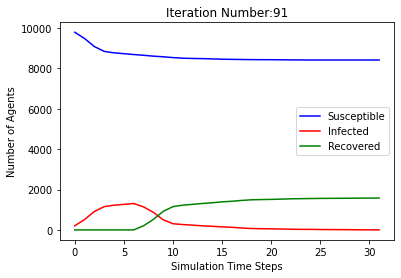

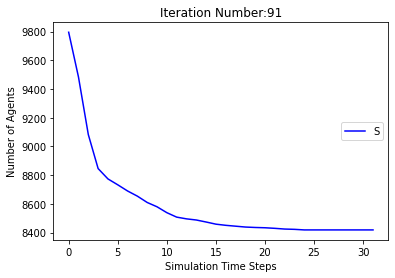

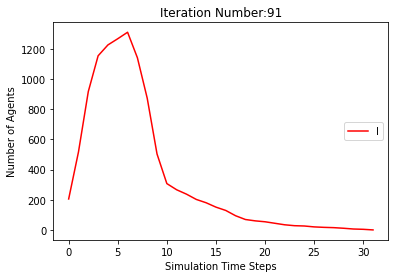

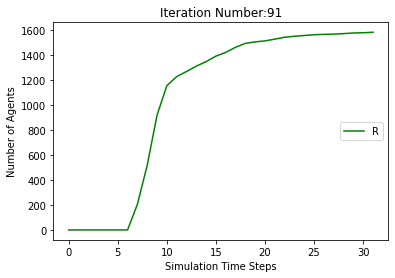

[9795, 9468, 9067, 8844, 8780, 8758, 8742, 8720, 8684, 8656, 8633, 8611, 8602, 8597, 8589, 8583, 8581, 8579, 8579, 8579, 8578, 8578, 8578, 8578, 8577, 8576, 8574, 8574, 8574, 8574, 8574, 8574, 8574, 8574]
[205, 532, 933, 1156, 1220, 1242, 1258, 1075, 784, 411, 211, 169, 156, 145, 131, 101, 75, 54, 32, 23, 19, 11, 5, 3, 2, 3, 5, 4, 4, 4, 4, 3, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 532, 933, 1156, 1220, 1242, 1258, 1280, 1316, 1344, 1367, 1389, 1398, 1403, 1411, 1417, 1419, 1421, 1421, 1421, 1422, 1422, 1422, 1422, 1423, 1424, 1426]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 85

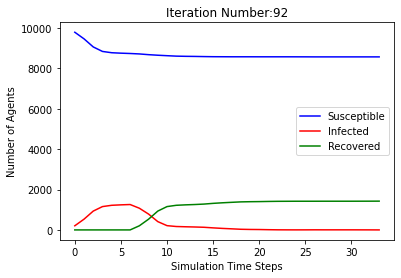

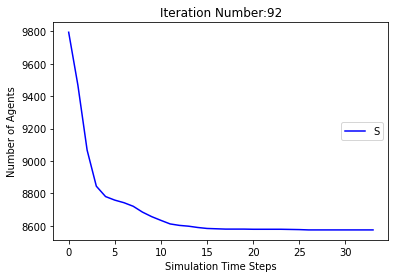

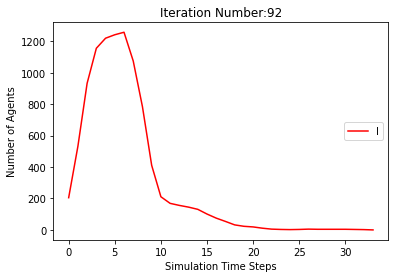

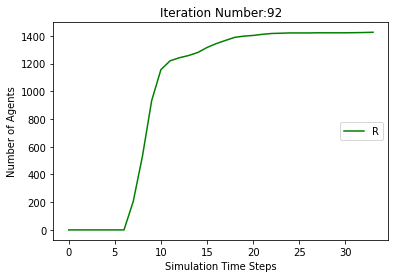

[9795, 9483, 9086, 8856, 8779, 8748, 8717, 8683, 8657, 8627, 8597, 8563, 8531, 8518, 8508, 8504, 8499, 8498, 8494, 8494, 8494, 8494, 8493, 8493, 8492, 8492, 8492, 8492, 8492, 8492, 8492, 8492]
[205, 517, 914, 1144, 1221, 1252, 1283, 1112, 826, 459, 259, 216, 217, 199, 175, 153, 128, 99, 69, 37, 24, 14, 11, 6, 6, 2, 2, 2, 2, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 517, 914, 1144, 1221, 1252, 1283, 1317, 1343, 1373, 1403, 1437, 1469, 1482, 1492, 1496, 1501, 1502, 1506, 1506, 1506, 1506, 1507, 1507, 1508]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 

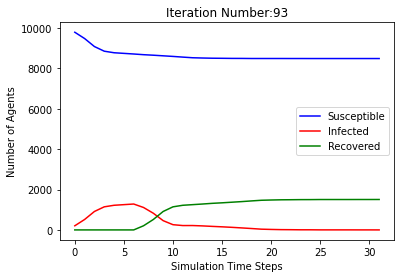

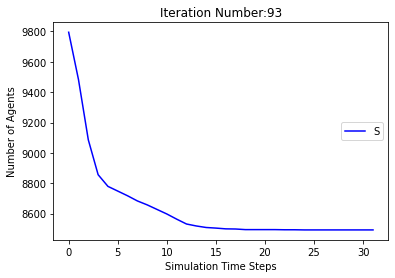

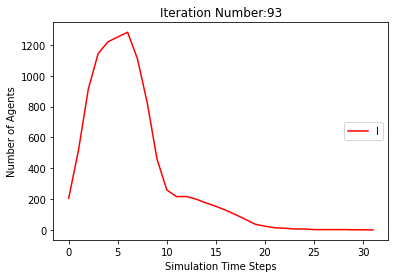

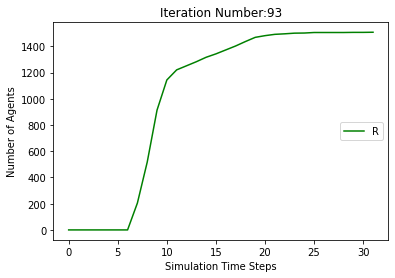

[9795, 9453, 9071, 8855, 8777, 8746, 8721, 8706, 8691, 8673, 8654, 8639, 8629, 8615, 8607, 8605, 8605, 8605, 8604, 8602, 8602, 8600, 8599, 8597, 8596, 8596, 8595, 8594, 8594, 8594, 8594, 8594, 8594, 8594, 8594]
[205, 547, 929, 1145, 1223, 1254, 1279, 1089, 762, 398, 201, 138, 117, 106, 99, 86, 68, 49, 35, 27, 13, 7, 6, 8, 9, 8, 7, 8, 6, 5, 3, 2, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 547, 929, 1145, 1223, 1254, 1279, 1294, 1309, 1327, 1346, 1361, 1371, 1385, 1393, 1395, 1395, 1395, 1396, 1398, 1398, 1400, 1401, 1403, 1404, 1404, 1405, 1406]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 86

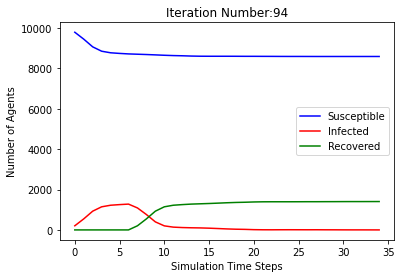

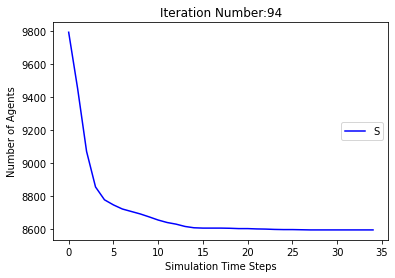

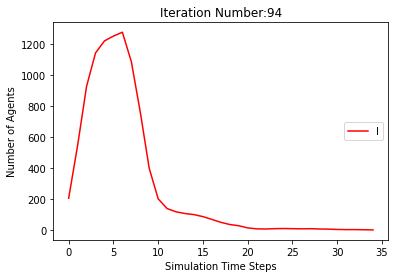

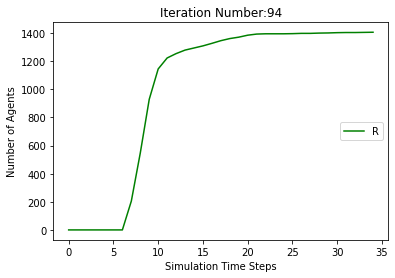

[9795, 9452, 9046, 8832, 8780, 8761, 8742, 8730, 8716, 8697, 8684, 8671, 8660, 8655, 8650, 8648, 8644, 8639, 8638, 8637, 8637, 8637, 8637, 8637, 8637, 8637, 8637]
[205, 548, 954, 1168, 1220, 1239, 1258, 1065, 736, 349, 148, 109, 101, 87, 80, 68, 53, 45, 33, 23, 18, 13, 11, 7, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 548, 954, 1168, 1220, 1239, 1258, 1270, 1284, 1303, 1316, 1329, 1340, 1345, 1350, 1352, 1356, 1361, 1362, 1363]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594, 8594, 8594, 8594, 8594], [9795, 9472, 9073, 8854, 8792, 8770,

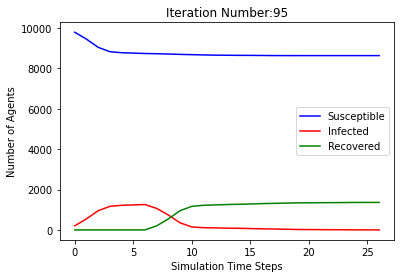

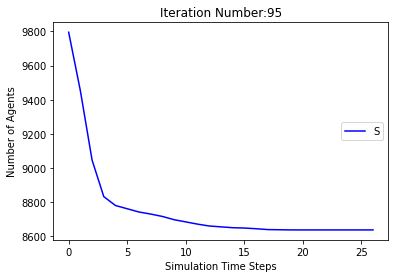

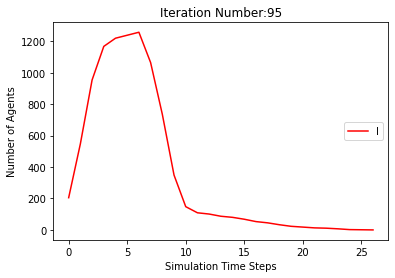

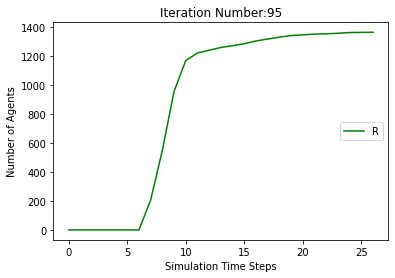

[9795, 9453, 9056, 8835, 8768, 8750, 8723, 8694, 8675, 8655, 8636, 8619, 8606, 8597, 8594, 8582, 8568, 8565, 8563, 8562, 8560, 8557, 8555, 8555, 8555, 8555, 8554, 8554, 8554, 8554, 8554, 8554, 8554, 8554]
[205, 547, 944, 1165, 1232, 1250, 1277, 1101, 778, 401, 199, 149, 144, 126, 100, 93, 87, 71, 56, 44, 37, 37, 27, 13, 10, 8, 8, 6, 3, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 547, 944, 1165, 1232, 1250, 1277, 1306, 1325, 1345, 1364, 1381, 1394, 1403, 1406, 1418, 1432, 1435, 1437, 1438, 1440, 1443, 1445, 1445, 1445, 1445, 1446]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 

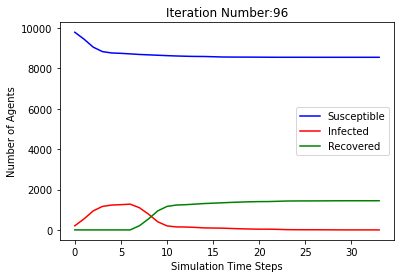

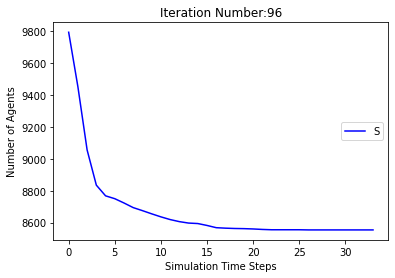

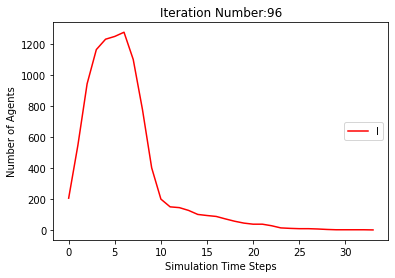

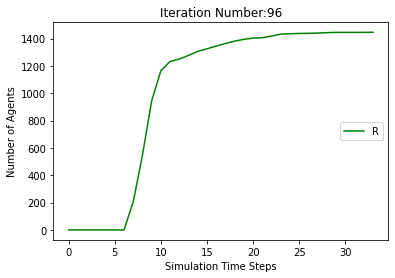

[9795, 9469, 9060, 8854, 8784, 8745, 8710, 8677, 8639, 8614, 8596, 8572, 8563, 8558, 8557, 8557, 8553, 8548, 8541, 8536, 8534, 8532, 8531, 8531, 8531, 8531, 8531, 8531, 8531, 8530, 8530, 8530, 8530, 8530, 8530, 8530, 8530]
[205, 531, 940, 1146, 1216, 1255, 1290, 1118, 830, 446, 258, 212, 182, 152, 120, 82, 61, 48, 31, 27, 24, 25, 26, 22, 17, 10, 5, 3, 1, 1, 1, 1, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 531, 940, 1146, 1216, 1255, 1290, 1323, 1361, 1386, 1404, 1428, 1437, 1442, 1443, 1443, 1447, 1452, 1459, 1464, 1466, 1468, 1469, 1469, 1469, 1469, 1469, 1469, 1469, 1470]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 86

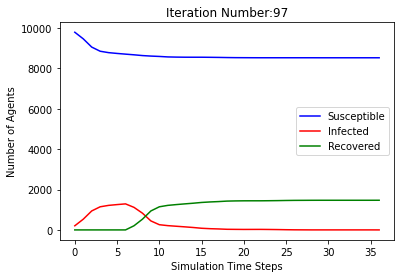

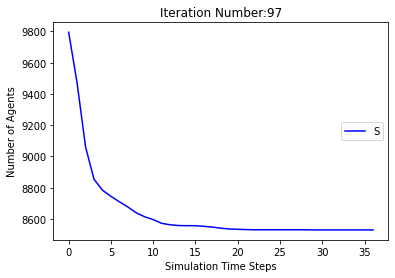

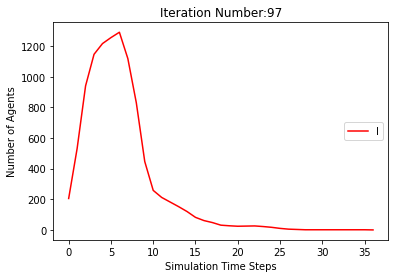

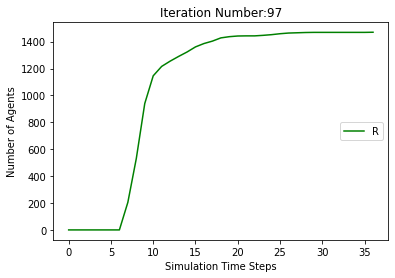

[9795, 9459, 9045, 8842, 8791, 8772, 8746, 8725, 8709, 8695, 8673, 8662, 8653, 8649, 8646, 8645, 8644, 8641, 8638, 8638, 8638, 8638, 8638, 8638, 8638, 8638]
[205, 541, 955, 1158, 1209, 1228, 1254, 1070, 750, 350, 169, 129, 119, 97, 79, 64, 51, 32, 24, 15, 11, 8, 7, 6, 3, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 541, 955, 1158, 1209, 1228, 1254, 1275, 1291, 1305, 1327, 1338, 1347, 1351, 1354, 1355, 1356, 1359, 1362]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594, 8594, 8594, 8594, 8594], [9795, 9472, 9073, 8854, 8792, 8770, 8739, 8709, 8679

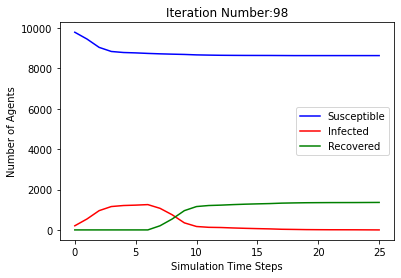

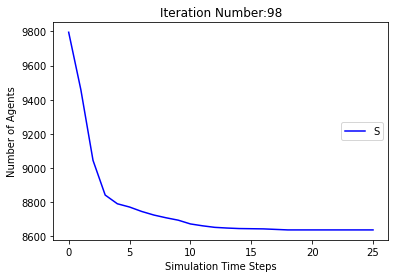

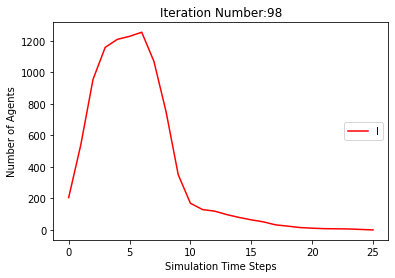

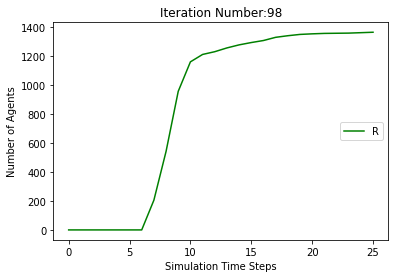

[9795, 9474, 9083, 8849, 8779, 8750, 8735, 8706, 8676, 8658, 8648, 8639, 8628, 8620, 8616, 8615, 8613, 8609, 8606, 8605, 8604, 8601, 8598, 8598, 8598, 8598, 8598, 8598, 8598, 8598]
[205, 526, 917, 1151, 1221, 1250, 1265, 1089, 798, 425, 201, 140, 122, 115, 90, 61, 45, 39, 33, 23, 16, 15, 17, 15, 11, 8, 7, 6, 3, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 526, 917, 1151, 1221, 1250, 1265, 1294, 1324, 1342, 1352, 1361, 1372, 1380, 1384, 1385, 1387, 1391, 1394, 1395, 1396, 1399, 1402]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8602, 8597, 8595, 8595, 8595, 8595, 8594, 8594, 8594, 8594, 8594, 8594, 8

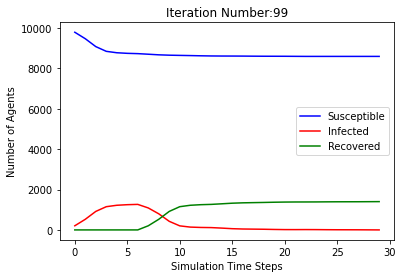

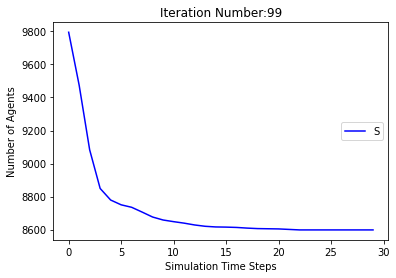

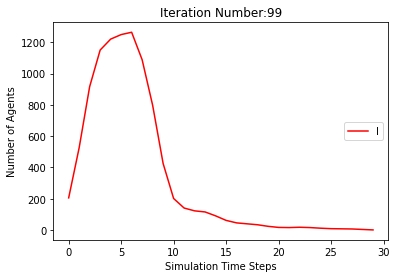

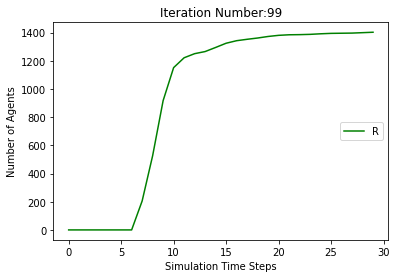

[9795, 9468, 9084, 8845, 8768, 8740, 8707, 8675, 8647, 8619, 8605, 8595, 8589, 8583, 8572, 8571, 8570, 8569, 8566, 8566, 8566, 8566, 8565, 8565, 8565, 8564, 8561, 8560, 8560, 8560, 8560, 8560, 8560, 8560, 8560]
[205, 532, 916, 1155, 1232, 1260, 1293, 1120, 821, 465, 240, 173, 151, 124, 103, 76, 49, 36, 29, 23, 17, 6, 6, 5, 4, 2, 5, 6, 6, 5, 5, 5, 4, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 205, 532, 916, 1155, 1232, 1260, 1293, 1325, 1353, 1381, 1395, 1405, 1411, 1417, 1428, 1429, 1430, 1431, 1434, 1434, 1434, 1434, 1435, 1435, 1435, 1436, 1439, 1440]
[[], [9795, 9497, 9090, 8854, 8790, 8762, 8729, 8701, 8671, 8651, 8636, 8621, 8616, 8613, 8609, 8608, 8607, 8606, 8606, 8606, 8606, 8605, 8605, 8604, 8602, 8602, 8602, 8602, 8602, 8602, 8602, 8602], [9795, 9452, 9081, 8871, 8785, 8747, 8726, 8707, 8687, 8663, 8645, 8631, 8617, 8610, 8601, 8599, 8595, 8594, 8591, 8587, 8585, 8585, 8585, 8585, 8585, 8585, 8585, 8585], [9795, 9498, 9104, 8888, 8812, 8772, 8751, 8718, 8680, 8654, 8643, 8635, 8624, 8612, 8

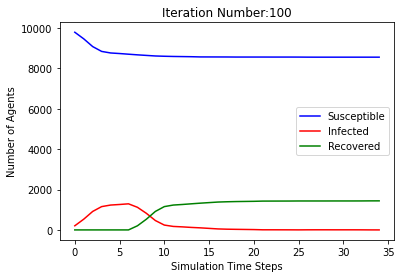

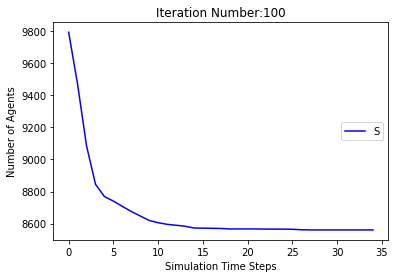

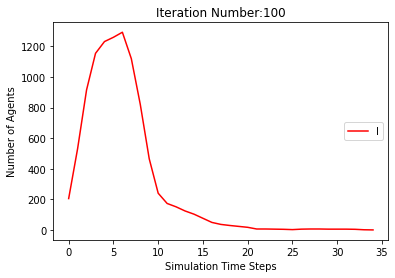

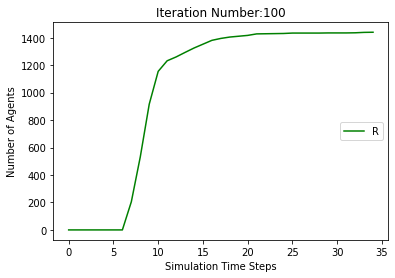

In [13]:
#from numpy import zeros, linspace
#Node_p=Node.copy()
#Node_n=Node.copy() 
#Agent_p=Agent.copy()
#Agent_n=Agent.copy()
#print(Node_p)
#print(Agent_p)
#S,I,R = Count_SIR_Node(Node_n) 
#S1,I1,R1 = Count_SIR_Agent(Agent_n)
#print([S,I,R]) 
#print([S1,I1,R1])
SS,II,RR,TT = [[]],[[]],[[]],[[]]
for i in range(100):
  j=0
  Node_p=Node.copy()
  Node_n=Node.copy() 
  Agent_p=Agent.copy()
  Agent_n=Agent.copy()
  Sj,Ij,Rj = Count_SIR_Node(Node_n) 
  #print([Sj,Ij,Rj]) 
  S,I,R,T = [],[],[],[]
  S.append(Sj)
  I.append(Ij)
  R.append(Rj)
  T.append(j)

  while Ij > 0 :
    Node_p,Node_n,Agent_p,Agent_n = random_walk(Graph,GraphN,Node_n,Agent_n,1,1)
    j+=1 
    #count=0
    #for i in range(len(Node_p)):
    #  count+=len(Node_p[i]) - 4
    #print(count)
    Sj,Ij,Rj = Count_SIR_Node(Node_n) 
    S.append(Sj)
    I.append(Ij)
    R.append(Rj)
    T.append(j)
    #S1,I1,R1 = Count_SIR_Agent(Agent_n)
    #print("Simulation No:",i+1, "Iteration No: ", j)
    #print(Node_n)
    #print(Agent_n)
    #print([Sj,Ij,Rj]) 
    # Plot the data on three separate curves for S(t), I(t) and R(t)
    #print([S1,I1,R1])
  print(S)
  print(I)
  print(R)
  SS.append(S)
  II.append(I)
  RR.append(R)
  TT.append(T)
  print(SS)
  print(II)
  print(RR)
  plt.plot(T, S, 'b', T, I, 'r', T, R, 'g')
  plt.xlabel('Simulation Time Steps')
  plt.title('Iteration Number:'+str(i+1))
  plt.ylabel('Number of Agents')
  plt.legend(("Susceptible", "Infected", "Recovered"),loc='center right')
  plt.show()  
  
  plt.plot(T, S, 'b')
  plt.xlabel('Simulation Time Steps')
  plt.title('Iteration Number:'+str(i+1))
  plt.ylabel('Number of Agents')
  plt.legend(("Susceptible"),loc='center right')
  plt.show()

  plt.plot(T, I, 'r')
  plt.xlabel('Simulation Time Steps')
  plt.title('Iteration Number:'+str(i+1))
  plt.ylabel('Number of Agents')
  plt.legend(("Infected"),loc='center right')
  plt.show()

  plt.plot(T, R, 'g')
  plt.xlabel('Simulation Time Steps')
  plt.title('Iteration Number:'+str(i+1))
  plt.ylabel('Number of Agents')
  plt.legend(("Recovered"),loc='center right')
  plt.show()  

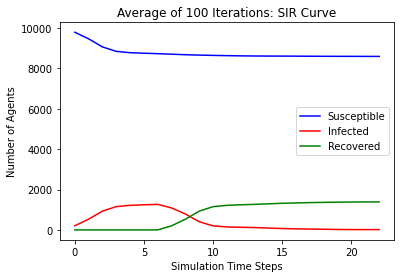

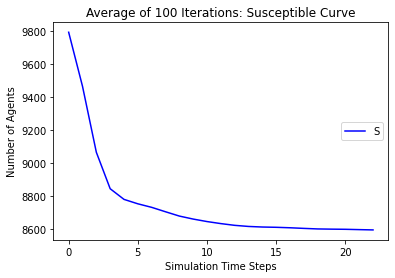

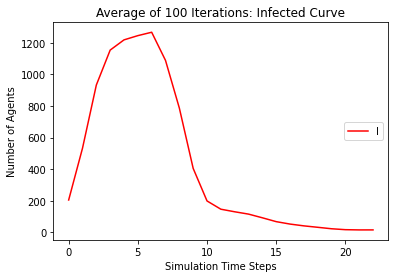

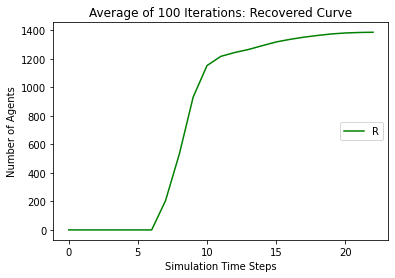

In [14]:
from statistics import mean
SC = SS[1]
IC = II[1]
RC = RR[1]
TC = TT[1]
for i in range(2,100):
  SC = [mean(i) for i in zip(SC,SS[i])] 
  IC = [mean(i) for i in zip(IC,II[i])] 
  RC = [mean(i) for i in zip(RC,RR[i])] 
  TC = [mean(i) for i in zip(TC,TT[i])] 

plt.plot(TC, SC, 'b', TC, IC, 'r', TC, RC, 'g')
plt.xlabel('Simulation Time Steps')
plt.title('Average of 100 Iterations: SIR Curve')
plt.ylabel('Number of Agents')
plt.legend(("Susceptible", "Infected", "Recovered"),loc='center right')
plt.show()  
  
plt.plot(TC, SC, 'b')
plt.xlabel('Simulation Time Steps')
plt.title('Average of 100 Iterations: Susceptible Curve')
plt.ylabel('Number of Agents')
plt.legend(("Susceptible"),loc='center right')
plt.show()

plt.plot(TC, IC, 'r')
plt.xlabel('Simulation Time Steps')
plt.title('Average of 100 Iterations: Infected Curve')
plt.ylabel('Number of Agents')
plt.legend(("Infected"),loc='center right')
plt.show()

plt.plot(TC, RC, 'g')
plt.xlabel('Simulation Time Steps')
plt.title('Average of 100 Iterations: Recovered Curve')
plt.ylabel('Number of Agents')
plt.legend(("Recovered"),loc='center right')
plt.show()  


  
